# Shimming of the OSI2 <b>V1</b> magnet

## with 4 shimming rings

# test of euler rotations

In [105]:

#euler test
import numpy as np

r = np.asarray([1,0,0])
center = np.asarray([0,0,0])
r_centered = r-center
print(r_centered)

a = 90
b = 0
y = -90

from scipy.spatial.transform import Rotation

A = Rotation.from_euler('XYZ',[y, b, a], degrees=True)

rotation_matrix = A.as_matrix()
print(rotation_matrix)


#[190.64 149.49 202.24] -> [280.64        99.50677852 342.22322148]


r_centered_rotated = rotation_matrix@r_centered
r_centered_rotated_shifted = r_centered_rotated+center

print(r_centered_rotated_shifted)

[1 0 0]
[[ 2.22044605e-16 -1.00000000e+00  0.00000000e+00]
 [ 2.22044605e-16  0.00000000e+00  1.00000000e+00]
 [-1.00000000e+00 -2.22044605e-16  2.22044605e-16]]
[ 2.22044605e-16  2.22044605e-16 -1.00000000e+00]


# importing the map

In [111]:
# --- REALITY WAS: --- 
# one ring with fixed euler rotations, sim promises 2500 ppm
# 1. import the b0 map


import numpy as np  
import b0
b0map_iter1 = b0.b0()
filename_to_import_csv_data_from = r'./data/240907/240912_ball_overnight_R120_12pts_bvals_shifted.csv'
#filename_to_import_csv_data_from = r'./data/COMSOL/V1_magnet/240913_ball_R85_9pts_per_radius_before_shim_no_rings_field_components_aligned_bvals_shifted.csv'

b0map_iter1.import_from_csv(filename_to_import_csv_data_from,eulers=[90,0,-90])
# volume from shell init
b0map_iter1.transfer_coordinates_of_the_path_from_cosi_to_magnet(filtering = 1.5,stepsize=10,onesign=True,component=0)

No path object given on construction of b0 object.
 b0 instance initialized without path.
importing b0 object from csv file./data/240907/240912_ball_overnight_R120_12pts_bvals_shifted.csv
No path object given on construction of b0 object.
 b0 instance initialized without path.
warning. path file  /home/cosi/cosi-measure/Software/COSI2/data/240907/240912_ball_overnight_R120_12pts,,,,,,
 not used. path data taken from csv!
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
OOPS, |Bo|=0
importing path from a csv file
ROTATING TH

# Plotting the initial field

19.254201590324808
mean, mT:  -47.49468091087996
low, mT: -47.675 
high, mT: -47.367


<Figure size 640x480 with 0 Axes>

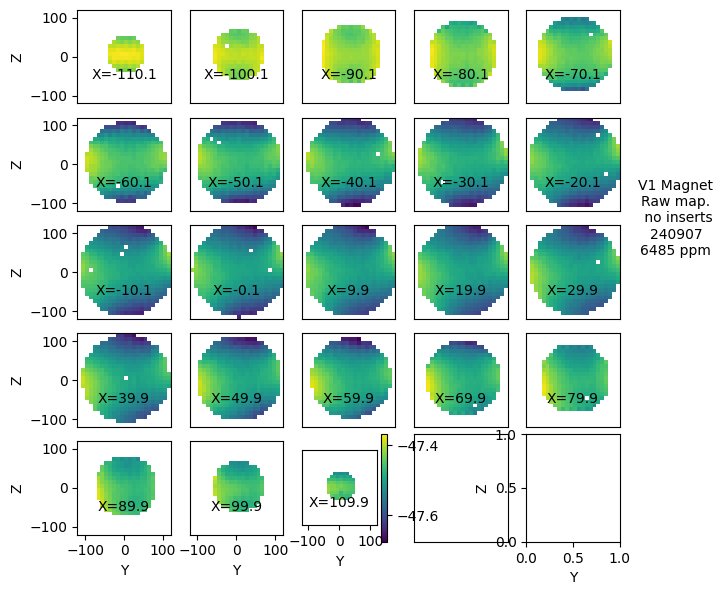

In [112]:

# initial field (RAW)
# save initial field as 2d plots
from matplotlib import pyplot as plt
plt.figure(0)


xvals_raw = b0map_iter1.xPts
y = b0map_iter1.yPts
z = b0map_iter1.zPts

FieldMeasured_init = b0map_iter1.b0Data[:,:,:,0]


fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(7, 7))

#xvals = b0map_comsol.xDim_SPH_fine
print((len(b0map_iter1.path.r))**(1/3))


print('mean, mT: ',np.nanmean(FieldMeasured_init))
print('low, mT:',np.nanmin(FieldMeasured_init),'\nhigh, mT:',np.nanmax(FieldMeasured_init))

homoinit = (np.nanmax(FieldMeasured_init)-np.nanmin(FieldMeasured_init))/np.nanmean(FieldMeasured_init)*1e6

      
for i in range(5):
    for j in range(5):
        if i*5+j >=len(xvals_raw):
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(2.8, 3, 'V1 Magnet\nRaw map.\n no inserts\n240907\n%.0f ppm'%abs(homoinit), horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break
        xxx = axes[i,j].imshow(np.transpose(FieldMeasured_init[i*5+j,:,:]),clim=[np.nanmin(FieldMeasured_init),np.nanmax(FieldMeasured_init)],origin = 'lower',extent=[-120,120,-120,120])
        #xxx = axes[i,j].contourf(z,y,np.transpose(FieldMeasured[i*5+j,:,:]),vmin=np.nanmin(FieldMeasured),vmax=np.nanmax(FieldMeasured))
        
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%b0map_iter1.xPts[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==4:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        axes[i,j].set_aspect(1)
        
        plt.xlabel('Y')
        plt.ylabel('Z')
plt.subplots_adjust(hspace=0)





# Decomposition and fit with spherical harmonics

In [113]:

# spherical decomposition
diameter_of_sphere = b0map_iter1.path.radius*2
order = 11
resolution_of_sph_decomp = 10
print(diameter_of_sphere)

b0map_iter1.fitSphericalHarmonics(maxorder=order,dsv=diameter_of_sphere,resol=resolution_of_sph_decomp)

resolution_of_sph_fit=5
print('interpolating field with sph order %d, resol %.0f mm'%(order,resolution_of_sph_fit))

b0map_iter1.interpolateField(resol=resolution_of_sph_fit,dsv=diameter_of_sphere)


240.00573911701895
[23, 24, 24]
Mean field strength in 24 cm sphere: -47.49 mT
Inhomogeneity in 24 cm sphere: -6485 ppm
Inhomogeneity of fit: 6861 ppm
Error: -1752 ppm
saved numpy array as ./data/tmp/SpHData.npy
interpolating field with sph order 11, resol 5 mm
sph coefficients loaded
making a fine coordinate grid
Inhomogeneity of fit: 7042 ppm
saved numpy array as ./data/tmp/B0_interpolated.npy


In [114]:
# interpolated check
i=4
j=int(len(b0map_iter1.yDim_SPH_fine)/2)-3
k=-4#int(len(b0map_iter1.zDim_SPH_fine)/2)

print('xfine',b0map_iter1.xDim_SPH_fine[i])
print('yfine',b0map_iter1.yDim_SPH_fine[j])
print('zfine',b0map_iter1.zDim_SPH_fine[k])
print('B0interp',b0map_iter1.interpolatedField[i,j,k])

coordinate_grid = b0map_iter1.coord_grid_fine
xx = coordinate_grid[0]
yy = coordinate_grid[1]
zz = coordinate_grid[2]

print('x grid',xx[i,j,k])
print('y grid',yy[i,j,k])
print('z grid',zz[i,j,k])

xfine -100.0023912987579
yfine -15.000358694813684
zfine 105.00251086369579
B0interp nan
x grid -15.000358694813684
y grid -100.0023912987579
z grid 105.00251086369579


In [115]:
#calculate preliminary homogeneity
rawdata = b0map_iter1.fieldDataAlongPath
filteredB0vals = np.zeros(len(rawdata))

for idx,val in enumerate(rawdata):
    B0 = val[0]
    if B0 == 0:
        val = rawdata[idx-1]
        B0=val[0]
    filteredB0vals[idx]=B0
    
print(max(filteredB0vals))
print(min(filteredB0vals))
meanval = np.nanmean(filteredB0vals)

for idx,val in enumerate(filteredB0vals):
    if abs(val/meanval)>2 or abs(val/meanval)<0.5 or val/meanval<0:
        filteredB0vals[idx] = filteredB0vals[idx-1]
        print(val)
        
maxval = max(filteredB0vals)
minval = min(filteredB0vals)
meanval = np.nanmean(filteredB0vals)

print(maxval)
print(minval)
print(meanval)

homoshellinit = (maxval-minval)/meanval*1e6

print('homo on raw data: %.0f'%homoshellinit)



-47.367
-47.675
-47.367
-47.675
-47.494689010680155
homo on raw data: -6485


In [116]:
print(np.nanmin(b0map_iter1.fieldDataAlongPath[:,0]))
print(np.nanmax(b0map_iter1.fieldDataAlongPath[:,0]))
print(np.nanmin(b0map_iter1.b0Data[:,:,:,0]))
print(np.nanmax(b0map_iter1.b0Data[:,:,:,0]))
print(np.nanmin(b0map_iter1.interpolatedField))
print(np.nanmax(b0map_iter1.interpolatedField))


-47.675
-47.367
-47.675
-47.367
-47.66463929070471
-47.330196868652436


# Plotting the interpolated field

mean, mT:  -47.492557959187714
low, mT: -47.70135306722949 
high, mT: -47.323636981064546


<Figure size 640x480 with 0 Axes>

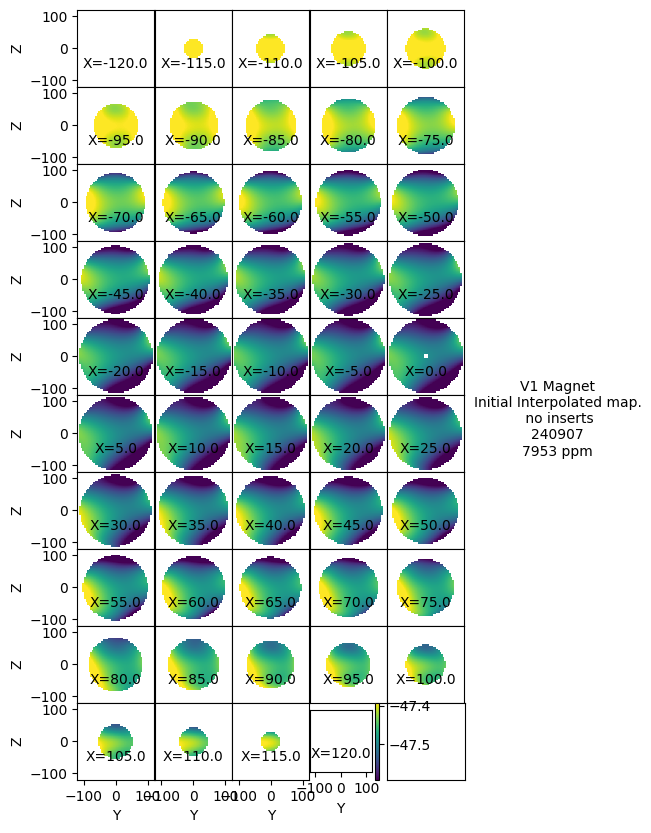

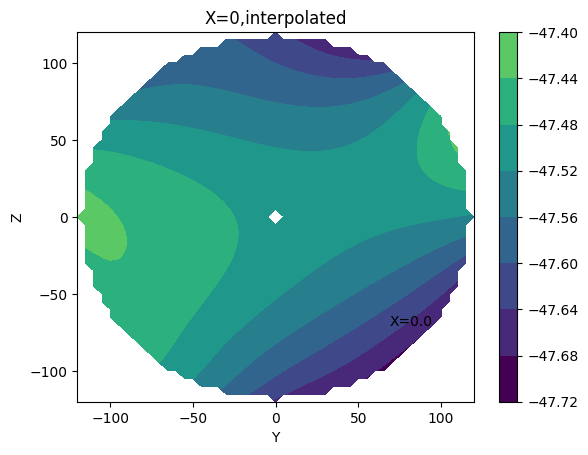

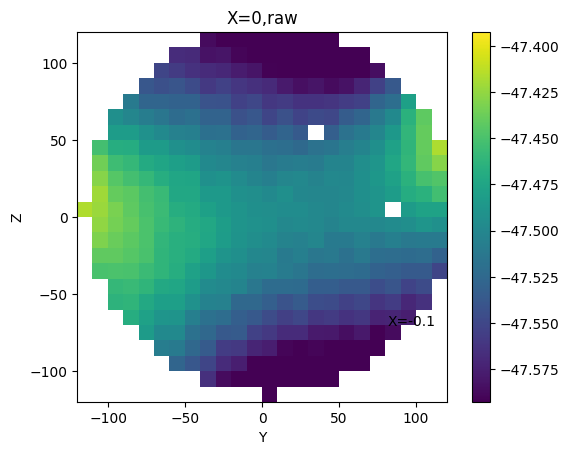

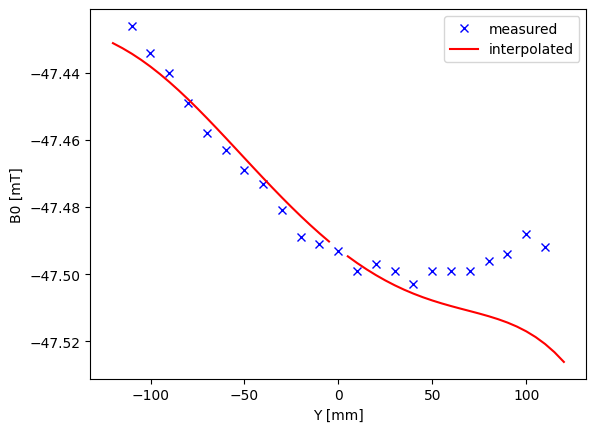

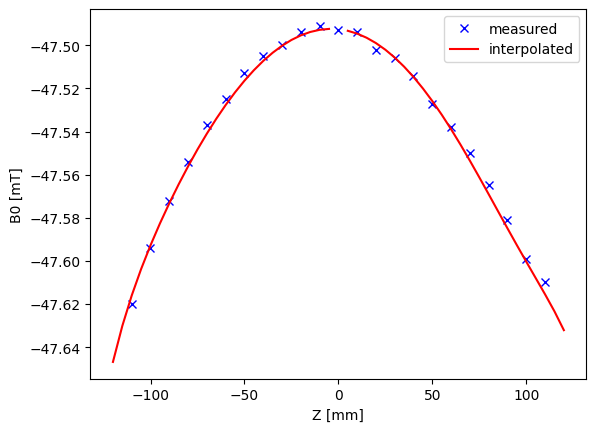

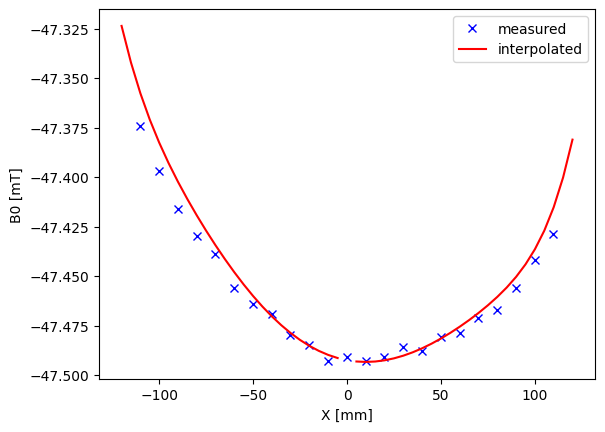

In [295]:

# initial field (INTERPOLATED)
# save initial field as 2d plots
from matplotlib import pyplot as plt
plt.figure(0)


xvals_raw = b0map_iter1.yDim_SPH_fine
y = b0map_iter1.yDim_SPH_fine
z = b0map_iter1.zDim_SPH_fine

#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
FieldMeasured_init = b0map_iter1.interpolatedField + zeroed_mismatch_field #!!!! WARNING! HERE IS THE CORRECTION *AFTER* inserting the shims 
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(5, 10))

print('mean, mT: ',np.nanmean(FieldMeasured_init))
print('low, mT:',np.nanmin(FieldMeasured_init),'\nhigh, mT:',np.nanmax(FieldMeasured_init))

homoinit = (np.nanmax(FieldMeasured_init)-np.nanmin(FieldMeasured_init))/np.nanmean(FieldMeasured_init)*1e6

      
for i in range(10):
    for j in range(5):
        if i*5+j >=len(xvals_raw):
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(2.2, 5, '\n\n\nV1 Magnet\nInitial Interpolated map.\n no inserts\n240907\n%.0f ppm'%abs(homoinit), horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break
        xxx = axes[i,j].imshow(np.transpose(FieldMeasured_init[i*5+j,:,:]),clim=[np.nanmean(FieldMeasured_init)-0.1,np.nanmean(FieldMeasured_init)+0.1],origin = 'lower',extent=[-120,120,-120,120])
        #xxx = axes[i,j].contourf(z,y,np.transpose(FieldMeasured[i*5+j,:,:]),vmin=np.nanmin(FieldMeasured), vmax=np.nanmax(FieldMeasured))
        axes[i,j].set_aspect(1)
        
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%b0map_iter1.xDim_SPH_fine[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==9:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        plt.xlabel('Y')
        plt.ylabel('Z')

plt.subplots_adjust(wspace=-0.0, hspace=0)
plt.show()


# plot at x=0
xsliceidx_finegrid = int(len(b0map_iter1.xDim_SPH_fine)/2)
plt.contourf(y,z,np.transpose(FieldMeasured_init[xsliceidx_finegrid,:,:]),vmin=np.nanmin(FieldMeasured_init),vmax=np.nanmax(FieldMeasured_init))
plt.text(0.5, 0.3, 'X=%.1f'%b0map_iter1.xDim_SPH_fine[xsliceidx_finegrid], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
plt.xlabel('Y')
plt.ylabel('Z')
plt.title('X=0,interpolated')
plt.colorbar()
plt.show()

xsliceidx_rawgrid = int(len(b0map_iter1.xPts)/2)
plt.imshow(np.transpose(b0map_iter1.b0Data[xsliceidx_rawgrid,:,:,0]),clim=[np.nanmean(FieldMeasured_init)-0.1,np.nanmean(FieldMeasured_init)+0.1],origin = 'lower',extent=[-120,120,-120,120])
plt.text(0.5, 0.3, 'X=%.1f'%b0map_iter1.xPts[xsliceidx_rawgrid], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
plt.xlabel('Y')
plt.ylabel('Z')
plt.title('X=0,raw')
plt.colorbar()
plt.show()

b0_along_y_at_z0_raw = b0map_iter1.b0Data[xsliceidx_rawgrid,:,xsliceidx_rawgrid,0]
b0_along_y_at_z0_fine = FieldMeasured_init[xsliceidx_finegrid,:,xsliceidx_finegrid]

yvals_raw = b0map_iter1.yPts
yvals_fine = b0map_iter1.yDim_SPH_fine

plt.plot(yvals_raw,b0_along_y_at_z0_raw,'bx')
plt.plot(yvals_fine,b0_along_y_at_z0_fine,'r')
plt.legend(['measured','interpolated'])

plt.ylabel('B0 [mT]')
plt.xlabel('Y [mm]')
plt.show()

b0_along_z_at_xy0_raw = b0map_iter1.b0Data[xsliceidx_rawgrid,xsliceidx_rawgrid,:,0]
b0_along_z_at_xy0_fine = FieldMeasured_init[xsliceidx_finegrid,xsliceidx_finegrid,:]

zvals_raw = b0map_iter1.zPts
zvals_fine = b0map_iter1.zDim_SPH_fine


plt.plot(zvals_raw,b0_along_z_at_xy0_raw,'bx')
plt.plot(zvals_fine,b0_along_z_at_xy0_fine,'r')
plt.legend(['measured','interpolated'])

plt.ylabel('B0 [mT]')
plt.xlabel('Z [mm]')
plt.show()


b0_along_x_at_yz0_raw = b0map_iter1.b0Data[:,xsliceidx_rawgrid,xsliceidx_rawgrid,0]
b0_along_x_at_yz0_fine = FieldMeasured_init[:,xsliceidx_finegrid,xsliceidx_finegrid]

xvals_raw = b0map_iter1.xPts
xvals_fine = b0map_iter1.xDim_SPH_fine


plt.plot(xvals_raw,b0_along_x_at_yz0_raw,'bx')
plt.plot(zvals_fine,b0_along_x_at_yz0_fine,'r')
plt.legend(['measured','interpolated'])

plt.ylabel('B0 [mT]')
plt.xlabel('X [mm]')
plt.show()



# generating positions of the magnets in the shim rings.


In [296]:

#shim tray configuration
def ringposFromTrayNr(trays_ocp):
    trayslitspacing = 9e-3 # [m]
    coordinates = []
    for tray_pos in trays_ocp:
        coordinate = trayslitspacing*tray_pos-4.5e-3 if tray_pos>0 else trayslitspacing*tray_pos+4.5e-3
        coordinates.append(coordinate)
    return coordinates


shimRadius          =276*1e-3#276*1e-3#!!!TMP 276*1e-3#276*1e-3 <- was set by Tom!      # radius on which the shim magnets are placed

trays_occupied = [-13,-5,1,13] #[-18,-5,1,12] <- 27mm best  [-7,-5,1,14] 997
ringPositions       = ringposFromTrayNr(trays_occupied)#[-121.5*1e-3, -40.5*1e-3, 31.5*1e-3, 121.5*1e-3]#np.linspace(-ringspacingouter,ringspacingouter,4)#np.linspace(-0.1755,0.1755,4)          #np.linspace(-0.2295, .2295, 4) #Z positions to place shin rubgs
print('rings at ',np.array(ringPositions)*1e3,'mm')


rings at  [-112.5  -40.5    4.5  112.5] mm


In [297]:

magsPerSegment      = 7             # number of magnets peer shim tray segment
anglePerSegment     = 19.25 #the angular distance in degrees between the furthest magnets in a shim tray (span of magnets in shim tray)
numSegments         = 12 #corresponds to the number of shim trays


segmentAngles       = np.linspace(0,360, numSegments, endpoint = False)

magAngles           = np.linspace(-anglePerSegment/2, anglePerSegment/2, magsPerSegment) 

print('let us position some magnets on a circumference of a R=%.0f mm YZ circle with X=0'%(shimRadius*1000))

positions = []

for ringPosition in ringPositions:
    for segmentAngle in segmentAngles:
        for magAngle in magAngles:
            position = [ringPosition,shimRadius*np.cos((segmentAngle+magAngle)*np.pi/180), shimRadius*np.sin((segmentAngle+magAngle)*np.pi/180)]
            positions.append(position)
                
print(len(positions))

for pos in positions:
    print('x',pos[0],'y',pos[1],'z',pos[2])


let us position some magnets on a circumference of a R=276 mm YZ circle with X=0
336
x -0.11249999999999999 y 0.27211479674710887 z -0.04614691096140277
x -0.11249999999999999 y 0.2742709847847707 z -0.030845208788272026
x -0.11249999999999999 y 0.27556740718070843 z -0.015446815196073495
x -0.11249999999999999 y 0.276 z 0.0
x -0.11249999999999999 y 0.27556740718070843 z 0.0154468151960735
x -0.11249999999999999 y 0.2742709847847707 z 0.030845208788272037
x -0.11249999999999999 y 0.27211479674710887 z 0.04614691096140277
x -0.11249999999999999 y 0.2587317822093368 z 0.09609300117480107
x -0.11249999999999999 y 0.2529482447387227 z 0.11042275799670676
x -0.11249999999999999 y 0.2463717826715406 z 0.12440636922299107
x -0.11249999999999999 y 0.2390230114445051 z 0.13799999999999998
x -0.11249999999999999 y 0.2309249674754671 z 0.15116103795771738
x -0.11249999999999999 y 0.22210303595045067 z 0.16384822678806393
x -0.11249999999999999 y 0.21258487124793404 z 0.17602179557230782
x -0.1124

# plot magnet positions

Text(0, 0.5, 'Z')

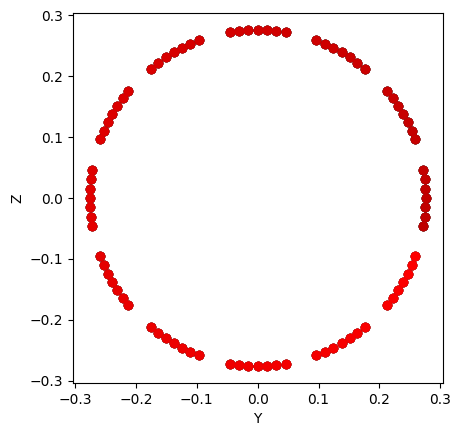

In [298]:
import matplotlib.pyplot as plt
axs = plt.axes()
for idx,position in enumerate(positions):

    axs.scatter(position[1],position[2],color = [idx/len(positions),0,0])
    
axs.set_aspect(1)
plt.xlabel('Y')
plt.ylabel('Z')



# Rendering fields of
# all shim magnets

In [299]:

# shim magnets positinoing

mu                  = 1e-7

magSizeOuter        = 6*1e-3        #size of shim magnets

bRem                = 1.35 # [T]      #remanence field of shim magnets


#initialField = b0map_iter1.interpolatedField
#initialField = b0map_iter1.interpolatedField
numMags = len(positions)
coordinate_grid = b0map_iter1.coord_grid_fine



magnetFields = np.zeros((np.shape(FieldMeasured_init)+(3,numMags)), dtype = np.float32)
magnetFields_fair = np.zeros((np.shape(FieldMeasured_init)+(3,numMags)), dtype = np.float32)


def magnetization(bRem, dimensions, shape = 'cube', evalDistance = 1):
    #Use the analytical expression for the z component of a cube magnet to estimate
    #dipole momentstrength for correct scaling. Dipole approximation only valid 
    #far-ish away from magnet, comparison made at 1 meter distance.
    if shape == 'cube':
        b_analytic = (bRem/np.pi) *(np.arctan2(dimensions**2, 2*evalDistance *np.sqrt(4*(evalDistance**2) + 2*(dimensions**2)))-\
                        np.arctan2(dimensions**2, 2*(dimensions + evalDistance)*\
                                   np.sqrt(4*((dimensions+evalDistance)**2)+2*(dimensions**2))))
    
        dip_mom = b_analytic * (dimensions/2 + evalDistance)**3 /(2*mu) #strength of the dipole moment
    
    return dip_mom


from utils import shimming_magnet

shimming_magnets = []

DSV = 2*max(b0map_iter1.xDim_SPH_fine)#b0map.path.radius*2


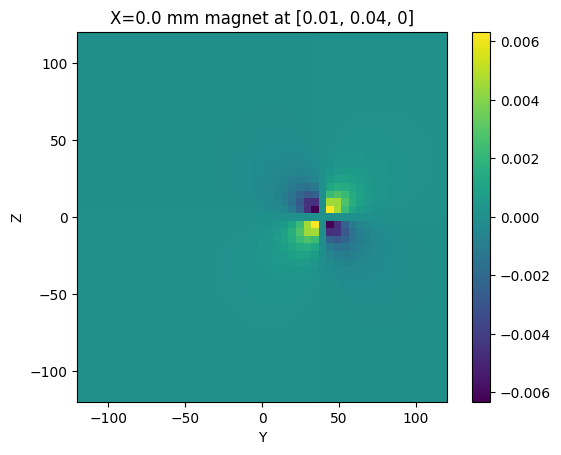

In [300]:

dip_mom = magnetization(bRem=bRem,dimensions=magSizeOuter)
dip_vec = mu*np.array([0,dip_mom,0]) #initially along y


def NEW_singleMagnet(position,dipoleVector,xPts,yPts,zPts):
    '''
    renders 3 components o the field of one magnet in a cubic grid made of xPts, yPts and zPts
    '''
    x,y,z = np.meshgrid(xPts, yPts, zPts, indexing='xy')  
    coord = [x,y,z]
    
    B0 = B0 = np.zeros((len(xPts),len(yPts),len(zPts))+(3,), dtype=np.float32)
    for i in range(len(xPts)):
        for j in range(len(yPts)):
            for k in range(len(zPts)):
                x_i = xPts[i]*1e-3-position[0]
                y_j = yPts[j]*1e-3-position[1]
                z_k = zPts[k]*1e-3-position[2]
                
                rabs = np.sqrt((x_i)**2+(y_j)**2+(z_k)**2)
                
                m_x = dipoleVector[0]
                m_y = dipoleVector[1]
                m_z = dipoleVector[2]
                
                
                
                B0[i,j,k,0] = 3*x_i*(m_x*x_i+m_y*y_j+m_z*z_k)/rabs**5 - m_x/rabs**3
                B0[i,j,k,1] = 3*y_j*(m_x*x_i+m_y*y_j+m_z*z_k)/rabs**5 - m_y/rabs**3
                B0[i,j,k,2] = 3*z_k*(m_x*x_i+m_y*y_j+m_z*z_k)/rabs**5 - m_z/rabs**3
            
    
    return B0
    
xpts = b0map_iter1.xDim_SPH_fine
ypts = b0map_iter1.yDim_SPH_fine
zpts = b0map_iter1.zDim_SPH_fine

positionofsinglemagnet = [10e-3,40e-3,0]
onemagnetfield = NEW_singleMagnet(position=positionofsinglemagnet,dipoleVector=dip_vec,xPts = xpts,yPts=ypts,zPts=zpts)     

plt.show()
xsliceidx = int(len(xpts)/2)
plt.imshow(np.transpose(onemagnetfield[xsliceidx,:,:,2]),origin='lower',extent=[np.nanmin(ypts),np.nanmax(ypts),np.nanmin(zpts),np.nanmax(zpts)])
plt.title('X=%.1f mm '%xpts[xsliceidx]+'magnet at '+str(positionofsinglemagnet))
plt.xlabel('Y')
plt.ylabel('Z')
plt.colorbar()

In [301]:
# Rendering shim magnets fields
for idx1, position in enumerate(positions):
    magnet = shimming_magnet.shimming_magnet(position=position,rotation_yz=0)
    magnet.bRem = bRem# 1.35 T
    magnet.render_field(grid=coordinate_grid)
    

    print('rendering magnet # ',str(idx1),' at ',str(position))
    magnetFields[:,:,:,:,idx1] = NEW_singleMagnet(position=position,dipoleVector=dip_vec,xPts=b0map_iter1.xDim_SPH_fine,yPts=b0map_iter1.yDim_SPH_fine,zPts = b0map_iter1.zDim_SPH_fine)
    
    shimming_magnets.append(magnet)
    print(magnet)

magnetFields *= 1e3

print(DSV)

magnet created, dipole points to  [0. 1. 0.]
ROTATION OF EXPENSIVE MAGNET:0
[0.00000000e+00 2.32047907e-08 0.00000000e+00]
1.35
rendering magnet #  0  at  [-0.11249999999999999, 0.27211479674710887, -0.04614691096140277]
magnet created, dipole points to  [0. 1. 0.]
ROTATION OF EXPENSIVE MAGNET:0
[0.00000000e+00 2.32047907e-08 0.00000000e+00]
1.35
rendering magnet #  1  at  [-0.11249999999999999, 0.2742709847847707, -0.030845208788272026]
magnet created, dipole points to  [0. 1. 0.]
ROTATION OF EXPENSIVE MAGNET:0
[0.00000000e+00 2.32047907e-08 0.00000000e+00]
1.35
rendering magnet #  2  at  [-0.11249999999999999, 0.27556740718070843, -0.015446815196073495]
magnet created, dipole points to  [0. 1. 0.]
ROTATION OF EXPENSIVE MAGNET:0
[0.00000000e+00 2.32047907e-08 0.00000000e+00]
1.35
rendering magnet #  3  at  [-0.11249999999999999, 0.276, 0.0]
magnet created, dipole points to  [0. 1. 0.]
ROTATION OF EXPENSIVE MAGNET:0
[0.00000000e+00 2.32047907e-08 0.00000000e+00]
1.35
rendering magnet #

# Visualizing the field of one shim magnet

magnet at  [-40.5        275.56740718  15.4468152 ]


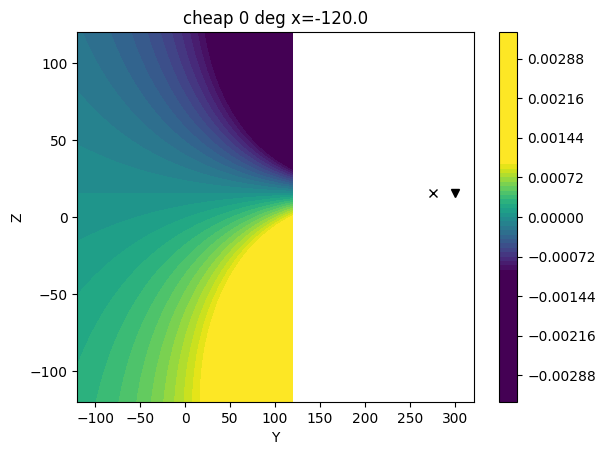

ROTATION OF EXPENSIVE MAGNET:-0
[ 0.00000000e+00  2.32047907e-08 -0.00000000e+00]
1.35


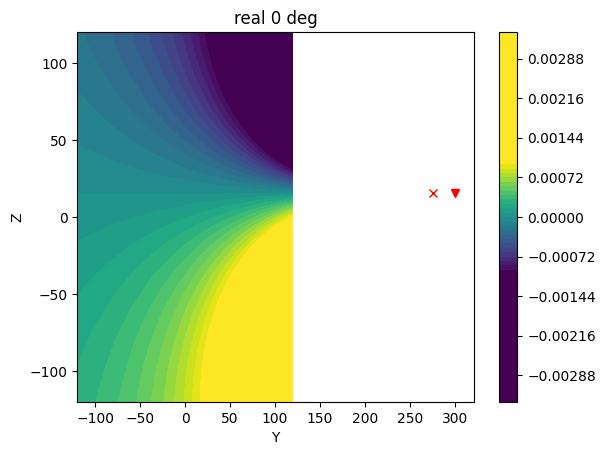

magnet at  [-40.5        275.56740718  15.4468152 ]


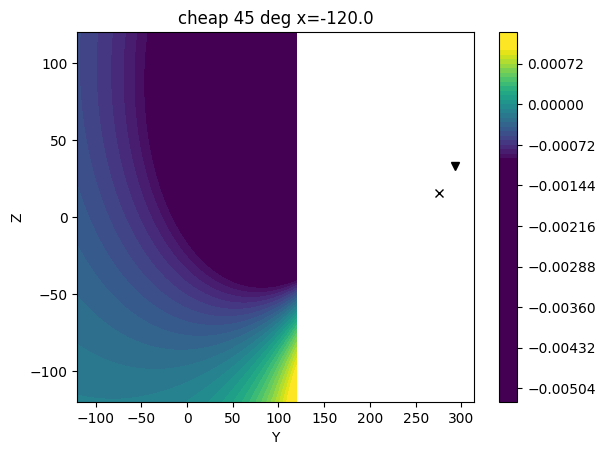

ROTATION OF EXPENSIVE MAGNET:-45
[ 0.00000000e+00  1.64082649e-08 -1.64082649e-08]
1.35


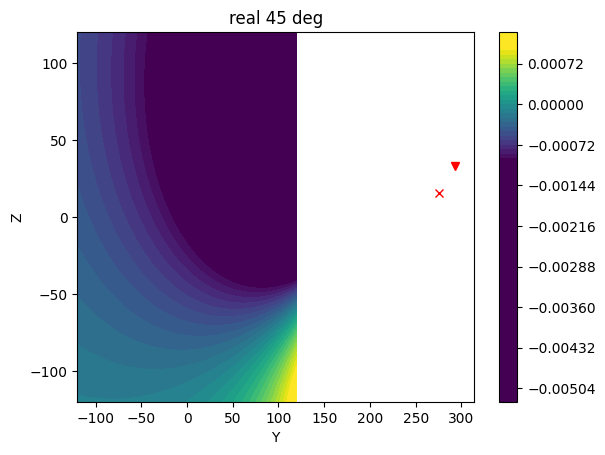

magnet at  [-40.5        275.56740718  15.4468152 ]


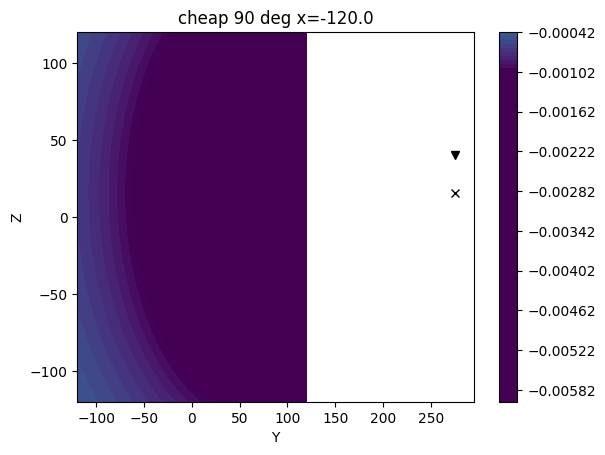

ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35


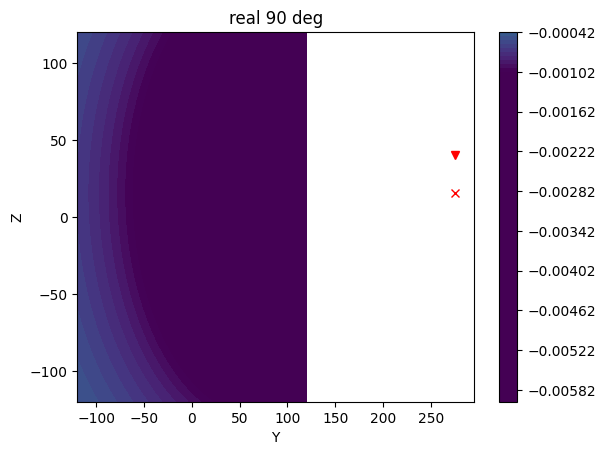

magnet at  [-40.5        275.56740718  15.4468152 ]


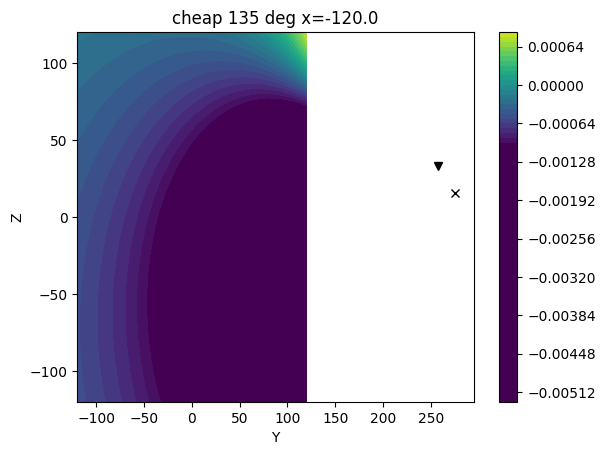

ROTATION OF EXPENSIVE MAGNET:-135
[ 0.00000000e+00 -1.64082649e-08 -1.64082649e-08]
1.35


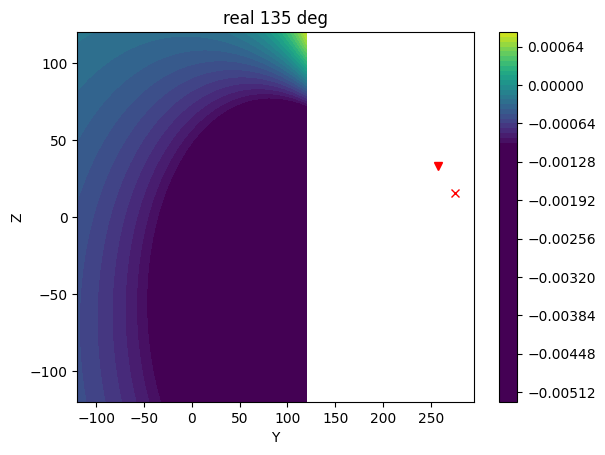

magnet at  [-40.5        275.56740718  15.4468152 ]


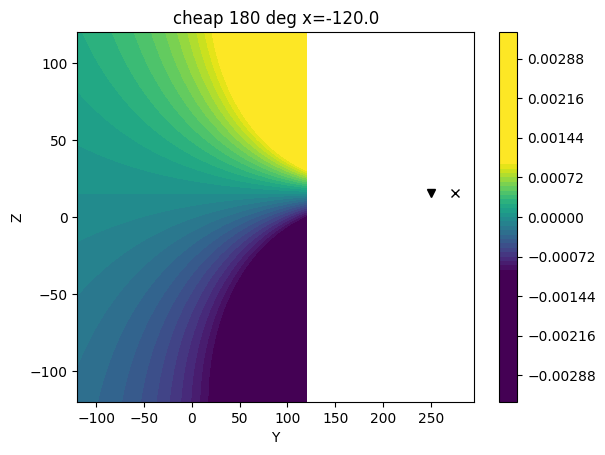

ROTATION OF EXPENSIVE MAGNET:-180
[ 0.00000000e+00 -2.32047907e-08 -2.84176727e-24]
1.35


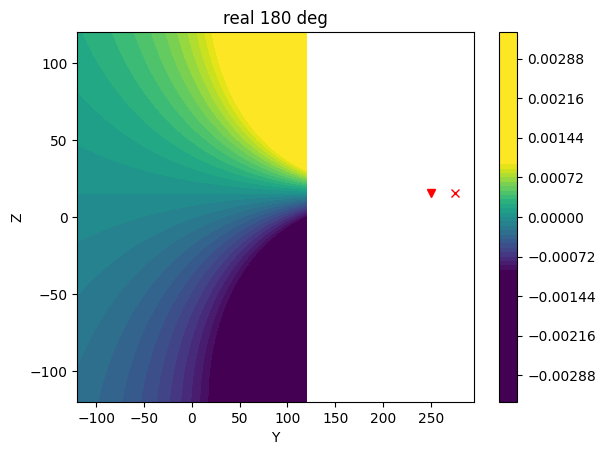

magnet at  [-40.5        275.56740718  15.4468152 ]


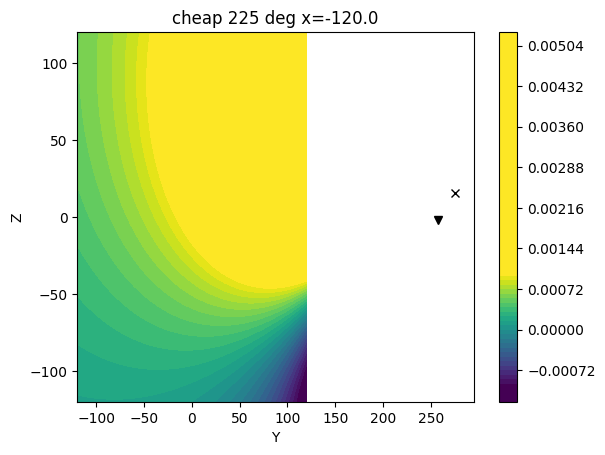

ROTATION OF EXPENSIVE MAGNET:-225
[ 0.00000000e+00 -1.64082649e-08  1.64082649e-08]
1.35


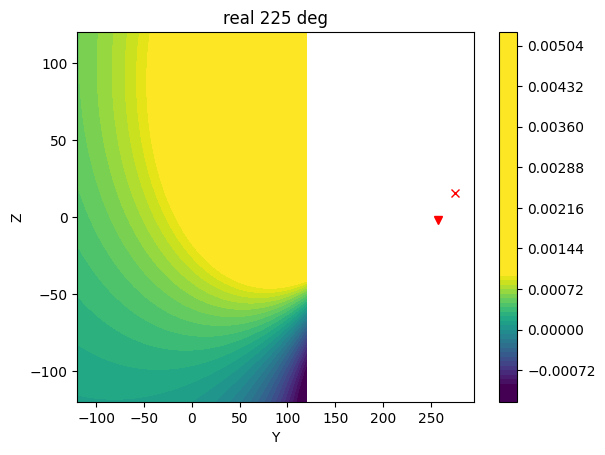

magnet at  [-40.5        275.56740718  15.4468152 ]


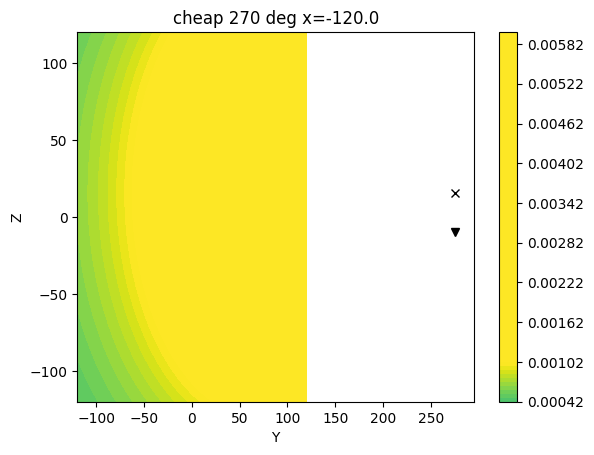

ROTATION OF EXPENSIVE MAGNET:-270
[ 0.00000000e+00 -4.26265090e-24  2.32047907e-08]
1.35


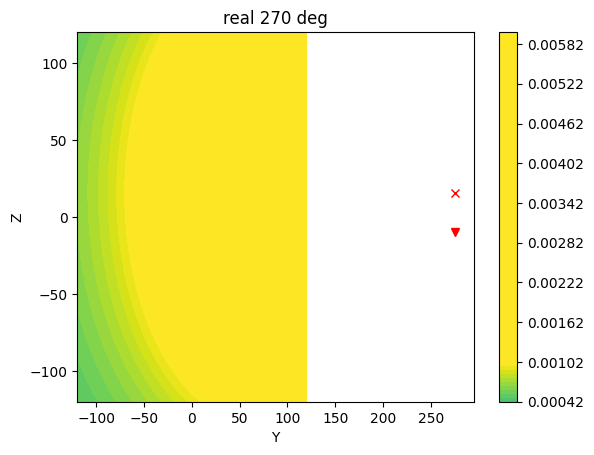

magnet at  [-40.5        275.56740718  15.4468152 ]


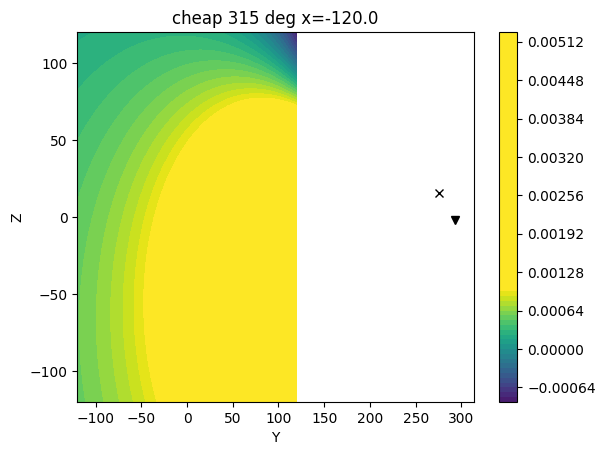

ROTATION OF EXPENSIVE MAGNET:-315
[0.00000000e+00 1.64082649e-08 1.64082649e-08]
1.35


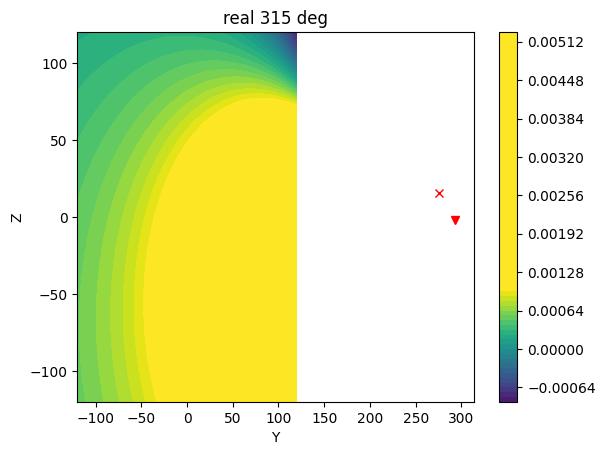

In [303]:
# cheap vs real fields
# DO NOT RUN
plt.cla()

x = b0map_iter1.xDim_SPH_fine*1e0
y = b0map_iter1.yDim_SPH_fine*1e0
z = b0map_iter1.zDim_SPH_fine*1e0

magnet_index = 88
yzsliceidx = 0#int(len(x)/2)
v=max(b0map_iter1.xDim_SPH_fine)
dipole_pointer_length = 25

for i in range(8):
    alpha = i*2*np.pi/8
    position = positions[magnet_index]
    direction = [np.cos(alpha)*dipole_pointer_length,np.sin(alpha)*dipole_pointer_length]
    
    cheapfield = magnetFields[yzsliceidx,:,:,2,magnet_index]*np.cos(alpha)-magnetFields[yzsliceidx,:,:,1,magnet_index]*np.sin(alpha)
    #cheapfield = magnetFields[yzsliceidx,:,:,2,magnet_index]*np.cos(alpha) # Z
    #cheapfield = magnetFields[yzsliceidx,:,:,2,magnet_index]*np.cos(alpha) # Y

    #plt.imshow(cheapfield,vmin=-1e-3, vmax=1e-3,extent=[-v,v,-v,v],origin='lower')
    print('magnet at ', np.array(positions[magnet_index])*1e3)
    plt.contourf(y,z,np.transpose(cheapfield),vmin=-1e-3, vmax=1e-3,levels=100)
    plt.plot(position[1]*1e3,position[2]*1e3,'xk')
    plt.plot(position[1]*1e3+direction[0],position[2]*1e3+direction[1],'vk')
    
    plt.title('cheap %.0f deg x=%.1f'%(alpha*180/np.pi,b0map_iter1.xDim_SPH_fine[yzsliceidx]))
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.colorbar()
    plt.show()
    
    magnet = shimming_magnets[magnet_index]
    magnet.rotation_yz = -alpha
    magnet.bRem = bRem
    magnet.B0 = magnet.B0*0
    magnet.render_field(grid=coordinate_grid)
    magnet.B0*=1e3

    plt.contourf(y,z,np.transpose(magnet.B0[yzsliceidx,:,:,2]),vmin=-1e-3, vmax=1e-3,levels=100)
    plt.plot(position[1]*1e3,position[2]*1e3,'xr')
    plt.plot(position[1]*1e3+direction[0],position[2]*1e3+direction[1],'vr')
    plt.title('real %.0f deg'%(alpha*180/np.pi))
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.colorbar()
    plt.show()
    
    # # DIFF
    # plt.imshow(1e3*(magnet.B0[yzsliceidx,:,:,1])-cheapfield,vmin=-1e-9, vmax=1e-9,extent=[-v,v,-v,v],origin='lower')#!!!!!!!!! 240912
    # plt.title('real-cheap %.0f deg'%(alpha*180/np.pi))
    # plt.xlabel('Z')
    # plt.ylabel('Y')
    # plt.colorbar()
    # plt.show()
    
    
    # ax = plt.subplot(1,1,1)
    # mpbl = ax.contourf(y2d,z2d,(1e3*(magnet.B0[yzsliceidx,:,:,1])),cmap='viridis',levels=64,vmin=-1e-3, vmax=1e-3)#,vmin = -scale, vmax= scale)
    # ax.set_aspect('equal')
    
    # plt.xlabel('Y')
    # plt.ylabel('Z')
    # plt.title('contourf %.0f deg'%(alpha*180/np.pi))
    # plt.show()

# Visualizing the field of **all** shim magnets
### checking the field produced at different rotations
### plotting the field at one slice

ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90

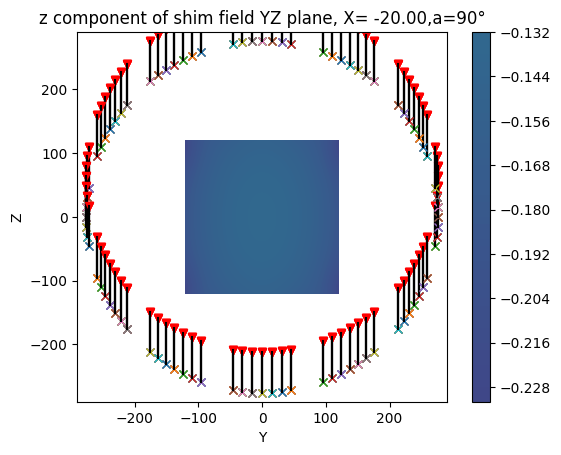

In [304]:

# visualize the field of one insert
resolution = 1/resolution_of_sph_fit*1e3

x = b0map_iter1.xDim_SPH_fine*1e0
y = b0map_iter1.yDim_SPH_fine*1e0
z = b0map_iter1.zDim_SPH_fine*1e0

ONEINSERTFIELD = shimming_magnets[0].B0*0

ax = plt.figure().add_subplot()

for idx in range(len(positions)): #range(40):#

    position = positions[idx]
    

    alpha =  np.pi/2#optimized_vector_of_magnet_rotations[idx]#np.pi
    
    magnet = shimming_magnets[idx]
    magnet.rotation_yz = -alpha 
    magnet.bRem = bRem
    magnet.render_field(grid=coordinate_grid)
    print(shimming_magnets[idx])

    ONEINSERTFIELD += magnet.B0  #magnetFields[:,:,:,:,idx]#+magnetFields[:,:,:,:,idx+14]

    
    ax.plot(position[1]*1000,position[2]*1000,'x')
    dispveclen = 64 # len of arrow
    direction = [dispveclen*np.cos(alpha),dispveclen*np.sin(alpha)] #!!!!!!!!! 240916
    ax.plot(position[1]*1000+direction[0],position[2]*1000+direction[1],'rv')
    
    ax.plot([position[1]*1000,position[1]*1000+direction[0]],[position[2]*1000,position[2]*1000+direction[1]],'k-')

ONEINSERTFIELD*=1e3 #mT
scale = 0.4
yzsliceindex = 20
mpbl = ax.contourf(y,z,np.transpose(ONEINSERTFIELD[yzsliceindex,:,:,2]),cmap='viridis',levels=64,vmin = -scale, vmax= scale)#,vmin=np.nanmin(ONEINSERTFIELD[:,:,:,2]),vmax=np.nanmax(ONEINSERTFIELD[:,:,:,2]))#,vmin = -scale, vmax= scale)

plt.colorbar(mappable=mpbl)
#ax.plot(min(Y),min(Z),'ko')
#ax.plot(max(Y),max(Z),'ko')

ax.set_xlabel('Y')
ax.set_ylabel('Z')
ax.set_xlim(-290,290)
ax.set_ylim(-290,290)
ax.set_aspect(1)
                
ax.set_title('z component of shim field YZ plane, X= %.2f,a=%.0f°'%(x[yzsliceindex],alpha*180/np.pi))

plt.savefig('./pics/field_of_ALL_INSERTS_ITER2_INITIAL.png',format="png")
plt.savefig('./pics/field_of_ALL_INSERTS_ITER2_INITIAL.pdf',format="pdf")

plt.show()

# Rendering field of shim magnets
### in the volume of the ball

In [305]:

MagnetsField_simulated = shimming_magnets[2].B0[:,:,:,2]*0
    

for magnet_index, pos in enumerate(positions):

    alpha = np.pi/2#-np.pi/2#np.pi/2#np.pi/2#!TEMP-np.pi/2
    cheapfield_onemagnet = magnetFields[yzsliceidx,:,:,2,magnet_index]*np.cos(alpha)-magnetFields[yzsliceidx,:,:,1,magnet_index]*np.sin(alpha)

    MagnetsField_simulated += cheapfield_onemagnet

    
    
#mask the one magnet field:
MagnetsField_simulated*= b0map_iter1.sphere_mask
#MagnetsField_simulated*=1e3 

homo_oneMagnet = (np.nanmax(MagnetsField_simulated)-np.nanmin(MagnetsField_simulated))/np.nanmean(MagnetsField_simulated)*1e6
print('homo of one magnet ppm %.0f'%(abs(homo_oneMagnet)))
print('mean mT %.2f'%(abs(np.nanmin(MagnetsField_simulated))))

homo of one magnet ppm 256741
mean mT 0.11


<Figure size 640x480 with 0 Axes>

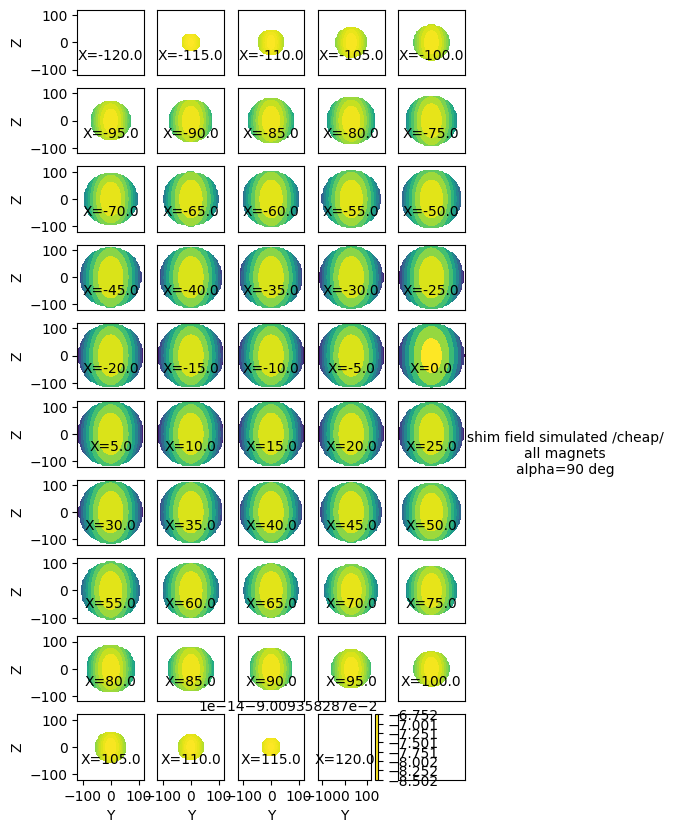

In [306]:
# what we expect with insert at min_z 0y ring 0:
plt.figure(0)

fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(5, 10))

xvals_raw = b0map_iter1.xDim_SPH_fine

for i in range(10):
    for j in range(5):
        if i*5+j >=len(xvals_raw):
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(2.5, 5, 'shim field simulated /cheap/\nall magnets\nalpha=%.0f deg'%(alpha*180/np.pi) , horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break
        xxx = axes[i,j].contourf(y,z,np.transpose(MagnetsField_simulated[i*5+j,:,:]),vmin=np.nanmin(MagnetsField_simulated),vmax=np.nanmax(MagnetsField_simulated),origin = 'lower',extent=[-120,120,-120,120])
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%xvals_raw[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==9:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        plt.xlabel('Y')
        plt.ylabel('Z')


plt.savefig('./pics/iter2_init_field_interp.png',format="png")
plt.savefig('./pics/iter2_init_field_interp.pdf',format="pdf")
plt.show()

# Masking the shim magnet fields 

### with a spherical mask

# Stacking the components of the masked fields [B_y,B_z] 

(49, 49, 49, 3, 336)


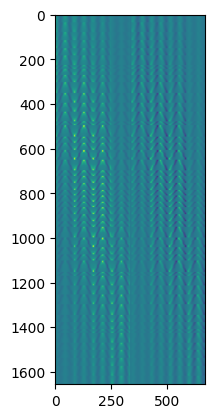

In [336]:

b0map = b0map_iter1

DSV = b0map.path.radius*2 # 
DSV_INNER = b0map.path.radius*1.98 #!!!TEMP*1.96#1.95 # DEFINED ABOVE!
# make a spherical mask with diameter DSV
sphereMask = np.zeros(np.shape(coordinate_grid[0]), dtype = float)
sphereMask[np.square(coordinate_grid[0]) + np.square(coordinate_grid[1]) + np.square(coordinate_grid[2]) <= (DSV/2)**2] = 1 
sphereMask[np.square(coordinate_grid[0]) + np.square(coordinate_grid[1]) + np.square(coordinate_grid[2]) <= (DSV_INNER/2)**2] = 0 

sphereMask[sphereMask == 0] = np.nan

print(np.shape(magnetFields))

maskedFields = magnetFields[sphereMask == 1, :,:].astype(float) #!!! TEMP!!!!
maskedFields_stacked = np.hstack((maskedFields[:,1,:],maskedFields[:,2,:])) # WE HAVE Y AND Z


plt.imshow(maskedFields_stacked) #

# Rotating the stacked fields
### with matmul to *-sin* and *cos* of the field components 

In [337]:


print(np.shape(maskedFields_stacked))

vector_of_magnet_rotations = np.zeros(len(shimming_magnets))

stackedRotationVector = np.hstack([-np.sin(vector_of_magnet_rotations),np.cos(vector_of_magnet_rotations)])
print(np.shape(stackedRotationVector))

rotatedFieldOfShimMagnetsStacked = np.matmul(maskedFields_stacked,stackedRotationVector)

print(np.shape(rotatedFieldOfShimMagnetsStacked))

(1656, 672)
(672,)
(1656,)


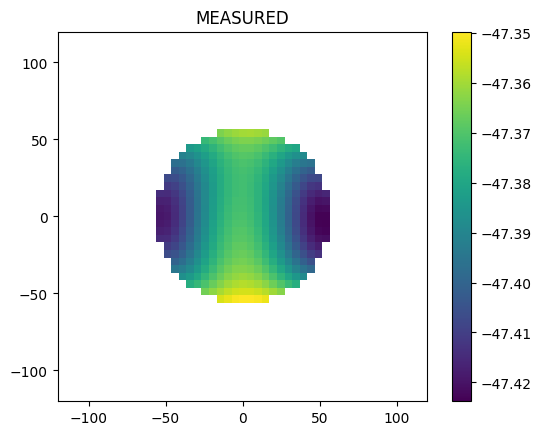

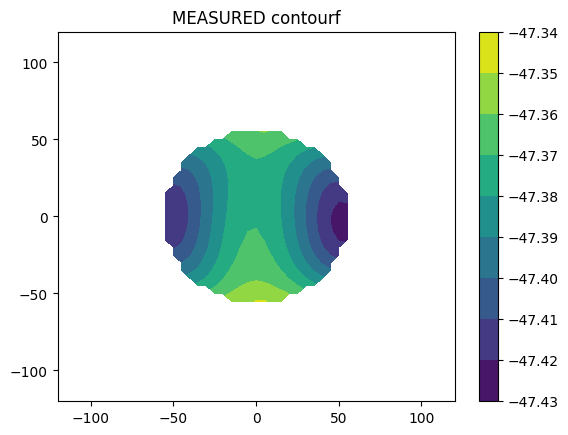

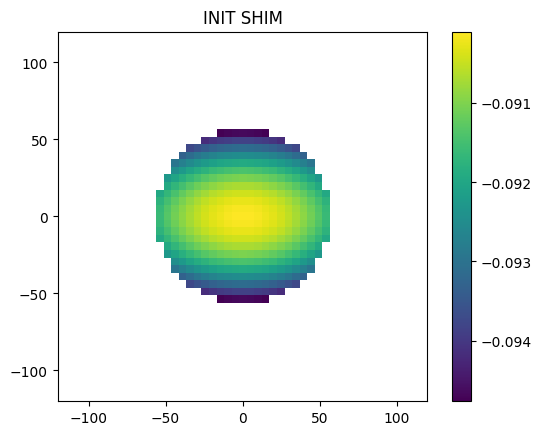

(1656,)
(49, 49, 49)


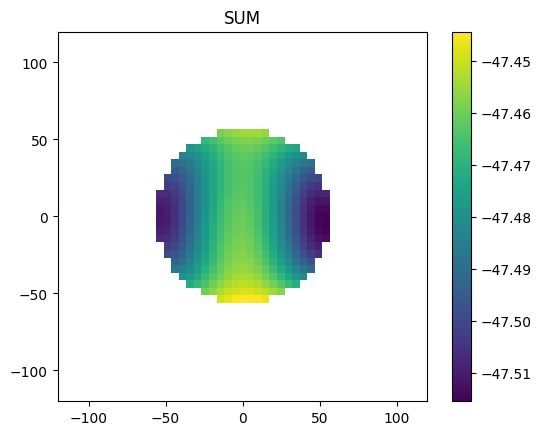

In [338]:
plt.imshow(FieldMeasured_init[3,:,:],origin = 'lower',extent=[-120,120,-120,120])
plt.title('MEASURED')
plt.colorbar()
plt.show()

plt.contourf(y,z,FieldMeasured_init[3,:,:],origin = 'lower',extent=[-120,120,-120,120])
plt.title('MEASURED contourf')
plt.colorbar()
plt.show()

plt.imshow(MagnetsField_simulated[3,:,:],origin = 'lower',extent=[-120,120,-120,120])
plt.title('INIT SHIM')
plt.colorbar()
plt.show()
plt.imshow(FieldMeasured_init[3,:,:]+1*MagnetsField_simulated[3,:,:],origin = 'lower',extent=[-120,120,-120,120])
plt.colorbar()
plt.title('SUM')


initialFieldMasked = FieldMeasured_init[sphereMask == 1]
print(np.shape(initialFieldMasked))
print(np.shape(FieldMeasured_init))

# LEAST SQUARES optimization
## of magnet rotations

In [339]:
# ok now we have magnet fields and vector of magnet rotations. we can make fields now
def _dataFitting(shimVector):

            stackedRotationVector = np.hstack([-np.sin(shimVector),np.cos(shimVector)]) #!!!240918
            shimField = np.matmul(maskedFields_stacked,stackedRotationVector)+initialFieldMasked

            return np.square(((shimField)/np.mean(shimField)) -1)*1e9
        

# calculate shim of current magnet rotations

RING 0 INSERT 5 soll: 66  ist(?): 90
RING 0 INSERT 5 soll: 68  ist(?): 90
RING 0 INSERT 5 soll: 68  ist(?): 90
RING 0 INSERT 5 soll: 63  ist(?): 90
RING 0 INSERT 5 soll: 54  ist(?): 90
RING 0 INSERT 5 soll: 44  ist(?): 90
RING 0 INSERT 5 soll: 35  ist(?): 90
RING 1 INSERT 5 soll: 212  ist(?): 90
RING 1 INSERT 5 soll: 218  ist(?): 90
RING 1 INSERT 5 soll: 224  ist(?): 90
RING 1 INSERT 5 soll: 230  ist(?): 90
RING 1 INSERT 5 soll: 237  ist(?): 90
RING 1 INSERT 5 soll: 244  ist(?): 90
RING 1 INSERT 5 soll: 251  ist(?): 90
RING 2 INSERT 5 soll: 211  ist(?): 90
RING 2 INSERT 5 soll: 217  ist(?): 90
RING 2 INSERT 5 soll: 223  ist(?): 90
RING 2 INSERT 5 soll: 230  ist(?): 90
RING 2 INSERT 5 soll: 236  ist(?): 90
RING 2 INSERT 5 soll: 243  ist(?): 90
RING 2 INSERT 5 soll: 250  ist(?): 90
RING 3 INSERT 5 soll: 133  ist(?): 90
RING 3 INSERT 5 soll: 141  ist(?): 90
RING 3 INSERT 5 soll: 148  ist(?): 90
RING 3 INSERT 5 soll: 157  ist(?): 90
RING 3 INSERT 5 soll: 167  ist(?): 90
RING 3 INSERT 5 sol

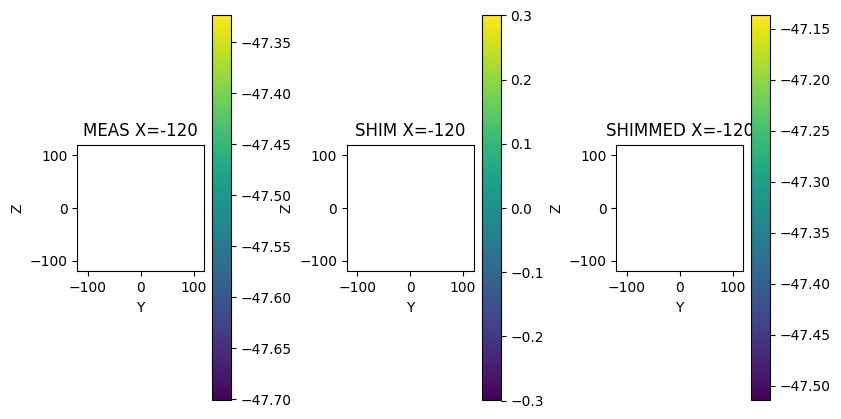

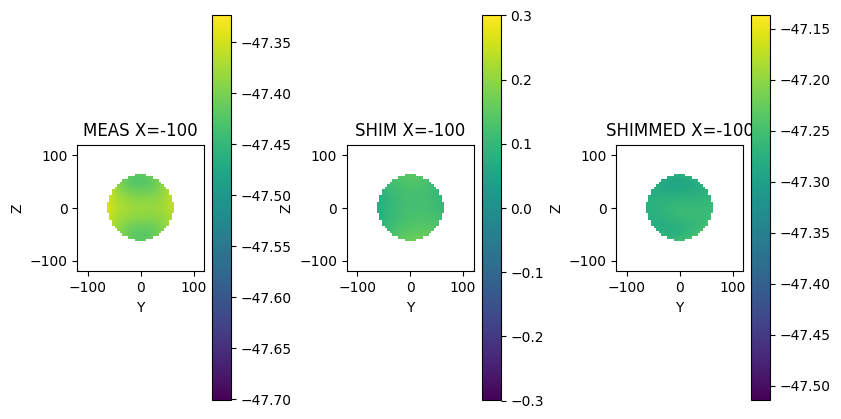

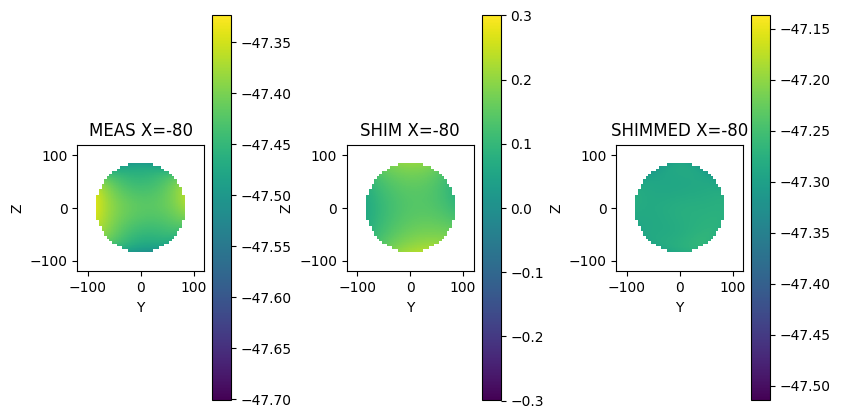

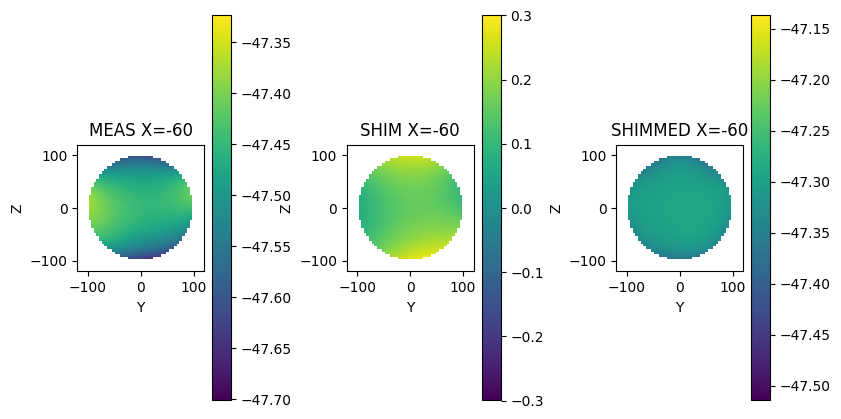

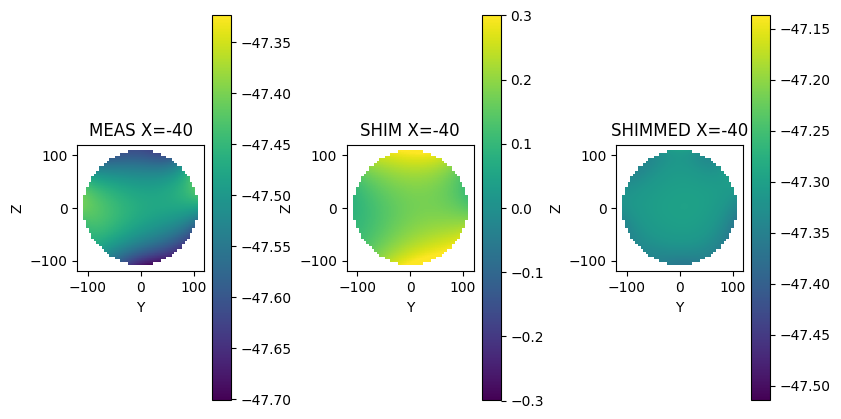

...

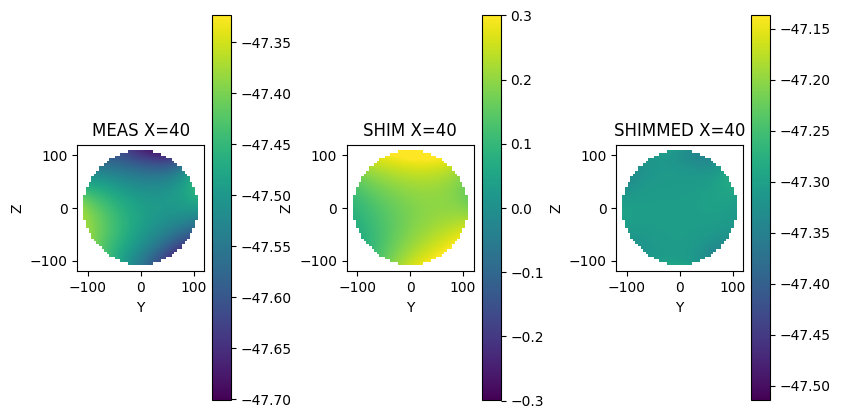

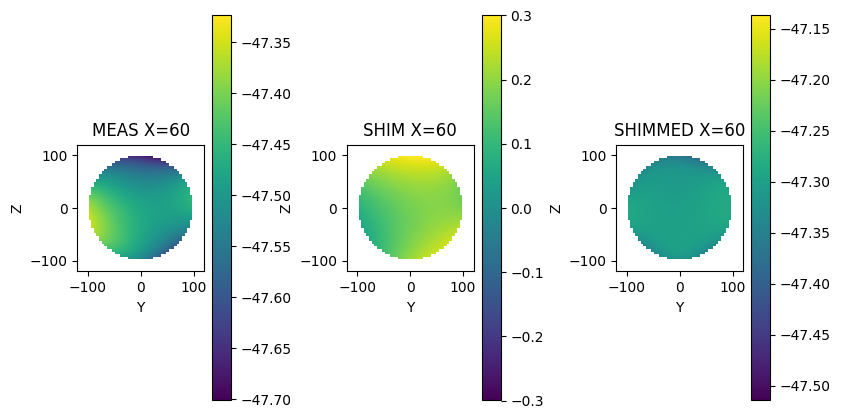

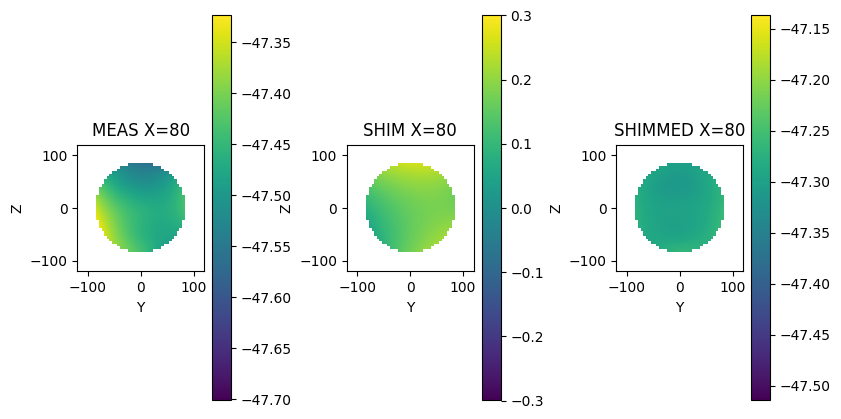

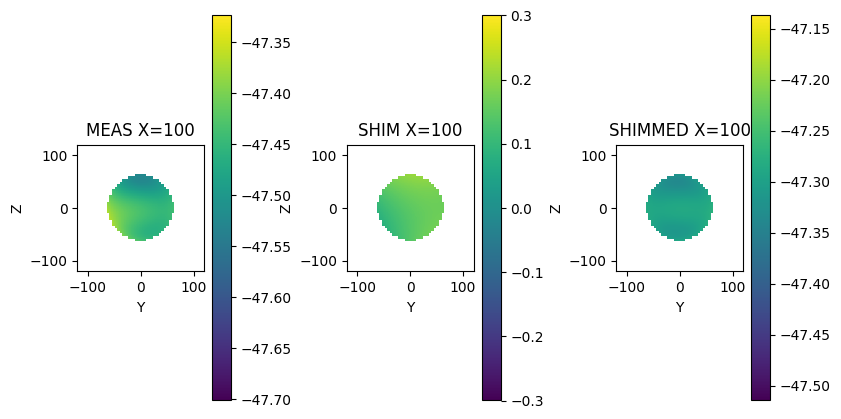

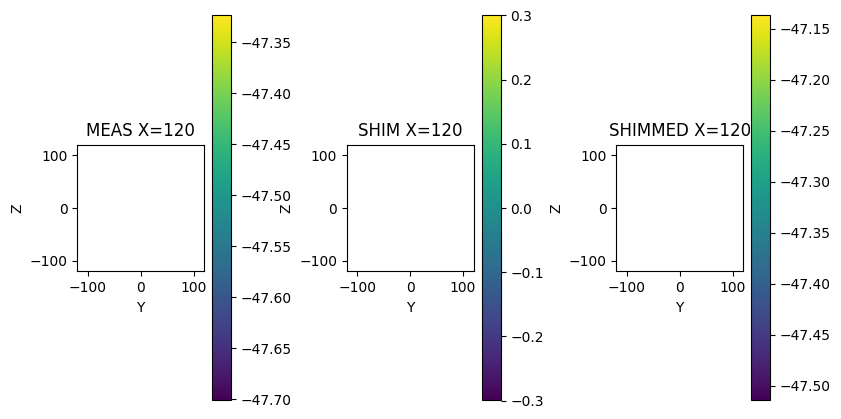

In [340]:
#render the field of rotated magnets
#optimized_vector_of_magnet_rotations = np.zeros(len(shimming_magnets))+np.pi/2#+np.pi/4*8.05#np.random.randint(40)*2*np.pi/40
optimized_vector_of_magnet_rotations = np.load('optIter2_4rings.npy')


def yz_to_insert_number(y:float,z:float):
        # we have a ring. 2 pi radians. 
        # each point is defined by the angle from OY towards OZ

        angle = np.arctan2(z,y)
        # there are 12 inserts
        angle_per_segment = 2*np.pi/12
        insert_nr = round(angle/angle_per_segment) + 6
        #print(y*1e3,z*1e3,angle*180/np.pi,' deg',insert_nr,'th insert normal')
        
        return (insert_nr)
        
        

def insert_number_from_position(pos: tuple):
        for idx,ring_position in enumerate(ringPositions):
                if pos[0] == ring_position:
                        ring_number = idx
        
        insert_number = yz_to_insert_number(pos[1],pos[2])
        
        return('RING %.0f INSERT %.0f'%(ring_number,insert_number))
        


for i in range(len(optimized_vector_of_magnet_rotations)):
        pos = positions[i]
        if pos[1] > 180e-3:
                if pos[2] < -50e-3 and pos[2] > -200e-3:
                        #angle_to_assign = np.pi/2
                        print(insert_number_from_position(pos),'soll: %.0f'%(optimized_vector_of_magnet_rotations[i]*180/np.pi),' ist(?): %.0f'%(angle_to_assign*180/np.pi))
                        #optimized_vector_of_magnet_rotations[i] = angle_to_assign


shimField_Rotated = np.matmul(magnetFields[...,1,:], -np.sin(optimized_vector_of_magnet_rotations)) + np.matmul(magnetFields[...,2,:], np.cos(optimized_vector_of_magnet_rotations))
shimField_Rotated*=b0map_iter1.sphere_mask

FieldShimmed = FieldMeasured_init+shimField_Rotated


shimoffset = np.nanmean(FieldShimmed)-np.nanmean(FieldMeasured_init)



for slicenr in range(0,len(xvals_raw),int(len(xvals_raw)/10)):
#slicenr = 17
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(9,5))

    xxx = axes[0].imshow(np.transpose(FieldMeasured_init[slicenr,:,:]),origin='lower',vmin=np.nanmin(FieldMeasured_init[:,:,:]),vmax = np.nanmax(FieldMeasured_init[:,:,:]),extent=[-120,120,-120,120])
    plt.colorbar(mappable=xxx)
    axes[0].set_title('MEAS X=%.0f'%xvals_raw[slicenr])
    axes[0].set_xlabel('Y')
    axes[0].set_ylabel('Z')
    


    xxx = axes[1].imshow(np.transpose(shimField_Rotated[slicenr,:,:]),vmin=-3e-1,vmax=3e-1,origin='lower',extent=[-120,120,-120,120])
    plt.colorbar(mappable=xxx)
    axes[1].set_title('SHIM X=%.0f'%xvals_raw[slicenr])
    axes[1].set_xlabel('Y')
    axes[1].set_ylabel('Z')
    
    


    xxx = axes[2].imshow(np.transpose(FieldShimmed[slicenr,:,:]),origin='lower',
            vmin=np.nanmin(FieldMeasured_init[:,:,:]+shimoffset),
            vmax = np.nanmax(FieldMeasured_init[:,:,:]+shimoffset),
            extent=[-120,120,-120,120])
    plt.colorbar(mappable = xxx)
    axes[2].set_xlabel('Y')
    axes[2].set_ylabel('Z')
    
    axes[2].set_title('SHIMMED X=%.0f'%xvals_raw[slicenr])
    axes[2].set_xlabel('Y')
    axes[2].set_ylabel('Z')
    
    plt.subplots_adjust(wspace=0.7)
    plt.show()



# run the lsq optimization of the rotation vector

In [343]:
# now do the least squares optimization
vector_of_magnet_rotations =np.load('optIter2_4rings.npy')#
#vector_of_magnet_rotations = np.zeros(len(shimming_magnets))#+0*np.pi/2#vector_of_magnet_rotations*0 ##
cost = _dataFitting(vector_of_magnet_rotations)

print(np.sum(cost))

# least squares optimization of the rotation vector
from scipy.optimize import least_squares

initialGuess = vector_of_magnet_rotations
#initialGuess[initialGuess<0.001] = 0.001
lsqData = least_squares(_dataFitting, initialGuess, max_nfev=6400, xtol = 1e-5,ftol=0, verbose=2,bounds=(initialGuess*0,initialGuess*0+2*np.pi))


795389.4400842381
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         4.1669e+08                                    3.06e+04    
       1              4         4.1669e+08      2.50e+03       4.65e-02       2.25e+05    
       2              7         4.1669e+08      5.40e+02       7.17e-03       1.14e+05    
       3              8         4.1669e+08      3.38e+02       6.24e-03       3.51e+04    
       4              9         4.1669e+08      3.45e+02       9.17e-03       5.59e+04    
       5             10         4.1669e+08      1.19e+02       8.26e-03       2.77e+05    
       6             11         4.1669e+08      2.33e+02       3.36e-03       3.49e+04    
       7             12         4.1669e+08      9.50e+01       2.28e-03       3.54e+04    
       8             13         4.1669e+08      9.87e+01       1.61e-03       3.44e+04    
       9             14         4.1669e+08      1.92e+02       2.67e-03 

# save the optimized vector
## render the shimmed field
## and calculate the homogeneity

In [344]:
optimized_vector_of_magnet_rotations = lsqData.x
np.save('optIter2_4rings.npy',optimized_vector_of_magnet_rotations)


shimField_Rendered = shimming_magnets[0].B0[:,:,:,2]*0 # container for the shimmed field

# render the shim field by given rotations of each shimming magnet
for idx, magnet in enumerate(shimming_magnets):
    alpha = optimized_vector_of_magnet_rotations[idx]

    magnet.rotation_yz = -alpha # beware of the sign
    magnet.bRem = bRem*1
    magnet.render_field(grid=coordinate_grid)
    shimField_Rendered += magnet.B0[:,:,:,2]

shimField_Rendered *= 1.0e3

shimmed_Field_simulated_RENDERED = FieldMeasured_init+shimField_Rendered # shimmed field computed with rendering fields of each magnet
shimField_Rotated = np.matmul(magnetFields[...,1,:], -np.sin(lsqData.x)) + \
    np.matmul(magnetFields[...,2,:], np.cos(lsqData.x)) # shimmed field computed with rotating the pre-rendered fields

shimmed_Field_simulated_ROTATED = FieldMeasured_init+shimField_Rotated

homoinit = (np.nanmax(FieldMeasured_init)-np.nanmin(FieldMeasured_init))/np.nanmean(FieldMeasured_init)*1e6
homo_cheap = (np.nanmax(shimmed_Field_simulated_ROTATED)-np.nanmin(shimmed_Field_simulated_ROTATED))/np.nanmean(shimmed_Field_simulated_ROTATED)*1e6
print('homo cheap ppm %.0f -> %.0f'%(abs(homoinit),abs(homo_cheap)))
print('mean mT %.2f -> %.2f'%(abs(np.nanmean(FieldMeasured_init)),abs(np.nanmean(shimmed_Field_simulated_ROTATED))))


homoinit = (np.nanmax(FieldMeasured_init)-np.nanmin(FieldMeasured_init))/np.nanmean(FieldMeasured_init)*1e6
homo_fair = (np.nanmax(shimmed_Field_simulated_RENDERED)-np.nanmin(shimmed_Field_simulated_RENDERED))/np.nanmean(shimmed_Field_simulated_RENDERED)*1e6
print('homo fair ppm %.0f -> %.0f'%(abs(homoinit),abs(homo_fair)))
print('mean mT %.2f -> %.2f'%(abs(np.nanmean(FieldMeasured_init)),abs(np.nanmean(shimmed_Field_simulated_RENDERED))))

shimoffset = np.nanmean(shimmed_Field_simulated_ROTATED) - np.nanmean(FieldMeasured_init)
#d = np.shape(coordinate_grid[0])
#print(d[0])


ROTATION OF EXPENSIVE MAGNET:-35
[ 0.00000000e+00  1.89922471e-08 -1.33325490e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-40
[ 0.00000000e+00  1.76782936e-08 -1.50313089e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-47
[ 0.00000000e+00  1.58829056e-08 -1.69173172e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-54
[ 0.00000000e+00  1.36147911e-08 -1.87909493e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-62
[ 0.00000000e+00  1.08983474e-08 -2.04862963e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-70
[ 0.00000000e+00  7.77681242e-09 -2.18628338e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-79
[ 0.00000000e+00  4.31937429e-09 -2.27992394e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-111
[ 0.00000000e+00 -8.38298908e-09 -2.16376479e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-121
[ 0.00000000e+00 -1.20023879e-08 -1.98596323e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-131
[ 0.00000000e+00 -1.52930558e-08 -1.74523567e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-141
[ 0.00000000e+00 -1.81272939e-08 -1.44866672e-08]
1.35
ROTATION OF EXPENSIVE MAGNET

In [345]:
print(np.nanmax(shimField_Rendered)) # with adjustable bRem, same rotations
print(np.nanmax(shimField_Rotated))

0.54750067
0.5475008778926964


In [346]:

xmid = int(len(x)/2)
ymid = int(len(y)/2)
zmid = int(len(z)/2)
print(xmid,ymid,zmid)


fieldincenter_init = FieldMeasured_init[xmid-1,ymid,zmid]
fieldincenter_shimmed = shimmed_Field_simulated_RENDERED[xmid-1,ymid,zmid]

print("field in center before: %.2f"%fieldincenter_init)
print("field in center after: %.2f"%fieldincenter_shimmed)

24 24 24
field in center before: -47.49
field in center after: -47.31


In [347]:
print('from')
print('min',np.nanmax(FieldMeasured_init))
print('max',np.nanmin(FieldMeasured_init))
print('<',np.nanmean(FieldMeasured_init),'>')


print('to')
print('min',np.nanmax(shimmed_Field_simulated_RENDERED))
print('max',np.nanmin(shimmed_Field_simulated_RENDERED))
print('<',np.nanmean(shimmed_Field_simulated_RENDERED),'>')



from
min -47.323636981064546
max -47.70135306722949
< -47.492557959187714 >
to
min -47.2230898834412
max -47.38965647951505
< -47.30855040488277 >


# plot the shim field

<Figure size 640x480 with 0 Axes>

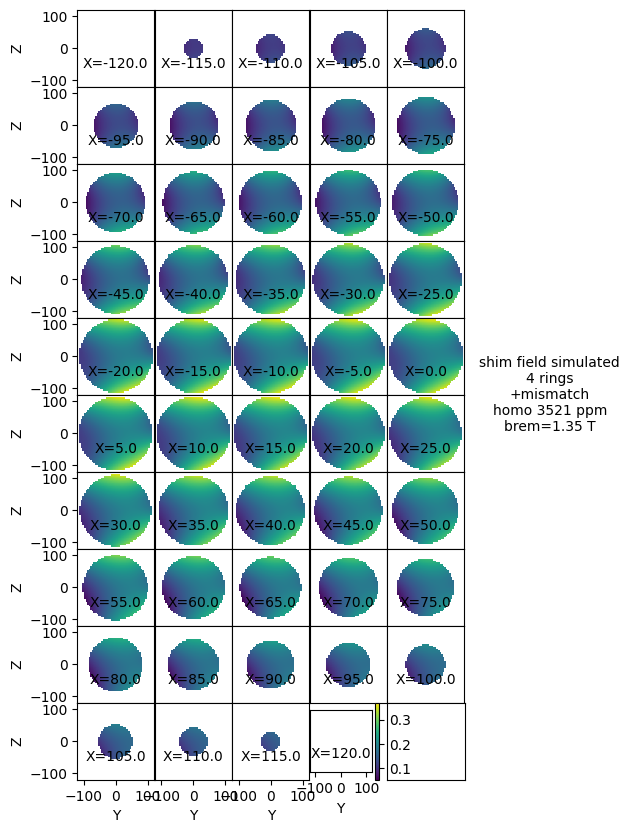

In [348]:
# SHIM FIELD
plt.figure(0)

fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(5, 10))

xvals_raw = b0map_iter1.xDim_SPH_fine

simulated_shim_Field_masked = shimField_Rendered*b0map_iter1.sphere_mask


for i in range(10):
    for j in range(5):
        if i*5+j >=len(xvals_raw):
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(2.1, 5, 'shim field simulated\n4 rings\n+mismatch\nhomo %.0f ppm\nbrem=%.2f T'%(abs(homo_fair),shimming_magnets[0].bRem), horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break
        xxx = axes[i,j].imshow(np.transpose(simulated_shim_Field_masked[i*5+j,:,:]),clim=[np.nanmin(simulated_shim_Field_masked),np.nanmax(simulated_shim_Field_masked)],origin = 'lower',extent=[-120,120,-120,120])
        #xxx = axes[i,j].contourf(y,z,np.transpose(optimized_shim_Field_masked[i*5+j,:,:]),vmin=np.nanmin(optimized_shim_Field_masked),vmax=np.nanmax(optimized_shim_Field_masked),levels=16)
        
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%xvals_raw[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==9:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        axes[i,j].set_aspect(1)
        
        #plt.xlabel('Z')
        #plt.ylabel('Y')
        
plt.subplots_adjust(wspace=-0.0, hspace=0)
plt.savefig('./pics/shim_field_ITER2_1RING.png',format="png")
plt.savefig('./pics/shim_field_ITER2_1RING.pdf',format="pdf")
plt.show()






# **shimmed field simulated**

shimmed simulated HOMO,ppm: 3520.8560534684625


<Figure size 640x480 with 0 Axes>

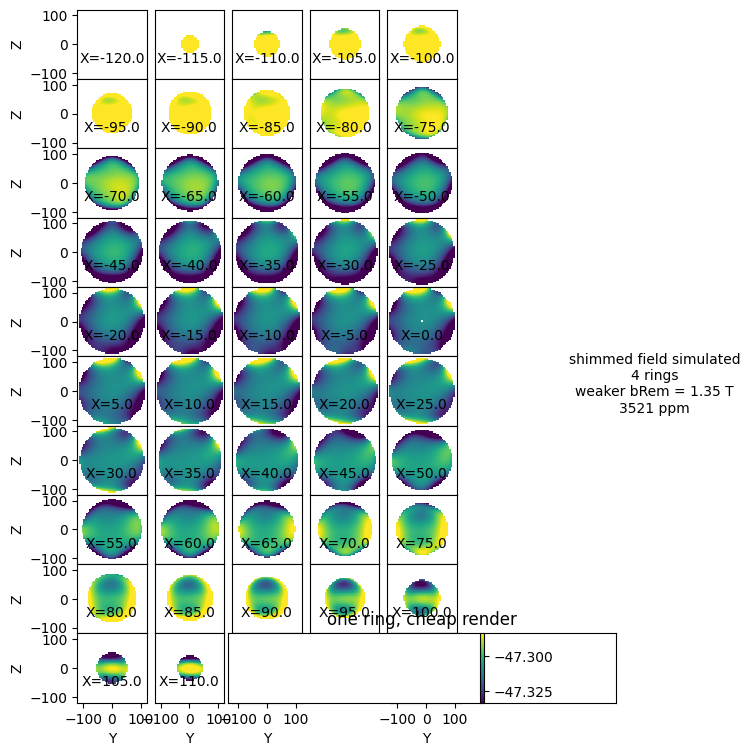

In [349]:

# SHIMMED field
plt.figure(0)

fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(9, 9))

SIMULATED_SHIMMED_FIELD_TO_PLOT = shimmed_Field_simulated_RENDERED

shimoffset = np.nanmean(SIMULATED_SHIMMED_FIELD_TO_PLOT) - np.nanmean(FieldMeasured_init)

homoshimmed = abs((np.nanmax(SIMULATED_SHIMMED_FIELD_TO_PLOT)-np.nanmin(SIMULATED_SHIMMED_FIELD_TO_PLOT))/np.nanmean(SIMULATED_SHIMMED_FIELD_TO_PLOT)*1e6)
#homoshimmed = abs((np.nanmax(shimmed_Field_simulated_flipped_Y)-np.nanmin(shimmed_Field_simulated_flipped_Y))/np.nanmean(shimmed_Field_simulated_flipped_Y)*1e6)

print('shimmed simulated HOMO,ppm:',homoshimmed)

xvals_raw = b0map_iter1.xDim_SPH_fine

for i in range(10):
    for j in range(5):
        if i*5+j >=len(xvals_raw):
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(1.1, 4.6, 'shimmed field simulated\n4 rings\nweaker bRem = %.2f T\n%.0f ppm'%(shimming_magnets[0].bRem,homoshimmed) , horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break

        #xxx = axes[i,j].contourf(shimmed_Field_final[i*5+j,:,:],vmin=np.nanmin(shimmed_Field_final),vmax=np.nanmax(shimmed_Field_final),origin = 'lower',extent=[-120,120,-120,120])
    
        xxx = axes[i,j].imshow(np.transpose(SIMULATED_SHIMMED_FIELD_TO_PLOT[i*5+j,:,:]),vmin=np.nanmean(SIMULATED_SHIMMED_FIELD_TO_PLOT)-0.025,vmax=np.nanmean(SIMULATED_SHIMMED_FIELD_TO_PLOT)+0.025,origin = 'lower',extent=[-120,120,-120,120])
        #xxx = axes[i,j].imshow(np.transpose(shimmed_Field_simulated_flipped_Y[i*5+j,:,:]),vmin=np.nanmin(shimmed_Field_simulated),vmax=np.nanmax(shimmed_Field_simulated),origin = 'lower',extent=[-120,120,-120,120])
        
        
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%xvals_raw[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==9:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        axes[i,j].set_aspect(1)
        plt.xlabel('Y')
        plt.ylabel('Z')

        
plt.title('one ring, cheap render')        
plt.subplots_adjust(wspace=-0.8, hspace=0.0)
plt.savefig('./pics/shimmed_field_ITER2_1ring.png',format="png")
plt.savefig('./pics/shimmed_field_ITER2_1ring.pdf',format="pdf")
plt.show()






# **Magnet rotations in rings**

nr 0 Y 0.27211479674710887 Z -0.04614691096140277 a 35.06883786987296
nr 1 Y 0.2742709847847707 Z -0.030845208788272026 a 40.373490423034475
nr 2 Y 0.27556740718070843 Z -0.015446815196073495 a 46.80632239534742
nr 3 Y 0.276 Z 0.0 a 54.07517398132349
nr 4 Y 0.27556740718070843 Z 0.0154468151960735 a 61.98781229485668
nr 5 Y 0.2742709847847707 Z 0.030845208788272037 a 70.4190562974491
nr 6 Y 0.27211479674710887 Z 0.04614691096140277 a 79.27230903785524
nr 7 Y 0.2587317822093368 Z 0.09609300117480107 a 111.17766699777361
nr 8 Y 0.2529482447387227 Z 0.11042275799670676 a 121.14713013713774
nr 9 Y 0.2463717826715406 Z 0.12440636922299107 a 131.22725864713559
nr 10 Y 0.2390230114445051 Z 0.13799999999999998 a 141.36943659443682
nr 11 Y 0.2309249674754671 Z 0.15116103795771738 a 151.5211499406779
nr 12 Y 0.22210303595045067 Z 0.16384822678806393 a 161.65108064018568
nr 13 Y 0.21258487124793404 Z 0.17602179557230782 a 171.73139352363918
nr 14 Y 0.17602179557230782 Z 0.21258487124793404 a 205.

Text(0, 0.5, 'Z')

<Figure size 640x480 with 0 Axes>

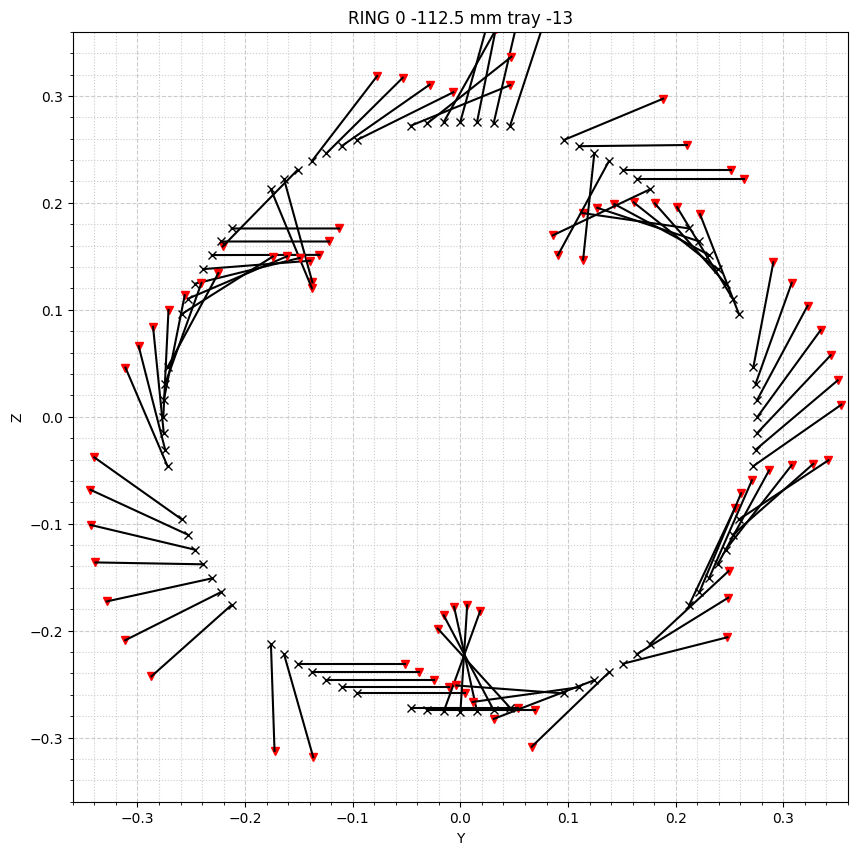

In [350]:
# MAGNET ROTATIONS RING 0
#plotting rotations
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

ring_number = 0
ringPosition = ringPositions[ring_number]
plt.figure(0)

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))

plt.title('RING %d %.1f mm tray %d'%(ring_number,1e3*ringPosition,trays_occupied[ring_number]))
dispveclen = 10e-2 # length of displayed rotation vector 

for idx,tmppos in enumerate(positions):
    if tmppos[0] == ringPosition:
        angle = optimized_vector_of_magnet_rotations[idx]
        YPOINT = tmppos[1] # !!! 240917
        ZPOINT = tmppos[2] # !!! 240917
        print('nr',idx,'Y',YPOINT,'Z',ZPOINT,'a',angle*180/np.pi)
        axes.plot(YPOINT,ZPOINT,'xk')
        direction = [dispveclen*np.cos(angle),dispveclen*np.sin(angle)] #!!!!!!!!! 240916
        axes.plot(YPOINT+direction[0],ZPOINT+direction[1],'rv')
        axes.plot([YPOINT,YPOINT+direction[0]],[ZPOINT,ZPOINT+direction[1]],'k-')
        
axes.set_xlim([-360e-3,360e-3])
axes.set_ylim([-360e-3,360e-3])
axes.xaxis.set_major_locator(MultipleLocator(0.1))
axes.yaxis.set_major_locator(MultipleLocator(0.1)) 
axes.xaxis.set_minor_locator(AutoMinorLocator(5))
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
        
plt.grid(which='major', color='#CCCCCC', linestyle='--')
plt.grid(which='minor', color='#CCCCCC', linestyle=':')
plt.xlabel('Y')
plt.ylabel('Z')



nr 84 Y 0.27211479674710887 Z -0.04614691096140277 a 277.51753346340746
nr 85 Y 0.2742709847847707 Z -0.030845208788272026 a 7.083481632619169e-38
nr 86 Y 0.27556740718070843 Z -0.015446815196073495 a 4.823953396464088e-34
nr 87 Y 0.276 Z 0.0 a 4.17227780229427e-32
nr 88 Y 0.27556740718070843 Z 0.0154468151960735 a 9.980195644276538e-28
nr 89 Y 0.2742709847847707 Z 0.030845208788272037 a 3.632181525885354e-23
nr 90 Y 0.27211479674710887 Z 0.04614691096140277 a 1.0023661812696422e-18
nr 91 Y 0.2587317822093368 Z 0.09609300117480107 a 358.49707169378047
nr 92 Y 0.2529482447387227 Z 0.11042275799670676 a 359.0397398277542
nr 93 Y 0.2463717826715406 Z 0.12440636922299107 a 289.45893963580124
nr 94 Y 0.2390230114445051 Z 0.13799999999999998 a 237.9244024775913
nr 95 Y 0.2309249674754671 Z 0.15116103795771738 a 242.9608905809931
nr 96 Y 0.22210303595045067 Z 0.16384822678806393 a 1.8039593996450244e-15
nr 97 Y 0.21258487124793404 Z 0.17602179557230782 a 4.794359692024348e-17
nr 98 Y 0.176021

Text(0, 0.5, 'Z')

<Figure size 640x480 with 0 Axes>

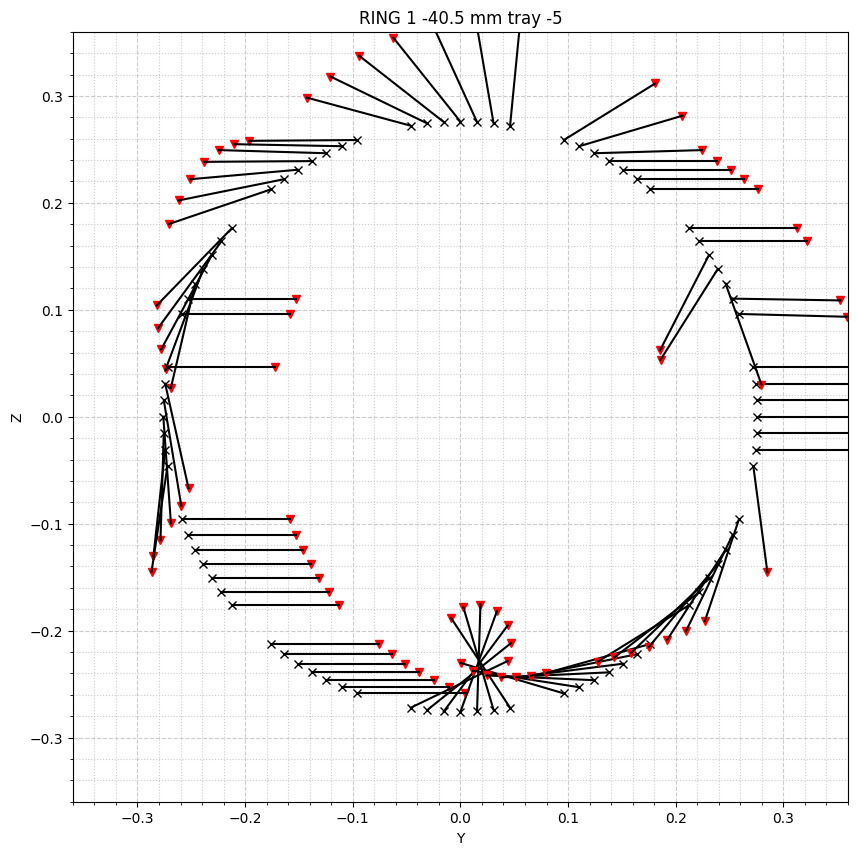

In [351]:
# MAGNET ROTATIONS RING 1
#plotting rotations
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

ring_number = 1
ringPosition = ringPositions[ring_number]
plt.figure(0)

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))

plt.title('RING %d %.1f mm tray %d'%(ring_number,1e3*ringPosition,trays_occupied[ring_number]))
dispveclen = 10e-2 # length of displayed rotation vector 

for idx,tmppos in enumerate(positions):
    if tmppos[0] == ringPosition:
        angle = optimized_vector_of_magnet_rotations[idx]
        YPOINT = tmppos[1] # !!! 240917
        ZPOINT = tmppos[2] # !!! 240917
        print('nr',idx,'Y',YPOINT,'Z',ZPOINT,'a',angle*180/np.pi)
        axes.plot(YPOINT,ZPOINT,'xk')
        direction = [dispveclen*np.cos(angle),dispveclen*np.sin(angle)] #!!!!!!!!! 240916
        axes.plot(YPOINT+direction[0],ZPOINT+direction[1],'rv')
        axes.plot([YPOINT,YPOINT+direction[0]],[ZPOINT,ZPOINT+direction[1]],'k-')
        
axes.set_xlim([-360e-3,360e-3])
axes.set_ylim([-360e-3,360e-3])

axes.xaxis.set_major_locator(MultipleLocator(0.1))
axes.yaxis.set_major_locator(MultipleLocator(0.1)) 
axes.xaxis.set_minor_locator(AutoMinorLocator(5))
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
        
plt.grid(which='major', color='#CCCCCC', linestyle='--')
plt.grid(which='minor', color='#CCCCCC', linestyle=':')
plt.grid(1)
plt.xlabel('Y')
plt.ylabel('Z')



nr 168 Y 0.27211479674710887 Z -0.04614691096140277 a 2.1882186761159886e-40
nr 169 Y 0.2742709847847707 Z -0.030845208788272026 a 1.7011688355786115e-36
nr 170 Y 0.27556740718070843 Z -0.015446815196073495 a 4.79822049612933e-36
nr 171 Y 0.276 Z 0.0 a 2.573849664153531e-36
nr 172 Y 0.27556740718070843 Z 0.0154468151960735 a 3.543419690924251e-31
nr 173 Y 0.2742709847847707 Z 0.030845208788272037 a 1.0553448523642334e-26
nr 174 Y 0.27211479674710887 Z 0.04614691096140277 a 320.6342284365819
nr 175 Y 0.2587317822093368 Z 0.09609300117480107 a 329.47542873194516
nr 176 Y 0.2529482447387227 Z 0.11042275799670676 a 2.2102341516544268e-13
nr 177 Y 0.2463717826715406 Z 0.12440636922299107 a 288.97817209666135
nr 178 Y 0.2390230114445051 Z 0.13799999999999998 a 272.69647984070036
nr 179 Y 0.2309249674754671 Z 0.15116103795771738 a 269.9681967821114
nr 180 Y 0.22210303595045067 Z 0.16384822678806393 a 273.98914887455646
nr 181 Y 0.21258487124793404 Z 0.17602179557230782 a 1.972688607122598e-21

Text(0, 0.5, 'Z')

<Figure size 640x480 with 0 Axes>

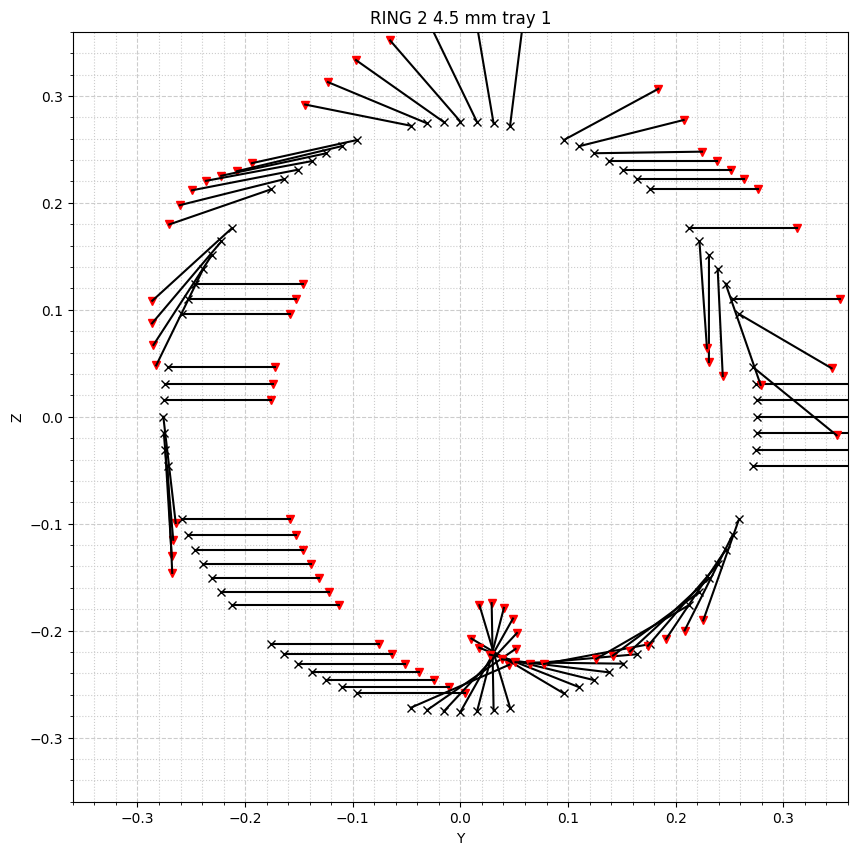

In [352]:
# MAGNET ROTATIONS RING 2
#plotting rotations
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

ring_number = 2
ringPosition = ringPositions[ring_number]
plt.figure(0)

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))

plt.title('RING %d %.1f mm tray %d'%(ring_number,1e3*ringPosition,trays_occupied[ring_number]))
dispveclen = 10e-2 # length of displayed rotation vector 

for idx,tmppos in enumerate(positions):
    if tmppos[0] == ringPosition:
        angle = optimized_vector_of_magnet_rotations[idx]
        YPOINT = tmppos[1] # !!! 240917
        ZPOINT = tmppos[2] # !!! 240917
        print('nr',idx,'Y',YPOINT,'Z',ZPOINT,'a',angle*180/np.pi)
        axes.plot(YPOINT,ZPOINT,'xk')
        direction = [dispveclen*np.cos(angle),dispveclen*np.sin(angle)] #!!!!!!!!! 240916
        axes.plot(YPOINT+direction[0],ZPOINT+direction[1],'rv')
        axes.plot([YPOINT,YPOINT+direction[0]],[ZPOINT,ZPOINT+direction[1]],'k-')
        
axes.set_xlim([-360e-3,360e-3])
axes.set_ylim([-360e-3,360e-3])

        
axes.xaxis.set_major_locator(MultipleLocator(0.1))
axes.yaxis.set_major_locator(MultipleLocator(0.1)) 
axes.xaxis.set_minor_locator(AutoMinorLocator(5))
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
        
plt.grid(which='major', color='#CCCCCC', linestyle='--')
plt.grid(which='minor', color='#CCCCCC', linestyle=':')
plt.grid(1)
plt.xlabel('Y')
plt.ylabel('Z')



nr 252 Y 0.27211479674710887 Z -0.04614691096140277 a 356.32735438946634
nr 253 Y 0.2742709847847707 Z -0.030845208788272026 a 6.4494120950942895
nr 254 Y 0.27556740718070843 Z -0.015446815196073495 a 14.559421873381732
nr 255 Y 0.276 Z 0.0 a 23.072504312301717
nr 256 Y 0.27556740718070843 Z 0.0154468151960735 a 32.708966418575436
nr 257 Y 0.2742709847847707 Z 0.030845208788272037 a 46.316123185878205
nr 258 Y 0.27211479674710887 Z 0.04614691096140277 a 88.38088723656992
nr 259 Y 0.2587317822093368 Z 0.09609300117480107 a 234.53595559525328
nr 260 Y 0.2529482447387227 Z 0.11042275799670676 a 243.6531762617005
nr 261 Y 0.2463717826715406 Z 0.12440636922299107 a 252.2837389658691
nr 262 Y 0.2390230114445051 Z 0.13799999999999998 a 260.76128270714577
nr 263 Y 0.2309249674754671 Z 0.15116103795771738 a 269.23922478414056
nr 264 Y 0.22210303595045067 Z 0.16384822678806393 a 5.248350015561872e-22
nr 265 Y 0.21258487124793404 Z 0.17602179557230782 a 7.181243502338666e-23
nr 266 Y 0.1760217955

Text(0, 0.5, 'Z')

<Figure size 640x480 with 0 Axes>

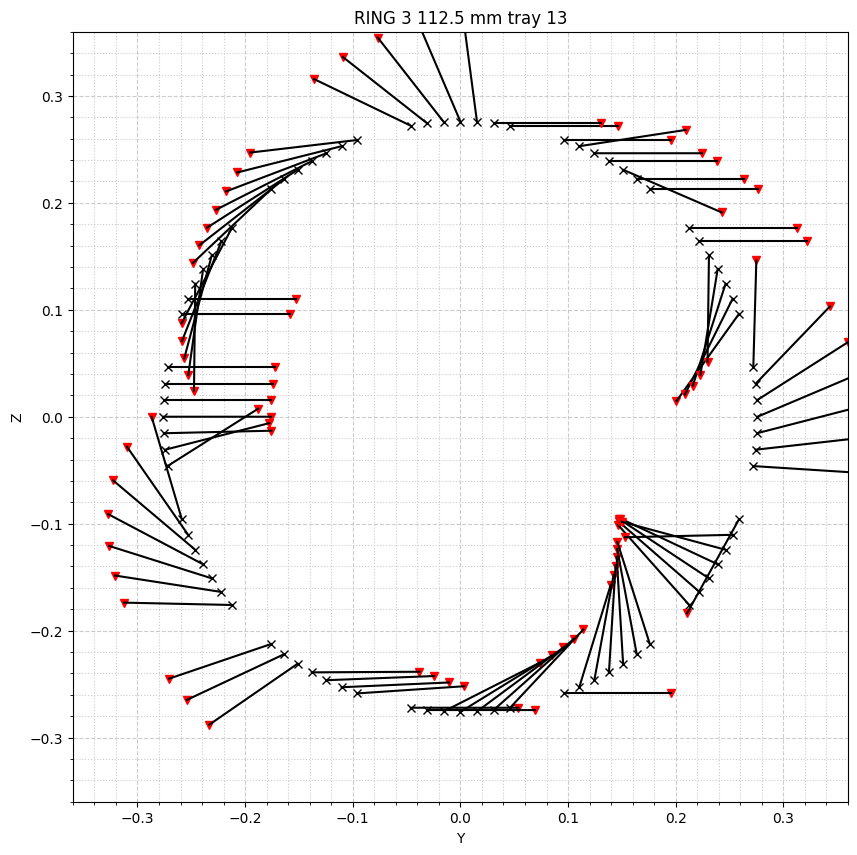

In [353]:
# MAGNET ROTATIONS RING 3
#plotting rotations
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

ring_number = 3
ringPosition = ringPositions[ring_number]
plt.figure(0)

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))

plt.title('RING %d %.1f mm tray %d'%(ring_number,1e3*ringPosition,trays_occupied[ring_number]))
dispveclen = 10e-2 # length of displayed rotation vector 

for idx,tmppos in enumerate(positions):
    if tmppos[0] == ringPosition:
        angle = optimized_vector_of_magnet_rotations[idx]
        YPOINT = tmppos[1] # !!! 240917
        ZPOINT = tmppos[2] # !!! 240917
        print('nr',idx,'Y',YPOINT,'Z',ZPOINT,'a',angle*180/np.pi)
        axes.plot(YPOINT,ZPOINT,'xk')
        direction = [dispveclen*np.cos(angle),dispveclen*np.sin(angle)] #!!!!!!!!! 240916
        axes.plot(YPOINT+direction[0],ZPOINT+direction[1],'rv')
        axes.plot([YPOINT,YPOINT+direction[0]],[ZPOINT,ZPOINT+direction[1]],'k-')
        
axes.set_xlim([-360e-3,360e-3])
axes.set_ylim([-360e-3,360e-3])

axes.xaxis.set_major_locator(MultipleLocator(0.1))
axes.yaxis.set_major_locator(MultipleLocator(0.1)) 
axes.xaxis.set_minor_locator(AutoMinorLocator(5))
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
        
plt.grid(which='major', color='#CCCCCC', linestyle='--')
plt.grid(which='minor', color='#CCCCCC', linestyle=':')
plt.grid(1)
plt.xlabel('Y')
plt.ylabel('Z')



nr 0 Y 0.27211479674710887 Z -0.04614691096140277 a 35.058039437285515
nr 1 Y 0.2742709847847707 Z -0.030845208788272026 a 40.24698973816623
nr 2 Y 0.27556740718070843 Z -0.015446815196073495 a 46.611155278919696
nr 3 Y 0.276 Z 0.0 a 53.83700787307447
nr 4 Y 0.27556740718070843 Z 0.0154468151960735 a 61.71568701708862
nr 5 Y 0.2742709847847707 Z 0.030845208788272037 a 70.12542291606607
nr 6 Y 0.27211479674710887 Z 0.04614691096140277 a 78.954525996287
nr 7 Y 0.2587317822093368 Z 0.09609300117480107 a 110.75940474197903
nr 8 Y 0.2529482447387227 Z 0.11042275799670676 a 120.69525613946456
nr 9 Y 0.2463717826715406 Z 0.12440636922299107 a 130.74268559896726
nr 10 Y 0.2390230114445051 Z 0.13799999999999998 a 140.856583949177
nr 11 Y 0.2309249674754671 Z 0.15116103795771738 a 150.99692894093752
nr 12 Y 0.22210303595045067 Z 0.16384822678806393 a 161.12915445164222
nr 13 Y 0.21258487124793404 Z 0.17602179557230782 a 171.24175775911348
nr 14 Y 0.17602179557230782 Z 0.21258487124793404 a 205.4

Text(0, 0.5, 'Z')

<Figure size 640x480 with 0 Axes>

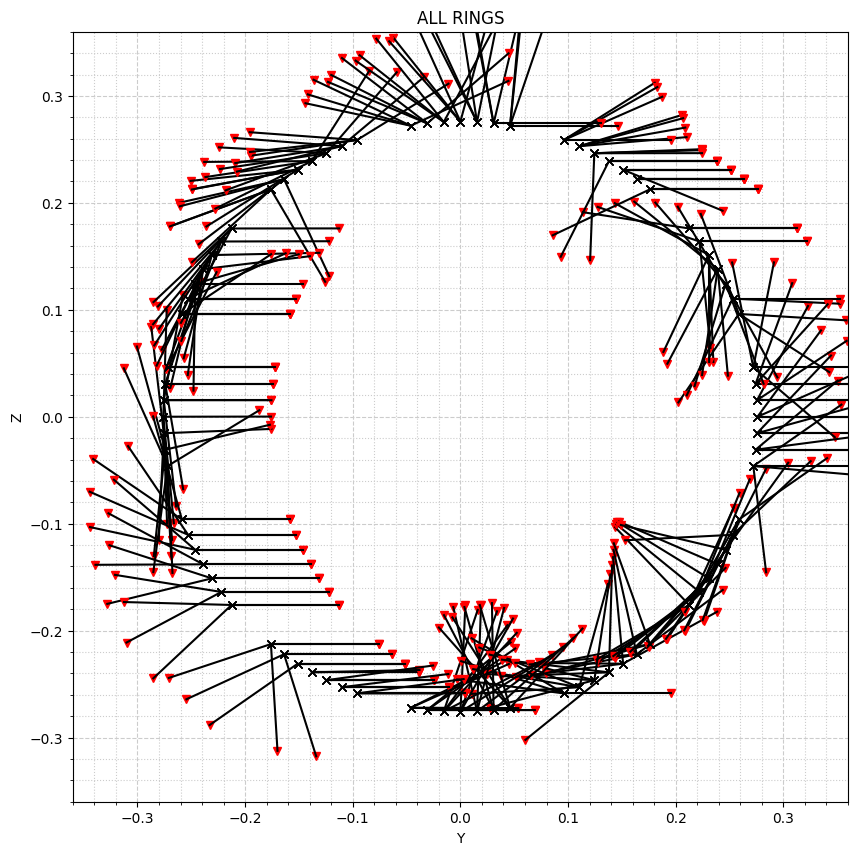

In [335]:
#now all rotattions to compare with the render

plt.figure(0)

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))

plt.title('ALL RINGS')
dispveclen = 10e-2 # length of displayed rotation vector 

for idx,tmppos in enumerate(positions):

    angle = optimized_vector_of_magnet_rotations[idx]
    YPOINT = tmppos[1] # !!! 240917
    ZPOINT = tmppos[2] # !!! 240917
    print('nr',idx,'Y',YPOINT,'Z',ZPOINT,'a',angle*180/np.pi)
    axes.plot(YPOINT,ZPOINT,'xk')
    direction = [dispveclen*np.cos(angle),dispveclen*np.sin(angle)] #!!!!!!!!! 240916
    axes.plot(YPOINT+direction[0],ZPOINT+direction[1],'rv')
    axes.plot([YPOINT,YPOINT+direction[0]],[ZPOINT,ZPOINT+direction[1]],'k-')
        
axes.set_xlim([-360e-3,360e-3])
axes.set_ylim([-360e-3,360e-3])

axes.xaxis.set_major_locator(MultipleLocator(0.1))
axes.yaxis.set_major_locator(MultipleLocator(0.1)) 
axes.xaxis.set_minor_locator(AutoMinorLocator(5))
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
        
plt.grid(which='major', color='#CCCCCC', linestyle='--')
plt.grid(which='minor', color='#CCCCCC', linestyle=':')
plt.grid(1)
plt.xlabel('Y')
plt.ylabel('Z')



# Comparing with **reality**

In [859]:
# the full map with four rings
# --- REALITY IS: --- 
# ball map of the shimmed field


import numpy as np  
import b0
b0map_iter2_A = b0.b0() # as simulated
b0map_iter2_B = b0.b0() # slightly underturned 5 and 6, current state by 240926 10:10 AM
b0map_iter2_SHELL = b0.b0() # slightly underturned 5 and 6, current state by 240926 10:10 AM
b0map_iter2_BALL_MISMATCHED = b0.b0() # recalculated rotations with mismatch, current state by 240927 09:44 AM


filename_to_import_csv_data_from_A = r'./data/240907/240919_ball_4rings_R120_12pts_bvals_shifted.csv' # inserts 5 and 6 as simulated
filename_to_import_csv_data_from_B = r'./data/240925/240925_ball_R120_FOUR_RINGS_ITER2_bvals_shifted.csv' # inserts 5 and 6 /slightly/ underturned
filename_to_import_csv_data_from_SHELL = r'./data/240925/240925_sphere_R120_FOUR_RINGS_ITER2_with_mismatch_bvals.csv'
filename_to_import_csv_data_from_BALL_MISMATCHED = r'./data/240925/240925_fine_ball_R120_FOUR_RINGS_ITER2_with_mismatch_bvals_shifted.csv'
#filename_to_import_csv_data_from = r'./data/V1_magnet/2024-09-25-10-55_4_rings_iteration_2/240925_ball_overnight_R120_12pts_bvals_shifted.csv' # inserts 5 an 6 turned to optimize the 7 point homogeneity

# import map from csv file
b0map_iter2_A.import_from_csv(filename_to_import_csv_data_from_A,eulers=[90,0,-90])
# transfer to magnet coordinates
b0map_iter2_A.transfer_coordinates_of_the_path_from_cosi_to_magnet(filtering = 1.01,stepsize=None,onesign=True,component=2)

# import map from csv file
b0map_iter2_B.import_from_csv(filename_to_import_csv_data_from_B,eulers=[90,0,-90])
# transfer to magnet coordinates
b0map_iter2_B.transfer_coordinates_of_the_path_from_cosi_to_magnet(filtering = 1.01,stepsize=None,onesign=True,component=2)

# import map from csv file
b0map_iter2_SHELL.import_from_csv(filename_to_import_csv_data_from_SHELL,eulers=[90,0,-90])
# transfer to magnet coordinates
b0map_iter2_SHELL.transfer_coordinates_of_the_path_from_cosi_to_magnet(filtering = 1.01,stepsize=10,onesign=True,component=2)

# import map from csv file
b0map_iter2_BALL_MISMATCHED.import_from_csv(filename_to_import_csv_data_from_BALL_MISMATCHED,eulers=[90,0,-90])
# transfer to magnet coordinates
b0map_iter2_BALL_MISMATCHED.transfer_coordinates_of_the_path_from_cosi_to_magnet(filtering = 1.01,stepsize=None,onesign=True,component=2)

No path object given on construction of b0 object.
 b0 instance initialized without path.
No path object given on construction of b0 object.
 b0 instance initialized without path.
No path object given on construction of b0 object.
 b0 instance initialized without path.
No path object given on construction of b0 object.
 b0 instance initialized without path.
importing b0 object from csv file./data/240907/240919_ball_4rings_R120_12pts_bvals_shifted.csv
No path object given on construction of b0 object.
 b0 instance initialized without path.
warning. path file  /home/cosi/cosi-measure/Software/COSI2/data/240907/240919_ball_4rings_R120_12pts,,,,,,
 not used. path data taken from csv!
OOPS, |Bo|=0
OOPS, |Bo|=0
importing path from a csv file
ROTATING THE PATH NOW!
path center set to:  [-0.12886959  0.25       -1.55680908]
ROTATING THE MAGNET NOW!
len(path.r)= 7139
len(b0Data)= 7139
-120.12886958957841  < x <  119.87113041042156
-119.7331909230985  < y <  110.26680907690155
-111.6856786664798

mean, mT:  -47.51996790919282
low, mT: -47.644 
high, mT: -47.429
raw homo after Iteration 2: 4524 ppm


<Figure size 640x480 with 0 Axes>

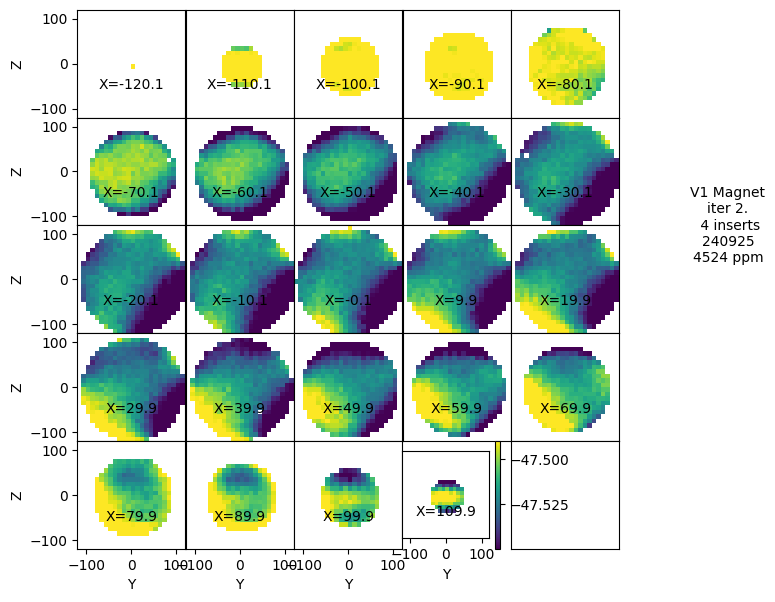

In [862]:
# shimmed field (RAW, ball, without mismatch)
# save shimmed field as 2d plots
from matplotlib import pyplot as plt
plt.figure(0)


xvals_raw = b0map_iter2_A.xPts
y = b0map_iter2_A.yPts
z = b0map_iter2_A.zPts

FieldMeasured_init = b0map_iter2_B.b0Data[:,:,:,2]# - b0map_iter2_A.b0Data[:,:,:,2]
#FieldMeasured[FieldMeasured==np.nanmin(FieldMeasured)] = np.nan


fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(7,7))

#xvals = b0map_comsol.xDim_SPH_fine


print('mean, mT: ',np.nanmean(FieldMeasured_init))
print('low, mT:',np.nanmin(FieldMeasured_init),'\nhigh, mT:',np.nanmax(FieldMeasured_init))

homoshimmed= (np.nanmax(FieldMeasured_init)-np.nanmin(FieldMeasured_init))/np.nanmean(FieldMeasured_init)*1e6

      
for i in range(5):
    for j in range(5):
        if i*5+j >=24:
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(2, 3, 'V1 Magnet\niter 2.\n 4 inserts\n240925\n%.0f ppm'%abs(homoshimmed), horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break
        xxx = axes[i,j].imshow(np.transpose(FieldMeasured_init[i*5+j,:,:]),clim=[np.nanmean(FieldMeasured_init)-0.03,np.nanmean(FieldMeasured_init)+0.03],origin = 'lower',extent=[-120,120,-120,120],cmap='viridis')
        #xxx = axes[i,j].contourf(z,y,FieldMeasured_shimmed[i*5+j,:,:],vmin=np.nanmin(FieldMeasured_shimmed),vmax=np.nanmax(FieldMeasured_shimmed))
        
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%xvals_raw[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==4:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        axes[i,j].set_aspect(1)
        
        plt.xlabel('Y')
        plt.ylabel('Z')
plt.subplots_adjust(hspace=0)
plt.subplots_adjust(wspace=0)



homo_after_iteration_2 = (np.nanmax(abs(FieldMeasured_init))-np.nanmin(abs(FieldMeasured_init)))/np.nanmean(abs(FieldMeasured_init))*1e6
print('raw homo after Iteration 2: %.0f ppm'%homo_after_iteration_2)

plt.show()


mean, mT:  -47.49069015268245
low, mT: -47.61 
high, mT: -47.4
raw homo after Iteration 2: 4422 ppm


<Figure size 640x480 with 0 Axes>

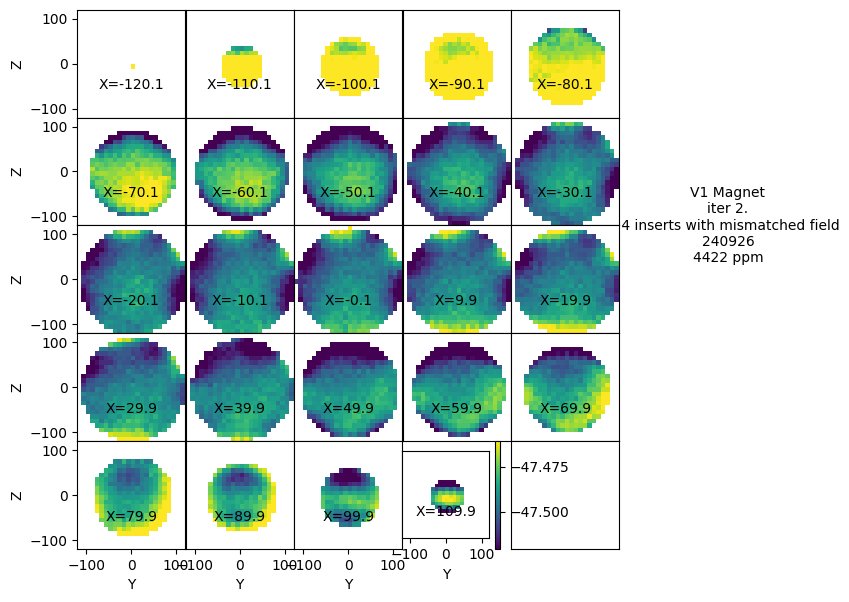

In [863]:
# shimmed field (RAW, ball, without mismatch)
# save shimmed field as 2d plots
from matplotlib import pyplot as plt
plt.figure(0)


xvals_raw = b0map_iter2_BALL_MISMATCHED.xPts
y = b0map_iter2_BALL_MISMATCHED.yPts
z = b0map_iter2_BALL_MISMATCHED.zPts

FieldMeasured_init = b0map_iter2_BALL_MISMATCHED.b0Data[:,:,:,2]# - b0map_iter2_A.b0Data[:,:,:,2]
#FieldMeasured[FieldMeasured==np.nanmin(FieldMeasured)] = np.nan


fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(7,7))

#xvals = b0map_comsol.xDim_SPH_fine


print('mean, mT: ',np.nanmean(FieldMeasured_init))
print('low, mT:',np.nanmin(FieldMeasured_init),'\nhigh, mT:',np.nanmax(FieldMeasured_init))

homoshimmed= (np.nanmax(FieldMeasured_init)-np.nanmin(FieldMeasured_init))/np.nanmean(FieldMeasured_init)*1e6

      
for i in range(5):
    for j in range(5):
        if i*5+j >=24:
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(2, 3, 'V1 Magnet\niter 2.\n 4 inserts with mismatched field\n240926\n%.0f ppm'%abs(homoshimmed), horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break
        xxx = axes[i,j].imshow(np.transpose(FieldMeasured_init[i*5+j,:,:]),clim=[np.nanmean(FieldMeasured_init)-0.03,np.nanmean(FieldMeasured_init)+0.03],origin = 'lower',extent=[-120,120,-120,120],cmap='viridis')
        #xxx = axes[i,j].contourf(z,y,FieldMeasured_shimmed[i*5+j,:,:],vmin=np.nanmin(FieldMeasured_shimmed),vmax=np.nanmax(FieldMeasured_shimmed))
        
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%xvals_raw[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==4:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        axes[i,j].set_aspect(1)
        
        plt.xlabel('Y')
        plt.ylabel('Z')
plt.subplots_adjust(hspace=0)
plt.subplots_adjust(wspace=0)



homo_after_iteration_2 = (np.nanmax(abs(FieldMeasured_init))-np.nanmin(abs(FieldMeasured_init)))/np.nanmean(abs(FieldMeasured_init))*1e6
print('raw homo after Iteration 2: %.0f ppm'%homo_after_iteration_2)

plt.show()


In [379]:

# spherical decomposition
diameter_of_sphere = b0map_iter2_B.path.radius*2
order = 12
resolution_of_sph_decomp = 10
print(diameter_of_sphere)

b0map_iter2_B.fitSphericalHarmonics(maxorder=order,dsv=diameter_of_sphere,resol=resolution_of_sph_decomp,component=2)

resolution_of_sph_fit=5
print('interpolating field with sph order %d, resol %.0f mm'%(order,resolution_of_sph_fit))

b0map_iter2_B.interpolateField(resol=resolution_of_sph_fit,dsv=diameter_of_sphere)


240.00014074926028
[25, 24, 24]
Mean field strength in 24 cm sphere: -47.52 mT
Inhomogeneity in 24 cm sphere: -4335 ppm
Inhomogeneity of fit: 4176 ppm
Error: -632 ppm
saved numpy array as ./data/tmp/SpHData.npy
interpolating field with sph order 12, resol 5 mm
sph coefficients loaded
making a fine coordinate grid
Inhomogeneity of fit: 4316 ppm
saved numpy array as ./data/tmp/B0_interpolated.npy


# plot of interpolated ball map

mean, mT:  -47.51969107357125
low, mT: -47.63840554510123 
high, mT: -47.433292970506


<Figure size 640x480 with 0 Axes>

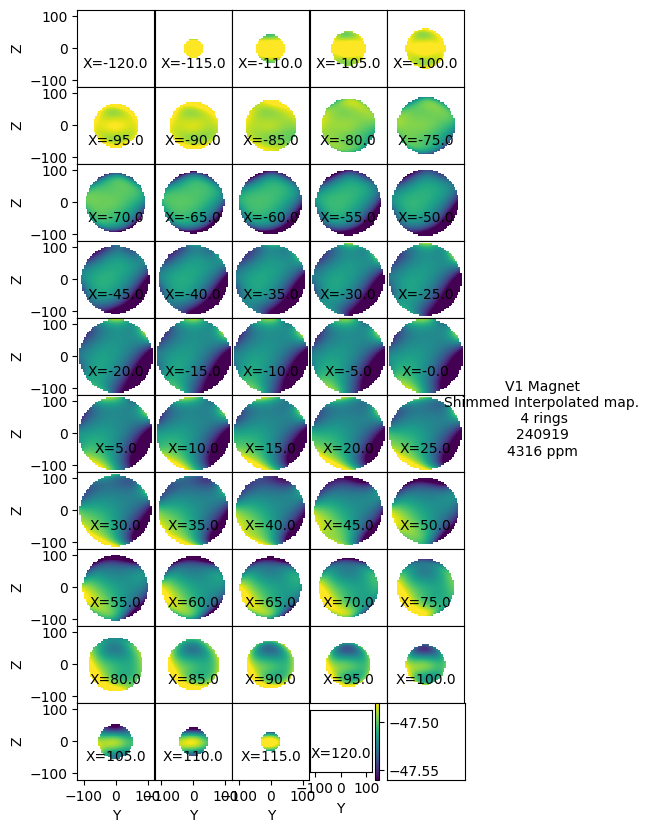

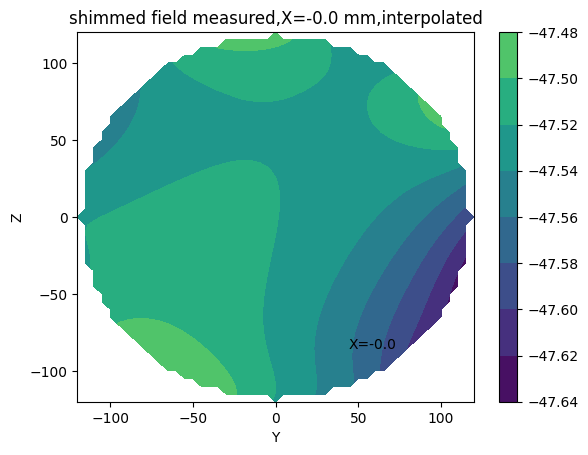

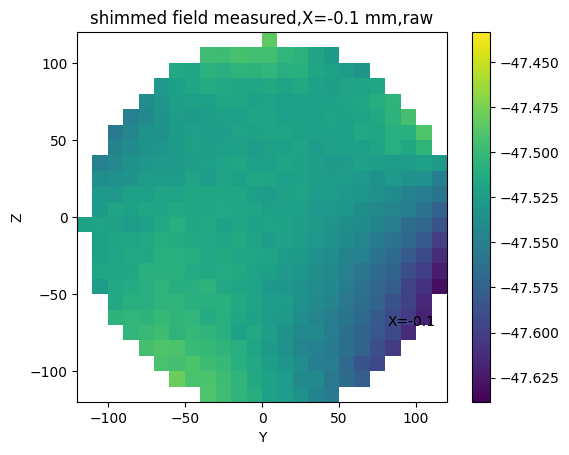

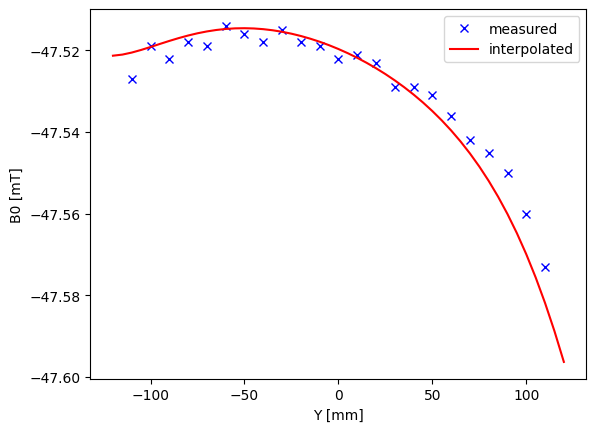

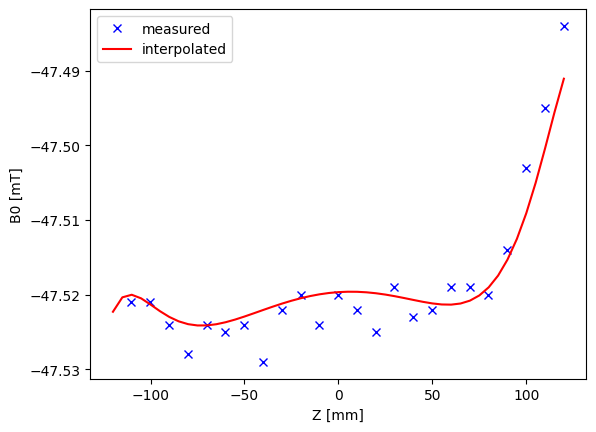

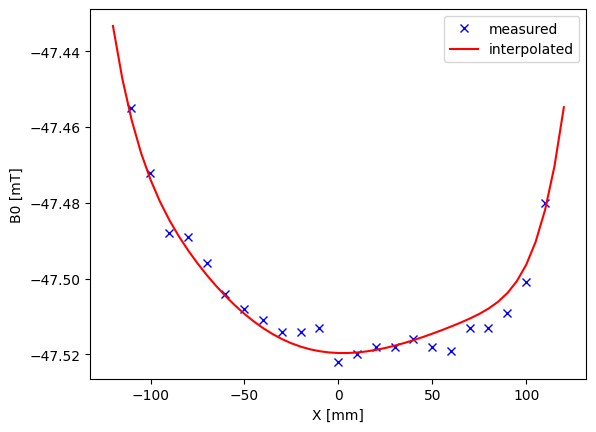

In [380]:

# shimmed field measured (INTERPOLATED)
# save initial field as 2d plots
from matplotlib import pyplot as plt
plt.figure(0)


xvals_fine = b0map_iter2_B.yDim_SPH_fine
y = b0map_iter2_B.yDim_SPH_fine
z = b0map_iter2_B.zDim_SPH_fine

FieldMeasured_shimmed = b0map_iter2_B.interpolatedField


fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(5, 10))

print('mean, mT: ',np.nanmean(FieldMeasured_shimmed))
print('low, mT:',np.nanmin(FieldMeasured_shimmed),'\nhigh, mT:',np.nanmax(FieldMeasured_shimmed))

homoinit = (np.nanmax(FieldMeasured_shimmed)-np.nanmin(FieldMeasured_shimmed))/np.nanmean(FieldMeasured_shimmed)*1e6

      
for i in range(10):
    for j in range(5):
        if i*5+j >=len(xvals_fine):
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(2.0, 5, '\n\n\nV1 Magnet\nShimmed Interpolated map.\n 4 rings\n240919\n%.0f ppm'%abs(homoinit), horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break
        #xxx = axes[i,j].imshow(np.transpose(FieldMeasured[i*5+j,:,:]),clim=[np.nanmin(FieldMeasured),np.nanmax(FieldMeasured)],origin = 'lower',extent=[-120,120,-120,120])
        xxx = axes[i,j].imshow(np.transpose(FieldMeasured_shimmed[i*5+j,:,:]),clim=[np.nanmean(FieldMeasured_shimmed)-0.04,np.nanmean(FieldMeasured_shimmed)+0.04],origin = 'lower',extent=[-120,120,-120,120])
        
        #xxx = axes[i,j].contourf(z,y,np.transpose(FieldMeasured[i*5+j,:,:]),vmin=np.nanmin(FieldMeasured), vmax=np.nanmax(FieldMeasured))
        axes[i,j].set_aspect(1)
        
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%xvals_fine[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==9:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        plt.xlabel('Y')
        plt.ylabel('Z')

plt.subplots_adjust(wspace=-0.0, hspace=0)
plt.show()


# plot at x=0
xsliceidx_finegrid = int(len(b0map_iter2_B.xDim_SPH_fine)/2)
plt.contourf(y,z,np.transpose(FieldMeasured_shimmed[xsliceidx_finegrid,:,:]),vmin=np.nanmin(FieldMeasured_shimmed),vmax=np.nanmax(FieldMeasured_shimmed))
plt.text(0.0, 0.0, 'X=%.1f'%xvals_fine[xsliceidx_finegrid], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
plt.xlabel('Y')
plt.ylabel('Z')
plt.title('shimmed field measured,X=%.1f mm,interpolated'%b0map_iter2_B.xDim_SPH_fine[xsliceidx_finegrid])
plt.colorbar()
plt.show()

xsliceidx_rawgrid = int(len(b0map_iter2_B.xPts)/2)
plt.imshow(np.transpose(b0map_iter2_B.b0Data[xsliceidx_rawgrid,:,:,2]),clim=[np.nanmin(FieldMeasured_shimmed),np.nanmax(FieldMeasured_shimmed)],origin = 'lower',extent=[-120,120,-120,120])
plt.text(0.5, 0.3, 'X=%.1f'%b0map_iter2_B.xPts[xsliceidx_rawgrid], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
plt.xlabel('Y')
plt.ylabel('Z')
plt.title('shimmed field measured,X=%.1f mm,raw'%b0map_iter2_B.xPts[xsliceidx_rawgrid])
plt.colorbar()
plt.show()

b0_along_y_at_z0_raw = b0map_iter2_B.b0Data[xsliceidx_rawgrid,:,xsliceidx_rawgrid,2]
b0_along_y_at_z0_fine = FieldMeasured_shimmed[xsliceidx_finegrid,:,xsliceidx_finegrid]

yvals_raw = b0map_iter2_B.yPts
yvals_fine = b0map_iter2_B.yDim_SPH_fine

plt.plot(yvals_raw,b0_along_y_at_z0_raw,'bx')
plt.plot(yvals_fine,b0_along_y_at_z0_fine,'r')
plt.legend(['measured','interpolated'])


plt.ylabel('B0 [mT]')
plt.xlabel('Y [mm]')
plt.show()

b0_along_z_at_xy0_raw = b0map_iter2_B.b0Data[xsliceidx_rawgrid,xsliceidx_rawgrid,:,2]
b0_along_z_at_xy0_fine = FieldMeasured_shimmed[xsliceidx_finegrid,xsliceidx_finegrid,:]

zvals_raw = b0map_iter2_B.zPts
zvals_fine = b0map_iter2_B.zDim_SPH_fine


plt.plot(zvals_raw,b0_along_z_at_xy0_raw,'bx')
plt.plot(zvals_fine,b0_along_z_at_xy0_fine,'r')
plt.legend(['measured','interpolated'])
plt.ylabel('B0 [mT]')
plt.xlabel('Z [mm]')
plt.show()


b0_along_x_at_yz0_raw = b0map_iter2_B.b0Data[:,xsliceidx_rawgrid,xsliceidx_rawgrid,2]
b0_along_x_at_yz0_fine = FieldMeasured_shimmed[:,xsliceidx_finegrid,xsliceidx_finegrid]

xvals_raw = b0map_iter2_B.xPts
xvals_fine = b0map_iter2_B.xDim_SPH_fine


plt.plot(xvals_raw,b0_along_x_at_yz0_raw,'bx')
plt.plot(zvals_fine,b0_along_x_at_yz0_fine,'r')
plt.legend(['measured','interpolated'])


plt.ylabel('B0 [mT]')
plt.xlabel('X [mm]')
plt.show()


# Shell map with 4 rings 
## mismatch considered 

mean, mT:  -47.51544607190414
low, mT: -47.62 
high, mT: -47.415
raw homo after Iteration 2: 4524 ppm


<Figure size 640x480 with 0 Axes>

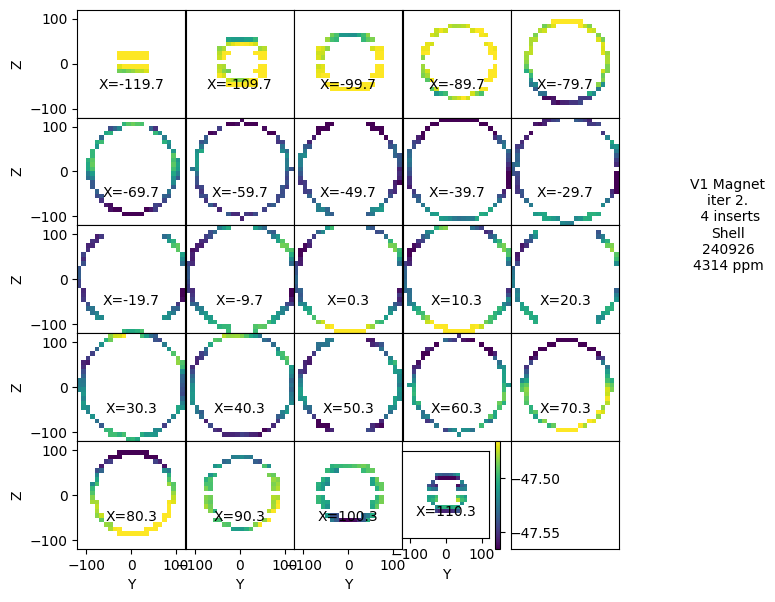

In [385]:
# shimmed field (RAW, without mismatch)
# save shimmed field as 2d plots
from matplotlib import pyplot as plt
plt.figure(0)


xvals_raw = b0map_iter2_SHELL.xPts
y = b0map_iter2_SHELL.yPts
z = b0map_iter2_SHELL.zPts

FieldMeasured_shell_iter_2 = b0map_iter2_SHELL.b0Data[:,:,:,2]# - b0map_iter2_A.b0Data[:,:,:,2]
#FieldMeasured[FieldMeasured==np.nanmin(FieldMeasured)] = np.nan


fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(7,7))

#xvals = b0map_comsol.xDim_SPH_fine


print('mean, mT: ',np.nanmean(FieldMeasured_shell_iter_2))
print('low, mT:',np.nanmin(FieldMeasured_shell_iter_2),'\nhigh, mT:',np.nanmax(FieldMeasured_shell_iter_2))

homoshimmed= (np.nanmax(FieldMeasured_shell_iter_2)-np.nanmin(FieldMeasured_shell_iter_2))/np.nanmean(FieldMeasured_shell_iter_2)*1e6

      
for i in range(5):
    for j in range(5):
        if i*5+j >=len(xvals_raw):
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(2, 3, 'V1 Magnet\niter 2.\n 4 inserts\nShell\n240926\n%.0f ppm'%abs(homoshimmed), horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break
        xxx = axes[i,j].imshow(np.transpose(FieldMeasured_shell_iter_2[i*5+j,:,:]),clim=[np.nanmean(FieldMeasured_shell_iter_2)-0.05,np.nanmean(FieldMeasured_shell_iter_2)+0.05],origin = 'lower',extent=[-120,120,-120,120],cmap='viridis')
        #xxx = axes[i,j].contourf(z,y,FieldMeasured_shimmed[i*5+j,:,:],vmin=np.nanmin(FieldMeasured_shimmed),vmax=np.nanmax(FieldMeasured_shimmed))
        
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%xvals_raw[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==4:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        axes[i,j].set_aspect(1)
        
        plt.xlabel('Y')
        plt.ylabel('Z')
plt.subplots_adjust(hspace=0)
plt.subplots_adjust(wspace=0)



homo_after_iteration_2 = (np.nanmax(abs(FieldMeasured_init))-np.nanmin(abs(FieldMeasured_init)))/np.nanmean(abs(FieldMeasured_init))*1e6
print('raw homo after Iteration 2: %.0f ppm'%homo_after_iteration_2)

plt.show()


# Spherical Harm. Decomposition
## of the shell map

In [869]:

# spherical decomposition
diameter_of_sphere = b0map_iter2_SHELL.path.radius*2
order = 12
resolution_of_sph_decomp = 7
print(diameter_of_sphere)

b0map_iter2_SHELL.fitSphericalHarmonics(maxorder=order,dsv=diameter_of_sphere,resol=resolution_of_sph_decomp,component=2)

resolution_of_sph_fit=5
print('interpolating field with sph order %d, resol %.0f mm'%(order,resolution_of_sph_fit))

b0map_iter2_SHELL.interpolateField(resol=resolution_of_sph_fit,dsv=diameter_of_sphere)

240.01264478121482
[24, 24, 24]
Mean field strength in 24 cm sphere: -47.52 mT
Inhomogeneity in 24 cm sphere: -4272 ppm
Inhomogeneity of fit: 4569 ppm
Error: -817 ppm
saved numpy array as ./data/tmp/SpHData.npy
interpolating field with sph order 12, resol 5 mm
sph coefficients loaded
making a fine coordinate grid
Inhomogeneity of fit: 4613 ppm
saved numpy array as ./data/tmp/B0_interpolated.npy


# plot of extrapolated shell map
## in the spherical volume

mean, mT:  -47.51450248207058
low, mT: -47.62921351862969 
high, mT: -47.41001651003147


<Figure size 640x480 with 0 Axes>

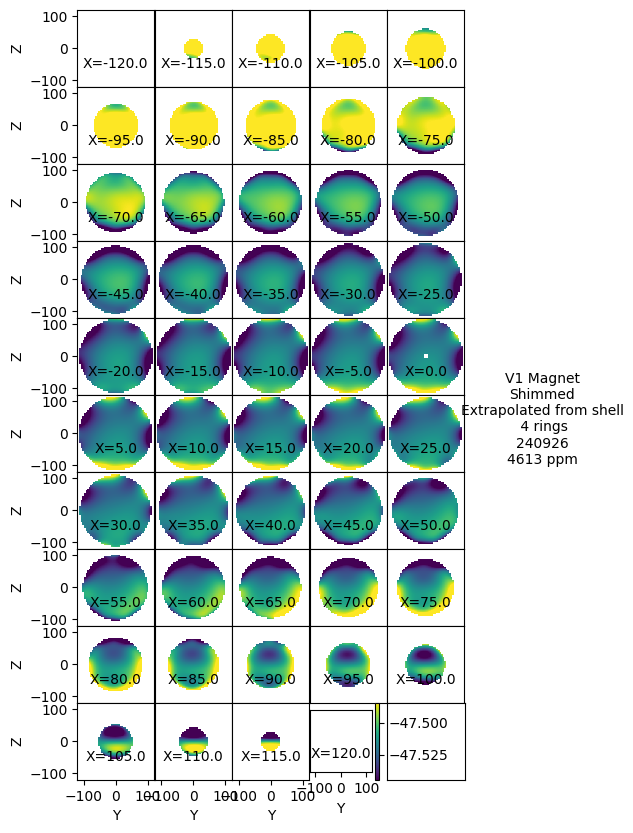

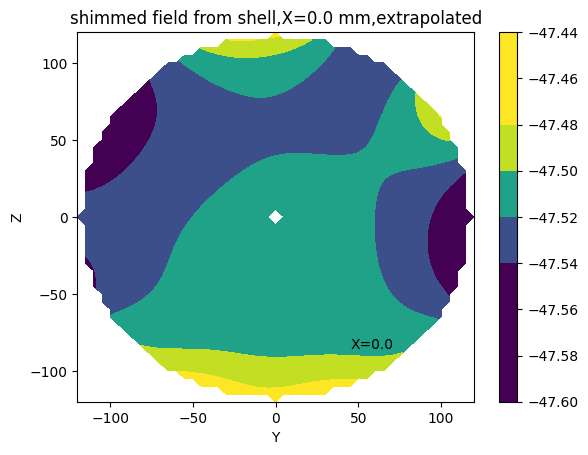

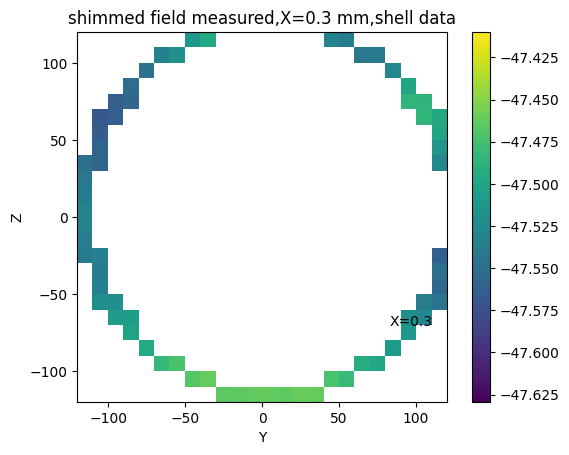

In [870]:

# shimmed field measured (INTERPOLATED)
# save initial field as 2d plots
from matplotlib import pyplot as plt
plt.figure(0)


xvals_fine = b0map_iter2_SHELL.yDim_SPH_fine
y = b0map_iter2_SHELL.yDim_SPH_fine
z = b0map_iter2_SHELL.zDim_SPH_fine

FieldMeasured_shimmed_from_shell = b0map_iter2_SHELL.interpolatedField


fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(5, 10))

print('mean, mT: ',np.nanmean(FieldMeasured_shimmed_from_shell))
print('low, mT:',np.nanmin(FieldMeasured_shimmed_from_shell),'\nhigh, mT:',np.nanmax(FieldMeasured_shimmed_from_shell))

homoinit = (np.nanmax(FieldMeasured_shimmed_from_shell)-np.nanmin(FieldMeasured_shimmed_from_shell))/np.nanmean(FieldMeasured_shimmed_from_shell)*1e6

      
for i in range(10):
    for j in range(5):
        if i*5+j >=len(xvals_fine):
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(2.0, 5, '\n\n\nV1 Magnet\nShimmed\nExtrapolated from shell\n 4 rings\n240926\n%.0f ppm'%abs(homoinit), horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break
        #xxx = axes[i,j].imshow(np.transpose(FieldMeasured[i*5+j,:,:]),clim=[np.nanmin(FieldMeasured),np.nanmax(FieldMeasured)],origin = 'lower',extent=[-120,120,-120,120])
        xxx = axes[i,j].imshow(np.transpose(FieldMeasured_shimmed_from_shell[i*5+j,:,:]),clim=[np.nanmean(FieldMeasured_shimmed_from_shell)-0.03,np.nanmean(FieldMeasured_shimmed_from_shell)+0.03],origin = 'lower',extent=[-120,120,-120,120])
        
        #xxx = axes[i,j].contourf(z,y,np.transpose(FieldMeasured[i*5+j,:,:]),vmin=np.nanmin(FieldMeasured), vmax=np.nanmax(FieldMeasured))
        axes[i,j].set_aspect(1)
        
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%xvals_fine[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==9:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        plt.xlabel('Y')
        plt.ylabel('Z')

plt.subplots_adjust(wspace=-0.0, hspace=0)
plt.show()


# plot at x=0
xsliceidx_finegrid = int(len(b0map_iter2_SHELL.xDim_SPH_fine)/2)
plt.contourf(y,z,np.transpose(FieldMeasured_shimmed_from_shell[xsliceidx_finegrid,:,:]),vmin=np.nanmean(FieldMeasured_shimmed_from_shell)-0.03,vmax=np.nanmean(FieldMeasured_shimmed_from_shell)+0.03)
plt.text(0.0, 0.0, 'X=%.1f'%xvals_fine[xsliceidx_finegrid], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
plt.xlabel('Y')
plt.ylabel('Z')
plt.title('shimmed field from shell,X=%.1f mm,extrapolated'%b0map_iter2_SHELL.xDim_SPH_fine[xsliceidx_finegrid])
plt.colorbar()
plt.show()

xsliceidx_rawgrid = int(len(b0map_iter2_B.xPts)/2)
plt.imshow(np.transpose(b0map_iter2_SHELL.b0Data[xsliceidx_rawgrid,:,:,2]),clim=[np.nanmin(FieldMeasured_shimmed_from_shell),np.nanmax(FieldMeasured_shimmed_from_shell)],origin = 'lower',extent=[-120,120,-120,120])
plt.text(0.5, 0.3, 'X=%.1f'%b0map_iter2_SHELL.xPts[xsliceidx_rawgrid], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
plt.xlabel('Y')
plt.ylabel('Z')
plt.title('shimmed field measured,X=%.1f mm,shell data'%b0map_iter2_SHELL.xPts[xsliceidx_rawgrid])
plt.colorbar()
plt.show()


# **DIFF** maps

## difference between measured maps

### shimmed - unshimmed =?= shim field

# shimmed simulated - shimmed measured
## as a correction for the 4 ring sim (recalculation)

In [393]:
smulated_shimmed_field = shimmed_Field_simulated_RENDERED
measured_shimmed_field = b0map_iter2_SHELL.interpolatedField # was iter2_B before

mismatch_of_sim_and_measurement = measured_shimmed_field - smulated_shimmed_field
zeroed_mismatch_field = mismatch_of_sim_and_measurement - np.nanmean(mismatch_of_sim_and_measurement)

# this mismatch must be added to the initial map



(49, 49, 49)
mean, mT:  -6.637411755754084e-18
low, mT: -0.09544622164461078 
high, mT: 0.07420973363047192


<Figure size 640x480 with 0 Axes>

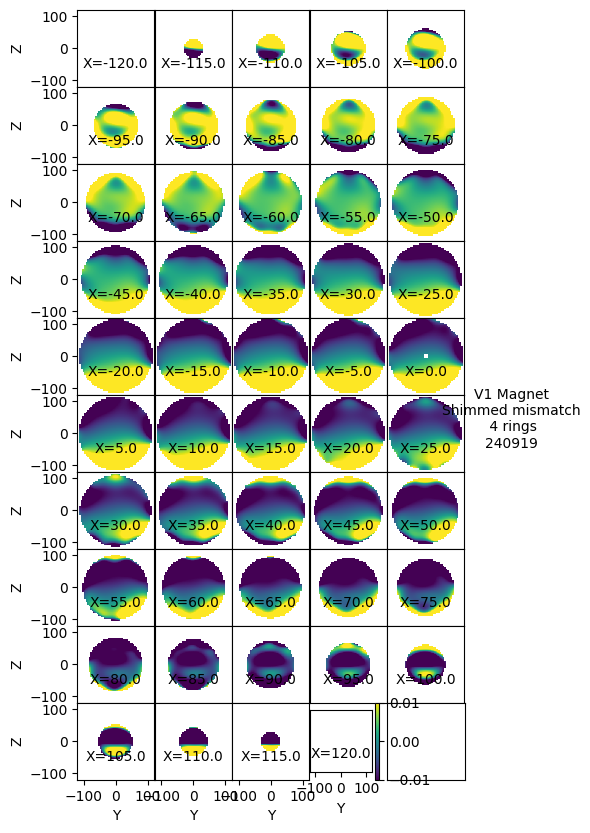

In [394]:
# plot the difference map
# measured shimmed - measured initial

OFST_meas_vs_sim = 0# mT
 
plt.figure(0)


xvals_fine = b0map_iter2_SHELL.yDim_SPH_fine
y = b0map_iter2_SHELL.yDim_SPH_fine
z = b0map_iter2_SHELL.zDim_SPH_fine

MISMATCH_FIELD_TO_PLOT = zeroed_mismatch_field


print(np.shape(MISMATCH_FIELD_TO_PLOT))


fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(5, 10))

print('mean, mT: ',np.nanmean(MISMATCH_FIELD_TO_PLOT))
print('low, mT:',np.nanmin(MISMATCH_FIELD_TO_PLOT),'\nhigh, mT:',np.nanmax(MISMATCH_FIELD_TO_PLOT))

homoinit = (np.nanmax(MISMATCH_FIELD_TO_PLOT)-np.nanmin(MISMATCH_FIELD_TO_PLOT))/np.nanmean(MISMATCH_FIELD_TO_PLOT)*1e6

      
for i in range(10):
    for j in range(5):
        if i*5+j >=len(xvals_fine):
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(1.6, 5, '\n\n\nV1 Magnet\nShimmed mismatch\n 4 rings\n240919', horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break
        xxx = axes[i,j].imshow(np.transpose(MISMATCH_FIELD_TO_PLOT[i*5+j,:,:]),clim=[np.nanmean(MISMATCH_FIELD_TO_PLOT)-0.01,np.nanmean(MISMATCH_FIELD_TO_PLOT)+0.01],origin = 'lower',extent=[-120,120,-120,120])
        #xxx = axes[i,j].contourf(z,y,np.transpose(FieldMeasured[i*5+j,:,:]),vmin=np.nanmin(FieldMeasured), vmax=np.nanmax(FieldMeasured))

        axes[i,j].set_aspect(1)
        
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%xvals_fine[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==9:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        plt.xlabel('Y')
        plt.ylabel('Z')

plt.subplots_adjust(wspace=-0.0, hspace=0)
plt.show()



In [218]:
# diference between initial and shimmed maps. measured

# FieldMeasured is initially measured field
# FieldMeasuredShimmed is field measured with rings 

print(np.nanmin(b0map_iter2_B.interpolatedField)) # interpolated stuff
print(np.nanmin(b0map_iter1.interpolatedField))


print(np.nanmax(b0map_iter2_B.interpolatedField))
print(np.nanmax(b0map_iter1.interpolatedField))

field_diff_init_shimmed_measured = b0map_iter2_B.interpolatedField - b0map_iter1.interpolatedField



-47.63840554510123
-47.66463929070471
-47.433292970506
-47.330196868652436


# Difference Map 
## between **initial** field and **shimmed** field
### has to give the shim field

In [219]:
# flip X and Y in the optimized_shim_Field_masked

tmp = np.copy(simulated_shim_Field_masked)
for i in range(len(b0map_iter1.xDim_SPH_fine)):
    for j in range(len(b0map_iter1.yDim_SPH_fine)):
        tmp[i,j,:] = simulated_shim_Field_masked[j,i,:]

optimized_shim_Field_masked_flipped_XY = tmp

 

In [396]:
# plot the difference map
# measured shimmed - measured initial

OFST_meas_vs_sim = -0.0# mT
 
plt.figure(0)


xvals_fine = b0map_iter2_SHELL.yDim_SPH_fine
y = b0map_iter2_SHELL.yDim_SPH_fine
z = b0map_iter2_SHELL.zDim_SPH_fine

MEASURED_SHIM_FIELD_TO_PLOT = b0map_iter2_SHELL.interpolatedField - FieldMeasured_init
SMIULATED_SHIM_FIELD_TO_PLOT = simulated_shim_Field_masked +  OFST_meas_vs_sim


print(np.shape(MEASURED_SHIM_FIELD_TO_PLOT))


fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(5, 10))

print('mean, mT: ',np.nanmean(MEASURED_SHIM_FIELD_TO_PLOT))
print('low, mT:',np.nanmin(MEASURED_SHIM_FIELD_TO_PLOT),'\nhigh, mT:',np.nanmax(MEASURED_SHIM_FIELD_TO_PLOT))

homoinit = (np.nanmax(MEASURED_SHIM_FIELD_TO_PLOT)-np.nanmin(MEASURED_SHIM_FIELD_TO_PLOT))/np.nanmean(MEASURED_SHIM_FIELD_TO_PLOT)*1e6

      
for i in range(10):
    for j in range(5):
        if i*5+j >=len(xvals_fine):
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(1.6, 5, '\n\n\nV1 Magnet\nShimmed - init\n 4 rings\n240926', horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break
        #xxx = axes[i,j].imshow(np.transpose(FieldMeasured[i*5+j,:,:]),clim=[np.nanmin(FieldMeasured),np.nanmax(FieldMeasured)],origin = 'lower',extent=[-120,120,-120,120])
        xxx = axes[i,j].imshow(np.transpose(MEASURED_SHIM_FIELD_TO_PLOT[i*5+j,:,:]),clim=[np.nanmin(MEASURED_SHIM_FIELD_TO_PLOT),np.nanmax(MEASURED_SHIM_FIELD_TO_PLOT)],origin = 'lower',extent=[-120,120,-120,120])
        #xxx = axes[i,j].imshow(np.transpose(optimized_shim_Field_masked[i*5+j,:,:]),clim=[np.nanmin(optimized_shim_Field_masked),np.nanmax(optimized_shim_Field_masked)],origin = 'lower',extent=[-120,120,-120,120])
        
        #xxx = axes[i,j].contourf(z,y,np.transpose(FieldMeasured[i*5+j,:,:]),vmin=np.nanmin(FieldMeasured), vmax=np.nanmax(FieldMeasured))
        axes[i,j].set_aspect(1)
        
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%xvals_fine[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==9:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        plt.xlabel('Y')
        plt.ylabel('Z')

plt.subplots_adjust(wspace=-0.0, hspace=0)
plt.show()


# 1D plots
xvals_fine = b0map_iter2_B.xDim_SPH_fine
yvals_fine = b0map_iter2_B.yDim_SPH_fine
zvals_fine = b0map_iter2_B.zDim_SPH_fine

xsliceidx_finegrid = int(len(xvals_fine)/2)

# -------------- cross section along X -----------------
b0_along_x_at_yz0_fine_measured_shim = MEASURED_SHIM_FIELD_TO_PLOT[:,xsliceidx_finegrid,xsliceidx_finegrid]
b0_along_x_at_yz0_fine_simulated_shim = SMIULATED_SHIM_FIELD_TO_PLOT[:,xsliceidx_finegrid,xsliceidx_finegrid]


plt.plot(xvals_fine,b0_along_x_at_yz0_fine_measured_shim,'rx-')
plt.plot(xvals_fine,b0_along_x_at_yz0_fine_simulated_shim,'g')
plt.plot(xvals_fine,b0_along_x_at_yz0_fine_simulated_shim-b0_along_x_at_yz0_fine_measured_shim,'k--')



plt.legend(['measured shim field, Y,Z=%.1f mm'%xvals_fine[xsliceidx_finegrid], 'simulated shim field, Y,Z=%.1f mm'%xvals_fine[xsliceidx_finegrid],'diff'])


plt.ylabel('B0 [mT]')
plt.xlabel('X [mm]')
plt.show()

# -------------- cross section along Y -----------------
b0_along_y_at_xz0_fine_measured_shim = MEASURED_SHIM_FIELD_TO_PLOT[xsliceidx_finegrid,:,xsliceidx_finegrid]
b0_along_y_at_xz0_fine_simulated_shim = SMIULATED_SHIM_FIELD_TO_PLOT[xsliceidx_finegrid,:,xsliceidx_finegrid]


plt.plot(yvals_fine,b0_along_y_at_xz0_fine_measured_shim,'rx-')
plt.plot(yvals_fine,b0_along_y_at_xz0_fine_simulated_shim,'g')
plt.plot(yvals_fine,b0_along_y_at_xz0_fine_simulated_shim-b0_along_y_at_xz0_fine_measured_shim,'k--')


plt.legend(['measured shim field, X,Z=%.1f mm'%xvals_fine[xsliceidx_finegrid], 'simulated shim field, X,Z=%.1f mm'%xvals_fine[xsliceidx_finegrid],'diff'])


plt.ylabel('B0 [mT]')
plt.xlabel('Y [mm]')
plt.show()

# -------------- cross section along Z -----------------
b0_along_z_at_xy0_fine_measured_shim = MEASURED_SHIM_FIELD_TO_PLOT[xsliceidx_finegrid,xsliceidx_finegrid,:]
b0_along_z_at_xy0_fine_simulated_shim = SMIULATED_SHIM_FIELD_TO_PLOT[xsliceidx_finegrid,xsliceidx_finegrid,:]


plt.plot(zvals_fine,b0_along_z_at_xy0_fine_measured_shim,'rx-')
plt.plot(zvals_fine,b0_along_z_at_xy0_fine_simulated_shim,'g')
plt.plot(zvals_fine,b0_along_z_at_xy0_fine_simulated_shim-b0_along_z_at_xy0_fine_measured_shim,'k--')


plt.legend(['measured shim field, X,Y=%.1f mm'%xvals_fine[xsliceidx_finegrid], 'simulated shim field, X,Y=%.1f mm'%xvals_fine[xsliceidx_finegrid],'diff'])


plt.ylabel('B0 [mT]')
plt.xlabel('Z [mm]')
plt.show()

# -------------- cross sections along Y and Z at X=-90 -----------------

# -------------- cross section along Z, X=-90 -----------------
xsliceidx_finegrid = 6
ysliceidx_finegrid = int(len(yvals_fine)/2)

b0_along_z_at_xn90y0_fine_measured_shim = MEASURED_SHIM_FIELD_TO_PLOT[xsliceidx_finegrid,ysliceidx_finegrid,:]
b0_along_z_at_xn90y0_fine_simulated_shim = SMIULATED_SHIM_FIELD_TO_PLOT[xsliceidx_finegrid,ysliceidx_finegrid,:]


plt.plot(zvals_fine,b0_along_z_at_xn90y0_fine_measured_shim,'rx-')
plt.plot(zvals_fine,b0_along_z_at_xn90y0_fine_simulated_shim,'g')
plt.plot(zvals_fine,b0_along_z_at_xn90y0_fine_simulated_shim-b0_along_z_at_xn90y0_fine_measured_shim,'k--')


plt.legend(['measured shim field, X=%.1f,Y=%.1f mm'%(xvals_fine[xsliceidx_finegrid],yvals_fine[ysliceidx_finegrid]), 'simulated shim field, X=%.1f,Y=%.1f mm'%(xvals_fine[xsliceidx_finegrid],yvals_fine[ysliceidx_finegrid]),'diff'])


plt.ylabel('B0 [mT]')
plt.xlabel('Z [mm]')
plt.show()

# -------------- cross section along Y, X=-90 -----------------
xsliceidx_finegrid = 6
zsliceidx_finegrid = int(len(zvals_fine)/2)

b0_along_y_at_xn90z0_fine_measured_shim = MEASURED_SHIM_FIELD_TO_PLOT[xsliceidx_finegrid,:,zsliceidx_finegrid]
b0_along_y_at_xn90z0_fine_simulated_shim = SMIULATED_SHIM_FIELD_TO_PLOT[xsliceidx_finegrid,:,zsliceidx_finegrid]


plt.plot(yvals_fine,b0_along_y_at_xn90z0_fine_measured_shim,'rx-')
plt.plot(yvals_fine,b0_along_y_at_xn90z0_fine_simulated_shim,'g')
plt.plot(yvals_fine,b0_along_y_at_xn90z0_fine_simulated_shim-b0_along_y_at_xn90z0_fine_measured_shim,'k--')



plt.legend(['measured shim field, X=%.1f,Z=%.1f mm'%(xvals_fine[xsliceidx_finegrid],zvals_fine[zsliceidx_finegrid]), 'simulated shim field, X=%.1f,Z=%.1f mm'%(xvals_fine[xsliceidx_finegrid],zvals_fine[zsliceidx_finegrid]),'diff'])


plt.ylabel('B0 [mT]')
plt.xlabel('Y [mm]')
plt.show()
 
 
 

# -------------- cross sections along Y and Z at X=+90 -----------------

# -------------- cross section along Z, X=+90 -----------------


xsliceidx_finegrid = -7
ysliceidx_finegrid = int(len(yvals_fine)/2)

b0_along_z_at_xp90y0_fine_measured_shim = MEASURED_SHIM_FIELD_TO_PLOT[xsliceidx_finegrid,ysliceidx_finegrid,:]
b0_along_z_at_xp90y0_fine_simulated_shim = SMIULATED_SHIM_FIELD_TO_PLOT[xsliceidx_finegrid,ysliceidx_finegrid,:]


plt.plot(zvals_fine,b0_along_z_at_xp90y0_fine_measured_shim,'rx-')
plt.plot(zvals_fine,b0_along_z_at_xp90y0_fine_simulated_shim,'g')
plt.plot(zvals_fine,b0_along_z_at_xp90y0_fine_simulated_shim-b0_along_z_at_xp90y0_fine_measured_shim,'k--')

plt.legend(['measured shim field, X=%.1f,Y=%.1f mm'%(xvals_fine[xsliceidx_finegrid],yvals_fine[ysliceidx_finegrid]), 'simulated shim field, X=%.1f,Y=%.1f mm'%(xvals_fine[xsliceidx_finegrid],yvals_fine[ysliceidx_finegrid]),'diff'])


plt.ylabel('B0 [mT]')
plt.xlabel('Z [mm]')
plt.show()

# -------------- cross section along Y, X=-90 -----------------
xsliceidx_finegrid = -7
zsliceidx_finegrid = int(len(zvals_fine)/2)

b0_along_y_at_xp90z0_fine_measured_shim = MEASURED_SHIM_FIELD_TO_PLOT[xsliceidx_finegrid,:,zsliceidx_finegrid]
b0_along_y_at_xp90z0_fine_simulated_shim = SMIULATED_SHIM_FIELD_TO_PLOT[xsliceidx_finegrid,:,zsliceidx_finegrid]


plt.plot(yvals_fine,b0_along_y_at_xp90z0_fine_measured_shim,'rx-')
plt.plot(yvals_fine,b0_along_y_at_xp90z0_fine_simulated_shim,'g')
plt.plot(yvals_fine,b0_along_y_at_xp90z0_fine_simulated_shim-b0_along_y_at_xp90z0_fine_measured_shim,'k--')


plt.legend(['measured shim field, X=%.1f,Z=%.1f mm'%(xvals_fine[xsliceidx_finegrid],zvals_fine[zsliceidx_finegrid]), 'simulated shim field, X=%.1f,Z=%.1f mm'%(xvals_fine[xsliceidx_finegrid],zvals_fine[zsliceidx_finegrid]),'diff'])


plt.ylabel('B0 [mT]')
plt.xlabel('Y [mm]')
plt.show()


ValueError: operands could not be broadcast together with shapes (49,49,49) (25,24,24) 

<Figure size 640x480 with 0 Axes>

In [ ]:
# Diference map
## between the measured shim field
## and the simulated shim field
### has to be zero

(49, 49, 49)
mean, mT:  -0.11968300967801232
low, mT: -0.23425269658470427 
high, mT: -0.05419336176075262


<Figure size 640x480 with 0 Axes>

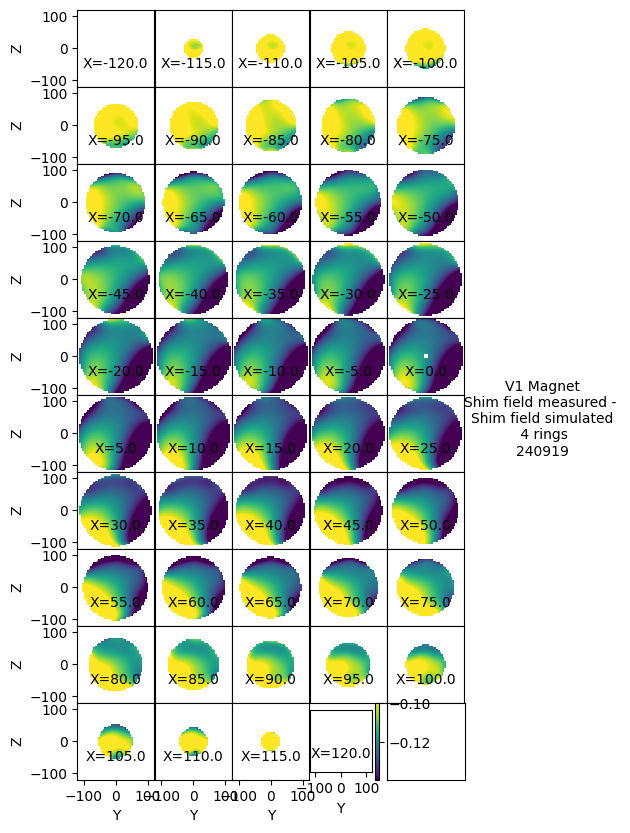

In [170]:


# plot the difference map
# measured shimmed - measured initial

plt.figure(0)


xvals_fine = b0map_iter2.yDim_SPH_fine
y = b0map_iter2.yDim_SPH_fine
z = b0map_iter2.zDim_SPH_fine

FIELD_TO_PLOT = b0map_iter2.interpolatedField - b0map_iter1.interpolatedField - shimField_Rendered

print(np.shape(FIELD_TO_PLOT))


fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(5, 10))

print('mean, mT: ',np.nanmean(FIELD_TO_PLOT))
print('low, mT:',np.nanmin(FIELD_TO_PLOT),'\nhigh, mT:',np.nanmax(FIELD_TO_PLOT))

homoinit = (np.nanmax(FIELD_TO_PLOT)-np.nanmin(FIELD_TO_PLOT))/np.nanmean(FIELD_TO_PLOT)*1e6

      
for i in range(10):
    for j in range(5):
        if i*5+j >=len(xvals_fine):
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(2.0, 5, '\n\n\nV1 Magnet\nShim field measured - \nShim field simulated\n 4 rings\n240919', horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break
        #xxx = axes[i,j].imshow(np.transpose(FieldMeasured[i*5+j,:,:]),clim=[np.nanmin(FieldMeasured),np.nanmax(FieldMeasured)],origin = 'lower',extent=[-120,120,-120,120])
        xxx = axes[i,j].imshow(np.transpose(FIELD_TO_PLOT[i*5+j,:,:]),clim=[np.nanmean(FIELD_TO_PLOT)-0.02,np.nanmean(FIELD_TO_PLOT)+0.02],origin = 'lower',extent=[-120,120,-120,120])
        #xxx = axes[i,j].imshow(np.transpose(optimized_shim_Field_masked[i*5+j,:,:]),clim=[np.nanmin(optimized_shim_Field_masked),np.nanmax(optimized_shim_Field_masked)],origin = 'lower',extent=[-120,120,-120,120])
        
        #xxx = axes[i,j].contourf(z,y,np.transpose(FieldMeasured[i*5+j,:,:]),vmin=np.nanmin(FieldMeasured), vmax=np.nanmax(FieldMeasured))
        axes[i,j].set_aspect(1)
        
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%xvals_fine[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==9:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        plt.xlabel('Y')
        plt.ylabel('Z')

plt.subplots_adjust(wspace=-0.0, hspace=0)
plt.show()


# Shimming iteration 3
## with one ring

In [397]:
# get the measured shimmed map, interpolate, plot, consider line plots.
# generate shim magnets in one ring, place in the center at first.
# shim with one ring
# consider 5,6,7 mm magnets

max_val_iter_2 = np.nanmax(b0map_iter2_SHELL.interpolatedField)
min_val_iter_2 = np.nanmin(b0map_iter2_SHELL.interpolatedField)

print(max_val_iter_2)
print(min_val_iter_2)


-47.41001651003147
-47.62921351862969


# Defining magnet positions in the ring

In [943]:
#shim tray configuration
def ringposFromTrayNr(trays_ocp):
    trayslitspacing = 9e-3 # [m]
    coordinates = []
    for tray_pos in trays_ocp:
        coordinate = trayslitspacing*tray_pos-4.5e-3 if tray_pos>0 else trayslitspacing*tray_pos+4.5e-3
        coordinates.append(coordinate)
    return coordinates


shimRadius          =276*1e-3  # radius on which the shim magnets are placed

trays_occupied = [-20,-10,5]  # [-13,-5,1,13] # for iteration 2 [-16, -8, 8, 16] # for iteration 1
ringPositions_iter_3       = ringposFromTrayNr(trays_occupied)#[-121.5*1e-3, -40.5*1e-3, 31.5*1e-3, 121.5*1e-3]#np.linspace(-ringspacingouter,ringspacingouter,4)#np.linspace(-0.1755,0.1755,4)          #np.linspace(-0.2295, .2295, 4) #Z positions to place shin rubgs
print('rings at ',np.array(ringPositions_iter_3)*1e3,'mm')


rings at  [-175.5  -85.5   40.5] mm


In [944]:
magsPerSegment      = 7             # number of magnets peer shim tray segment
anglePerSegment     = 19.25 #the angular distance in degrees between the furthest magnets in a shim tray (span of magnets in shim tray)
numSegments         = 12 #corresponds to the number of shim trays


segmentAngles       = np.linspace(0,360, numSegments, endpoint = False)

magAngles           = np.linspace(-anglePerSegment/2, anglePerSegment/2, magsPerSegment) 

print('let us position some magnets on a circumference of a R=%.0f mm YZ circle with X=0'%(shimRadius*1000))

positions_iter_3 = []

for ringPosition in ringPositions_iter_3:
    for segmentAngle in segmentAngles:
        for magAngle in magAngles:
            position = [ringPosition,shimRadius*np.cos((segmentAngle+magAngle)*np.pi/180), shimRadius*np.sin((segmentAngle+magAngle)*np.pi/180)]
            positions_iter_3.append(position)
                
print(len(positions_iter_3))

for pos in positions_iter_3:
    print('x',pos[0],'y',pos[1],'z',pos[2])

let us position some magnets on a circumference of a R=276 mm YZ circle with X=0
252
x -0.1755 y 0.27211479674710887 z -0.04614691096140277
x -0.1755 y 0.2742709847847707 z -0.030845208788272026
x -0.1755 y 0.27556740718070843 z -0.015446815196073495
x -0.1755 y 0.276 z 0.0
x -0.1755 y 0.27556740718070843 z 0.0154468151960735
x -0.1755 y 0.2742709847847707 z 0.030845208788272037
x -0.1755 y 0.27211479674710887 z 0.04614691096140277
x -0.1755 y 0.2587317822093368 z 0.09609300117480107
x -0.1755 y 0.2529482447387227 z 0.11042275799670676
x -0.1755 y 0.2463717826715406 z 0.12440636922299107
x -0.1755 y 0.2390230114445051 z 0.13799999999999998
x -0.1755 y 0.2309249674754671 z 0.15116103795771738
x -0.1755 y 0.22210303595045067 z 0.16384822678806393
x -0.1755 y 0.21258487124793404 z 0.17602179557230782
x -0.1755 y 0.17602179557230782 z 0.21258487124793404
x -0.1755 y 0.16384822678806393 z 0.22210303595045067
x -0.1755 y 0.15116103795771738 z 0.2309249674754671
x -0.1755 y 0.1380000000000000

Text(0.5, 1.0, 'Shimming Ring, iteration 3')

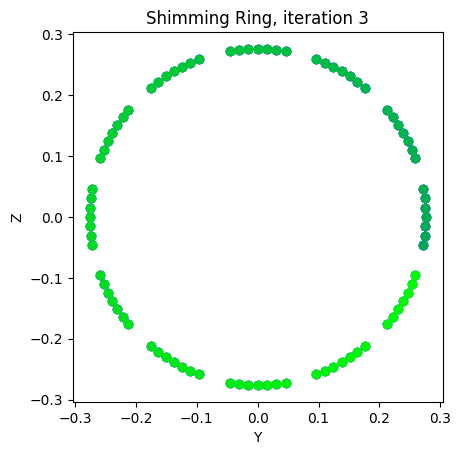

In [945]:
import matplotlib.pyplot as plt
axs = plt.axes()
for idx,position in enumerate(positions_iter_3):

    axs.scatter(position[1],position[2],color = [0,idx/len(positions_iter_3),1-idx/len(positions_iter_3)])
    
axs.set_aspect(1)
plt.xlabel('Y')
plt.ylabel('Z')
plt.title('Shimming Ring, iteration 3')

# Rendering of the shim magnet fields

In [946]:
# shim magnets positinoing

mu                  = 1e-7

magSizeOuter        = 6*1e-3        #size of shim magnets

bRem                = 1.35 # [T]      #remanence field of shim magnets


initialField = b0map_iter2_SHELL.interpolatedField

numMags_iter_3 = len(positions_iter_3)
coordinate_grid = b0map_iter2_SHELL.coord_grid_fine



magnetFields_iter_3 = np.zeros((np.shape(initialField)+(3,numMags_iter_3)), dtype = np.float32)


def magnetization(bRem, dimensions, shape = 'cube', evalDistance = 1):
    #Use the analytical expression for the z component of a cube magnet to estimate
    #dipole momentstrength for correct scaling. Dipole approximation only valid 
    #far-ish away from magnet, comparison made at 1 meter distance.
    if shape == 'cube':
        b_analytic = (bRem/np.pi) *(np.arctan2(dimensions**2, 2*evalDistance *np.sqrt(4*(evalDistance**2) + 2*(dimensions**2)))-\
                        np.arctan2(dimensions**2, 2*(dimensions + evalDistance)*\
                                   np.sqrt(4*((dimensions+evalDistance)**2)+2*(dimensions**2))))
    
        dip_mom = b_analytic * (dimensions/2 + evalDistance)**3 /(2*mu) #strength of the dipole moment
    
    return dip_mom


from utils import shimming_magnet


DSV = 2*max(b0map_iter2_SHELL.xDim_SPH_fine)#b0map.path.radius*2


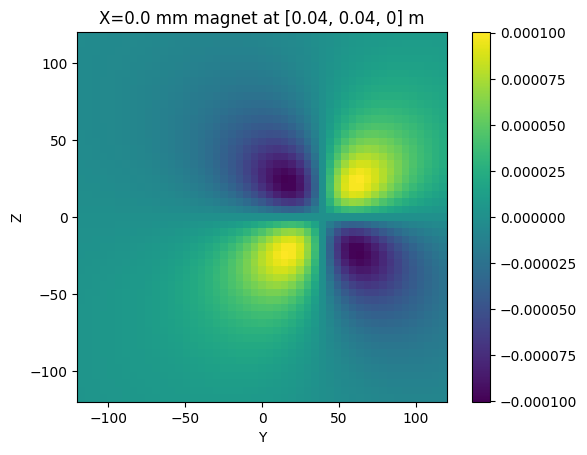

In [947]:

dip_mom = magnetization(bRem=bRem,dimensions=magSizeOuter)
dip_vec = mu*np.array([0,dip_mom,0]) #initially along y


def NEW_singleMagnet(position,dipoleVector,xPts,yPts,zPts):
    '''
    renders 3 components o the field of one magnet in a cubic grid made of xPts, yPts and zPts
    '''
    x,y,z = np.meshgrid(xPts, yPts, zPts, indexing='xy')  
    coord = [x,y,z]
    
    B0 = B0 = np.zeros((len(xPts),len(yPts),len(zPts))+(3,), dtype=np.float32)
    for i in range(len(xPts)):
        for j in range(len(yPts)):
            for k in range(len(zPts)):
                x_i = xPts[i]*1e-3-position[0]
                y_j = yPts[j]*1e-3-position[1]
                z_k = zPts[k]*1e-3-position[2]
                
                rabs = np.sqrt((x_i)**2+(y_j)**2+(z_k)**2)
                
                m_x = dipoleVector[0]
                m_y = dipoleVector[1]
                m_z = dipoleVector[2]
                
                
                
                B0[i,j,k,0] = 3*x_i*(m_x*x_i+m_y*y_j+m_z*z_k)/rabs**5 - m_x/rabs**3
                B0[i,j,k,1] = 3*y_j*(m_x*x_i+m_y*y_j+m_z*z_k)/rabs**5 - m_y/rabs**3
                B0[i,j,k,2] = 3*z_k*(m_x*x_i+m_y*y_j+m_z*z_k)/rabs**5 - m_z/rabs**3
            
    
    return B0
    
xpts = b0map_iter2_SHELL.xDim_SPH_fine
ypts = b0map_iter2_SHELL.yDim_SPH_fine
zpts = b0map_iter2_SHELL.zDim_SPH_fine

positionofsinglemagnet = [40e-3,40e-3,0]
onemagnetfield = NEW_singleMagnet(position=positionofsinglemagnet,dipoleVector=dip_vec,xPts = xpts,yPts=ypts,zPts=zpts)     

plt.show()
xsliceidx = int(len(xpts)/2)
plt.imshow(np.transpose(onemagnetfield[xsliceidx,:,:,2]),origin='lower',extent=[np.nanmin(ypts),np.nanmax(ypts),np.nanmin(zpts),np.nanmax(zpts)])
plt.title('X=%.1f mm '%xpts[xsliceidx]+'magnet at '+str(positionofsinglemagnet)+' m')
plt.xlabel('Y')
plt.ylabel('Z')
plt.colorbar()

In [948]:
# Rendering shim magnets fields

shimming_magnets_iter_3 = []

for idx1, position in enumerate(positions_iter_3):
    magnet = shimming_magnet.shimming_magnet(position=position,rotation_yz=0)
    magnet.bRem = bRem# 1.35 T
    magnet.render_field(grid=coordinate_grid)
    
    
    print('rendering magnet # ',str(idx1),' at ',str(position))
    magnetFields_iter_3[:,:,:,:,idx1] = NEW_singleMagnet(position=position,dipoleVector=dip_vec,xPts=b0map_iter2_SHELL.xDim_SPH_fine,yPts=b0map_iter2_SHELL.yDim_SPH_fine,zPts = b0map_iter2_SHELL.zDim_SPH_fine)
    
    shimming_magnets_iter_3.append(magnet)
    
    
    print(magnet)

magnetFields_iter_3 *= 1e3

print(DSV)

magnet created, dipole points to  [0. 1. 0.]
ROTATION OF EXPENSIVE MAGNET:0
[0.00000000e+00 2.32047907e-08 0.00000000e+00]
1.35
rendering magnet #  0  at  [-0.1755, 0.27211479674710887, -0.04614691096140277]
magnet created, dipole points to  [0. 1. 0.]
ROTATION OF EXPENSIVE MAGNET:0
[0.00000000e+00 2.32047907e-08 0.00000000e+00]
1.35
rendering magnet #  1  at  [-0.1755, 0.2742709847847707, -0.030845208788272026]
magnet created, dipole points to  [0. 1. 0.]
ROTATION OF EXPENSIVE MAGNET:0
[0.00000000e+00 2.32047907e-08 0.00000000e+00]
1.35
rendering magnet #  2  at  [-0.1755, 0.27556740718070843, -0.015446815196073495]
magnet created, dipole points to  [0. 1. 0.]
ROTATION OF EXPENSIVE MAGNET:0
[0.00000000e+00 2.32047907e-08 0.00000000e+00]
1.35
rendering magnet #  3  at  [-0.1755, 0.276, 0.0]
magnet created, dipole points to  [0. 1. 0.]
ROTATION OF EXPENSIVE MAGNET:0
[0.00000000e+00 2.32047907e-08 0.00000000e+00]
1.35
rendering magnet #  4  at  [-0.1755, 0.27556740718070843, 0.0154468151

# Visualizing field of one shim magnet

magnet at  [-175.5         272.11479675  -46.14691096]


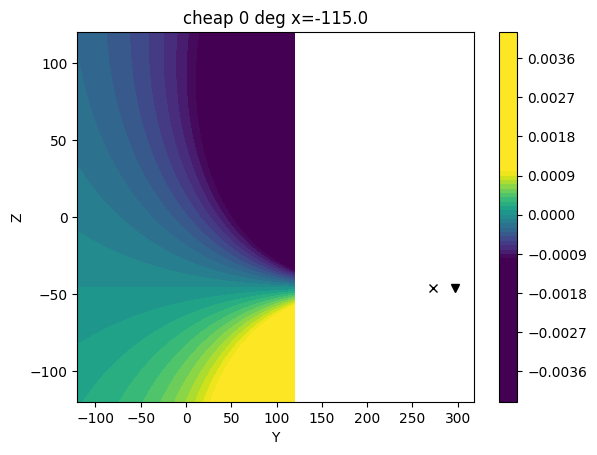

ROTATION OF EXPENSIVE MAGNET:-0
[ 0.00000000e+00  2.32047907e-08 -0.00000000e+00]
1.35


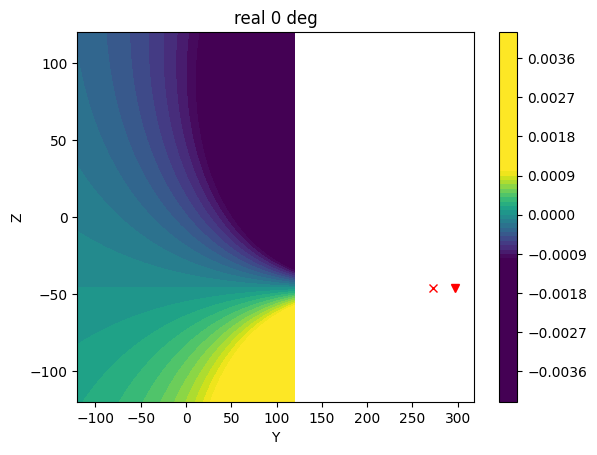

magnet at  [-175.5         272.11479675  -46.14691096]


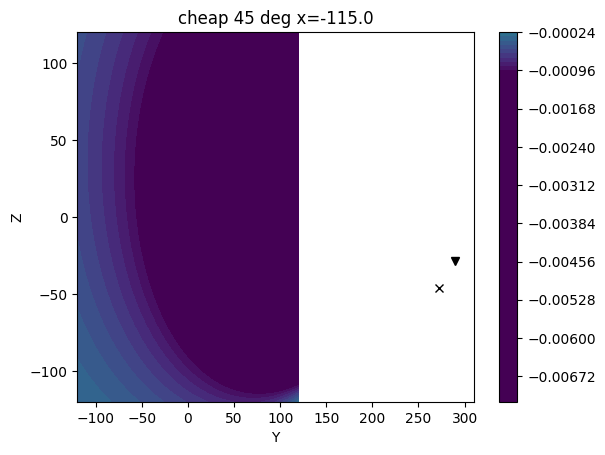

ROTATION OF EXPENSIVE MAGNET:-45
[ 0.00000000e+00  1.64082649e-08 -1.64082649e-08]
1.35


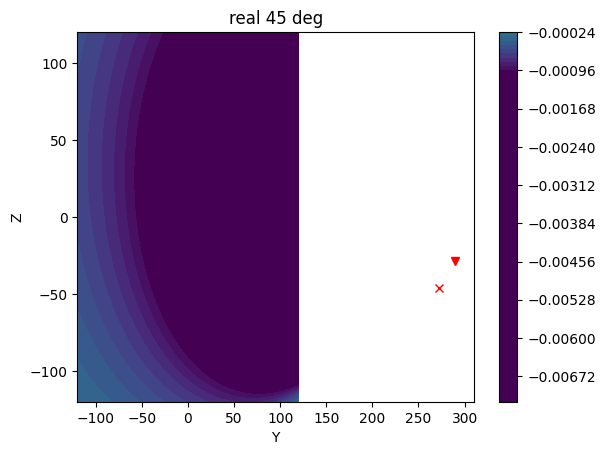

magnet at  [-175.5         272.11479675  -46.14691096]


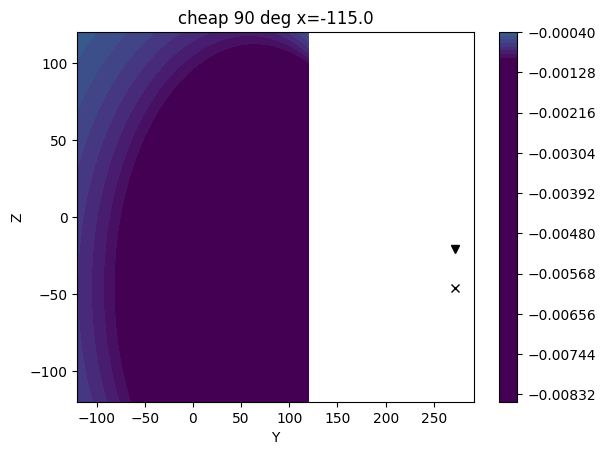

ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35


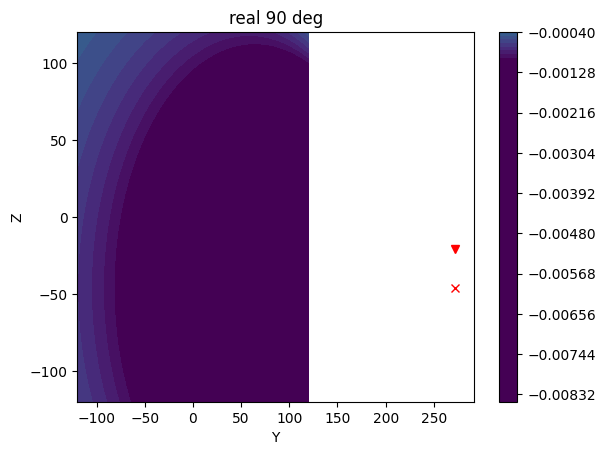

In [931]:
# cheap vs real fields
# DO NOT RUN
plt.cla()

x = b0map_iter2_SHELL.xDim_SPH_fine*1e0
y = b0map_iter2_SHELL.yDim_SPH_fine*1e0
z = b0map_iter2_SHELL.zDim_SPH_fine*1e0

magnet_index = 0
yzsliceidx = 1#int(len(x)/2)
v=max(b0map_iter2_SHELL.xDim_SPH_fine)
dipole_pointer_length = 25

for i in range(3):
    alpha = i*2*np.pi/8
    position = positions_iter_3[magnet_index]
    direction = [np.cos(alpha)*dipole_pointer_length,np.sin(alpha)*dipole_pointer_length]
    
    cheapfield = magnetFields_iter_3[yzsliceidx,:,:,2,magnet_index]*np.cos(alpha)-magnetFields_iter_3[yzsliceidx,:,:,1,magnet_index]*np.sin(alpha)
    
    print('magnet at ', np.array(positions_iter_3[magnet_index])*1e3)
    plt.contourf(y,z,np.transpose(cheapfield),vmin=-1e-3, vmax=1e-3,levels=100)
    plt.plot(position[1]*1e3,position[2]*1e3,'xk')
    plt.plot(position[1]*1e3+direction[0],position[2]*1e3+direction[1],'vk')
    
    plt.title('cheap %.0f deg x=%.1f'%(alpha*180/np.pi,b0map_iter2_SHELL.xDim_SPH_fine[yzsliceidx]))
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.colorbar()
    plt.show()
    
    magnet = shimming_magnets_iter_3[magnet_index]
    magnet.rotation_yz = -alpha
    magnet.bRem = bRem
    magnet.B0 = magnet.B0*0
    magnet.render_field(grid=coordinate_grid)
    magnet.B0*=1e3

    plt.contourf(y,z,np.transpose(magnet.B0[yzsliceidx,:,:,2]),vmin=-1e-3, vmax=1e-3,levels=100)
    plt.plot(position[1]*1e3,position[2]*1e3,'xr')
    plt.plot(position[1]*1e3+direction[0],position[2]*1e3+direction[1],'vr')
    plt.title('real %.0f deg'%(alpha*180/np.pi))
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.colorbar()
    plt.show()
    
    # # DIFF
    # plt.imshow(1e3*(magnet.B0[yzsliceidx,:,:,1])-cheapfield,vmin=-1e-9, vmax=1e-9,extent=[-v,v,-v,v],origin='lower')#!!!!!!!!! 240912
    # plt.title('real-cheap %.0f deg'%(alpha*180/np.pi))
    # plt.xlabel('Z')
    # plt.ylabel('Y')
    # plt.colorbar()
    # plt.show()
    
    
    # ax = plt.subplot(1,1,1)
    # mpbl = ax.contourf(y2d,z2d,(1e3*(magnet.B0[yzsliceidx,:,:,1])),cmap='viridis',levels=64,vmin=-1e-3, vmax=1e-3)#,vmin = -scale, vmax= scale)
    # ax.set_aspect('equal')
    
    # plt.xlabel('Y')
    # plt.ylabel('Z')
    # plt.title('contourf %.0f deg'%(alpha*180/np.pi))
    # plt.show()

# Visualizing the field of **all** shim magnets of Iteration 3

### checking the field produced at different rotations

### plotting the field at one slice

ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90
[ 0.00000000e+00  1.42088363e-24 -2.32047907e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-90

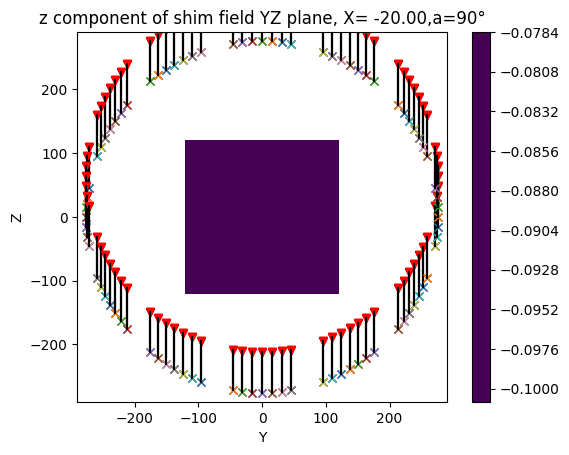

In [932]:
# visualize the field of one insert
resolution = 1/resolution_of_sph_fit*1e3

x = b0map_iter2_SHELL.xDim_SPH_fine*1e0
y = b0map_iter2_SHELL.yDim_SPH_fine*1e0
z = b0map_iter2_SHELL.zDim_SPH_fine*1e0

ONEINSERTFIELD = shimming_magnets_iter_3[0].B0*0

ax = plt.figure().add_subplot()

for idx in range(len(positions_iter_3)): #range(40):#

    position = positions_iter_3[idx]

    alpha =  np.pi/2#optimized_vector_of_magnet_rotations[idx]#np.pi
    
    magnet = shimming_magnets_iter_3[idx]
    magnet.rotation_yz = -alpha 
    magnet.bRem = bRem
    magnet.render_field(grid=coordinate_grid)
    print(shimming_magnets_iter_3[idx])

    ONEINSERTFIELD += magnet.B0  #magnetFields[:,:,:,:,idx]#+magnetFields[:,:,:,:,idx+14]

    
    ax.plot(position[1]*1000,position[2]*1000,'x')
    dispveclen = 64 # len of arrow
    direction = [dispveclen*np.cos(alpha),dispveclen*np.sin(alpha)] #!!!!!!!!! 240916
    ax.plot(position[1]*1000+direction[0],position[2]*1000+direction[1],'rv')
    
    ax.plot([position[1]*1000,position[1]*1000+direction[0]],[position[2]*1000,position[2]*1000+direction[1]],'k-')

ONEINSERTFIELD*=1e3 #mT
scale = 0.1
yzsliceindex = 20
mpbl = ax.contourf(y,z,np.transpose(ONEINSERTFIELD[yzsliceindex,:,:,2]),cmap='viridis',levels=64,vmin = -scale, vmax= scale)#,vmin=np.nanmin(ONEINSERTFIELD[:,:,:,2]),vmax=np.nanmax(ONEINSERTFIELD[:,:,:,2]))#,vmin = -scale, vmax= scale)

plt.colorbar(mappable=mpbl)
#ax.plot(min(Y),min(Z),'ko')
#ax.plot(max(Y),max(Z),'ko')

ax.set_xlabel('Y')
ax.set_ylabel('Z')
ax.set_xlim(-290,290)
ax.set_ylim(-290,290)
ax.set_aspect(1)
                
ax.set_title('z component of shim field YZ plane, X= %.2f,a=%.0f°'%(x[yzsliceindex],alpha*180/np.pi))

plt.savefig('./pics/field_of_ALL_INSERTS_ITER2_INITIAL.png',format="png")
plt.savefig('./pics/field_of_ALL_INSERTS_ITER2_INITIAL.pdf',format="pdf")

plt.show()

# Rendering field of shim magnets
### in the volume of the ball

In [933]:
MagnetsField_simulated = shimming_magnets_iter_3[0].B0[:,:,:,2]*0
    

for magnet_index, pos in enumerate(positions_iter_3):
    print(pos)
    alpha = np.pi/2#-np.pi/2#np.pi/2#np.pi/2#!TEMP-np.pi/2
    cheapfield_onemagnet = magnetFields_iter_3[:,:,:,2,magnet_index]*np.cos(alpha)-magnetFields_iter_3[:,:,:,1,magnet_index]*np.sin(alpha)

    MagnetsField_simulated += cheapfield_onemagnet
    
    
    
#mask the one magnet field:
MagnetsField_simulated*= b0map_iter2_SHELL.sphere_mask
#MagnetsField_simulated*=1e3 

print('mean mT %.2f'%(abs(np.nanmin(MagnetsField_simulated))))

[-0.1755, 0.27211479674710887, -0.04614691096140277]
[-0.1755, 0.2742709847847707, -0.030845208788272026]
[-0.1755, 0.27556740718070843, -0.015446815196073495]
[-0.1755, 0.276, 0.0]
[-0.1755, 0.27556740718070843, 0.0154468151960735]
[-0.1755, 0.2742709847847707, 0.030845208788272037]
[-0.1755, 0.27211479674710887, 0.04614691096140277]
[-0.1755, 0.2587317822093368, 0.09609300117480107]
[-0.1755, 0.2529482447387227, 0.11042275799670676]
[-0.1755, 0.2463717826715406, 0.12440636922299107]
[-0.1755, 0.2390230114445051, 0.13799999999999998]
[-0.1755, 0.2309249674754671, 0.15116103795771738]
[-0.1755, 0.22210303595045067, 0.16384822678806393]
[-0.1755, 0.21258487124793404, 0.17602179557230782]
[-0.1755, 0.17602179557230782, 0.21258487124793404]
[-0.1755, 0.16384822678806393, 0.22210303595045067]
[-0.1755, 0.15116103795771738, 0.2309249674754671]
[-0.1755, 0.13800000000000004, 0.23902301144450508]
[-0.1755, 0.12440636922299107, 0.2463717826715406]
[-0.1755, 0.11042275799670671, 0.2529482447387

<Figure size 640x480 with 0 Axes>

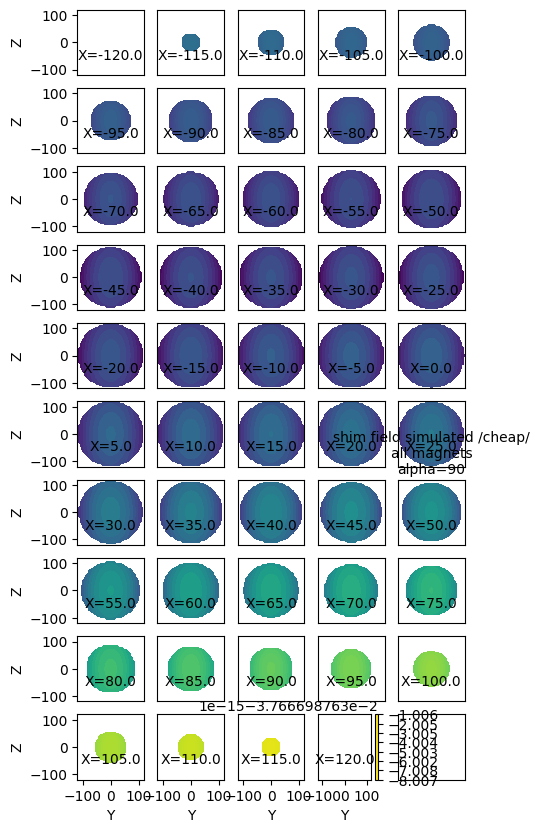

In [934]:
# expected shim field in the ball with all magnets same direction
plt.figure(0)

fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(5, 10))

xvals_fine = b0map_iter2_SHELL.xDim_SPH_fine

for i in range(10):
    for j in range(5):
        if i*5+j >=len(xvals_fine):
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(0.5, 5, 'shim field simulated /cheap/\nall magnets\nalpha=%.0f'%(alpha*180/np.pi) , horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break
        xxx = axes[i,j].contourf(y,z,np.transpose(MagnetsField_simulated[i*5+j,:,:]),vmin=np.nanmin(MagnetsField_simulated),vmax=np.nanmax(MagnetsField_simulated),origin = 'lower',extent=[-120,120,-120,120])
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%xvals_fine[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==9:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        plt.xlabel('Y')
        plt.ylabel('Z')


plt.savefig('./pics/iter2_init_field_interp.png',format="png")
plt.savefig('./pics/iter2_init_field_interp.pdf',format="pdf")
plt.show()

# Masking the shim magnet fields 

### with a spherical mask

# Stacking the components of the masked fields [B_y,B_z] 

(49, 49, 49, 3, 252)


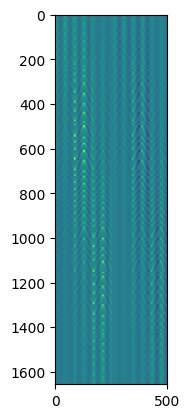

In [935]:
b0map = b0map_iter2_SHELL

DSV = b0map.path.radius*1.98 # 
DSV_INNER = b0map.path.radius*1.95 #!!! the optimization shell is close to the surface, but not at the surface 
# make a spherical mask with diameter DSV
sphereMask = np.zeros(np.shape(coordinate_grid[0]), dtype = float)
sphereMask[np.square(coordinate_grid[0]) + np.square(coordinate_grid[1]) + np.square(coordinate_grid[2]) <= (DSV/2)**2] = 1 
sphereMask[np.square(coordinate_grid[0]) + np.square(coordinate_grid[1]) + np.square(coordinate_grid[2]) <= (DSV_INNER/2)**2] = 0 

sphereMask[sphereMask == 0] = np.nan

print(np.shape(magnetFields_iter_3))

maskedFields = magnetFields_iter_3[sphereMask == 1, :,:].astype(float)
maskedFields_stacked_iter_3 = np.hstack((maskedFields[:,1,:],maskedFields[:,2,:])) # WE HAVE Y AND Z


plt.imshow(maskedFields_stacked_iter_3) #

# Rotating the stacked fields
### with matmul to *-sin* and *cos* of the field components 

In [936]:
print(np.shape(maskedFields_stacked_iter_3))

vector_of_magnet_rotations = np.zeros(len(shimming_magnets_iter_3))

stackedRotationVector = np.hstack([-np.sin(vector_of_magnet_rotations),np.cos(vector_of_magnet_rotations)])


print('shape of masked fields',np.shape(maskedFields_stacked_iter_3))
print('shape of magnet rotation vector',np.shape(vector_of_magnet_rotations))
print('shape of stacked rotation vector',np.shape(stackedRotationVector))

rotatedFieldOfShimMagnetsStacked = np.matmul(maskedFields_stacked_iter_3,stackedRotationVector)

print('nr of field points to optimize',np.shape(rotatedFieldOfShimMagnetsStacked))

initialField_iteration_3 = b0map_iter2_SHELL.interpolatedField

initialFieldMasked_iteration_3 = initialField_iteration_3[sphereMask == 1]




(1656, 504)
shape of masked fields (1656, 504)
shape of magnet rotation vector (252,)
shape of stacked rotation vector (504,)
nr of field points to optimize (1656,)


In [937]:
# ok now we have magnet fields and vector of magnet rotations. we can make fields now
def _dataFitting(shimVector):

            stackedRotationVector = np.hstack([-np.sin(shimVector),np.cos(shimVector)]) #!!!240918
            shimField = np.matmul(maskedFields_stacked_iter_3,stackedRotationVector)+initialFieldMasked_iteration_3

            return np.square(((shimField)/np.mean(shimField)) -1)*1e9

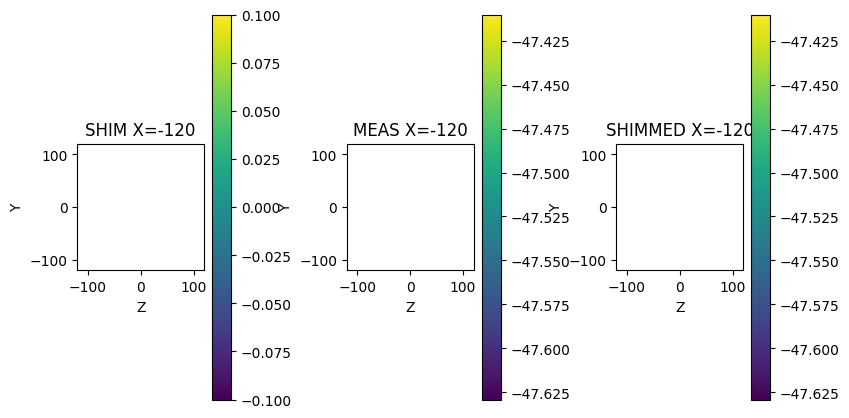

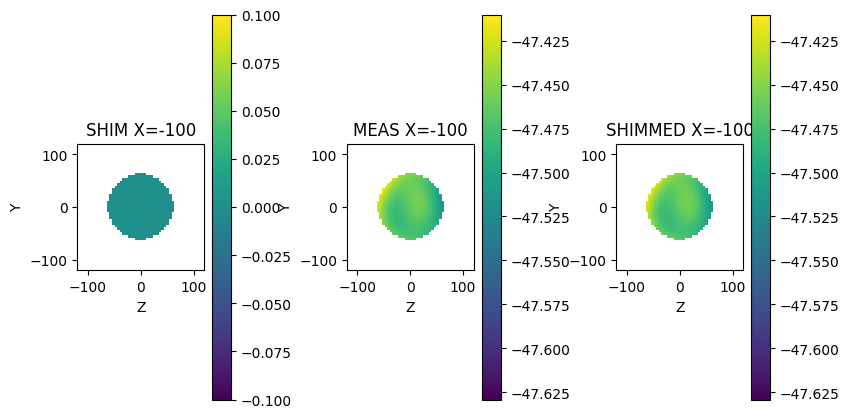

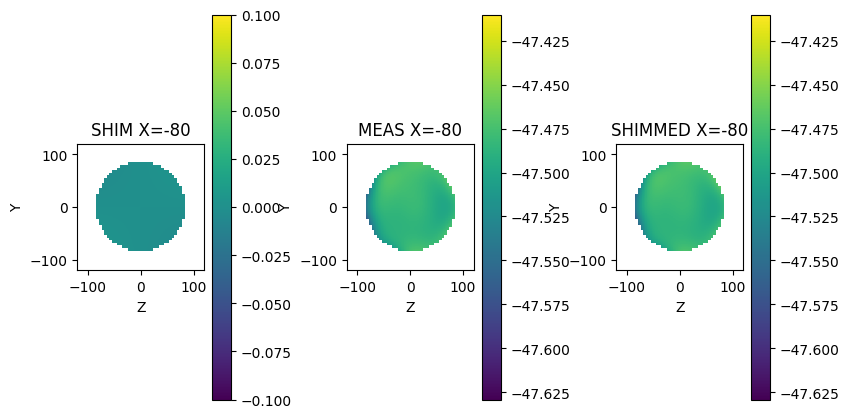

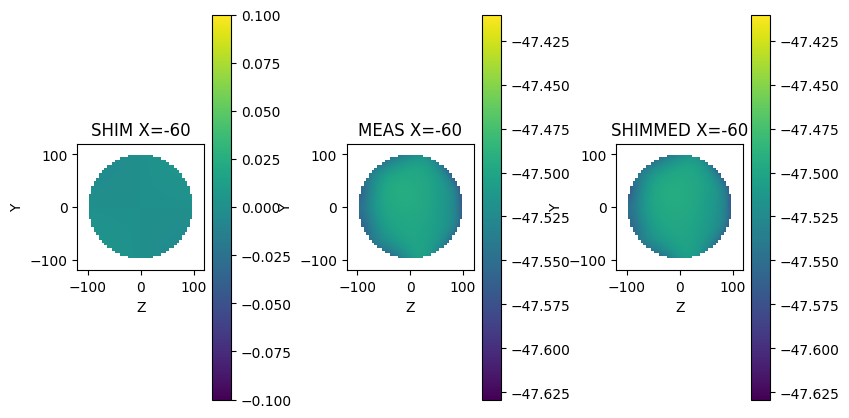

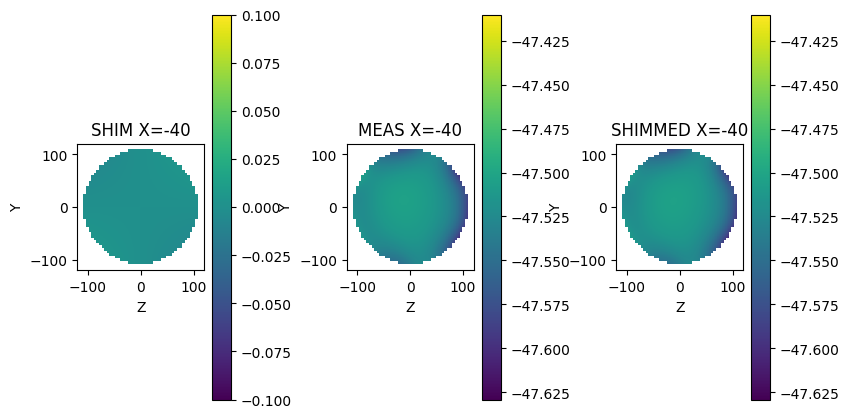

...

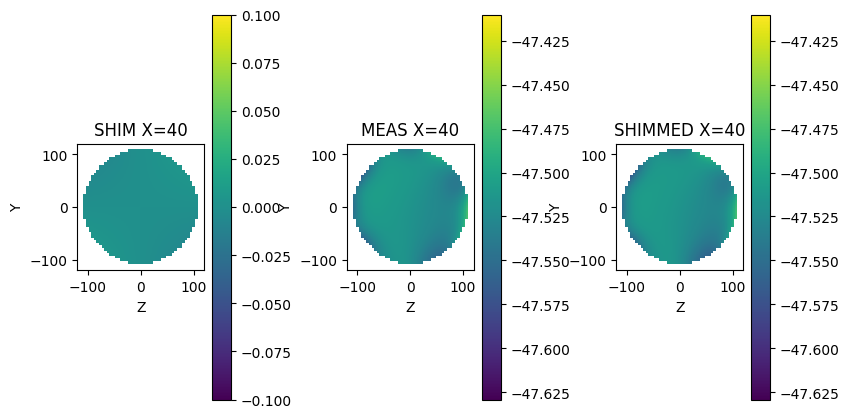

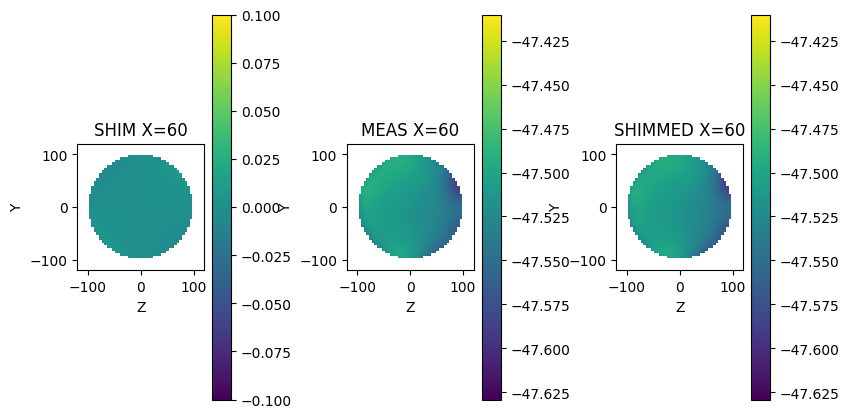

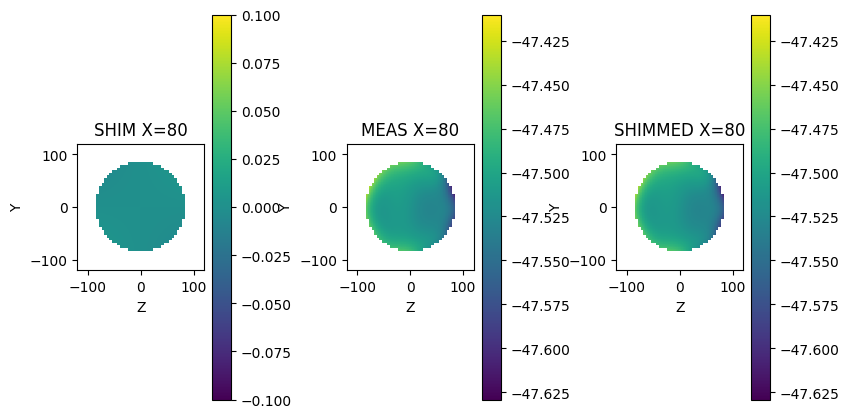

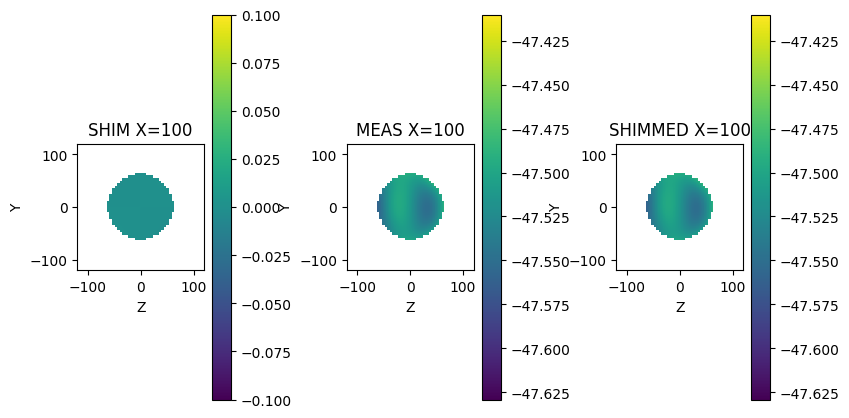

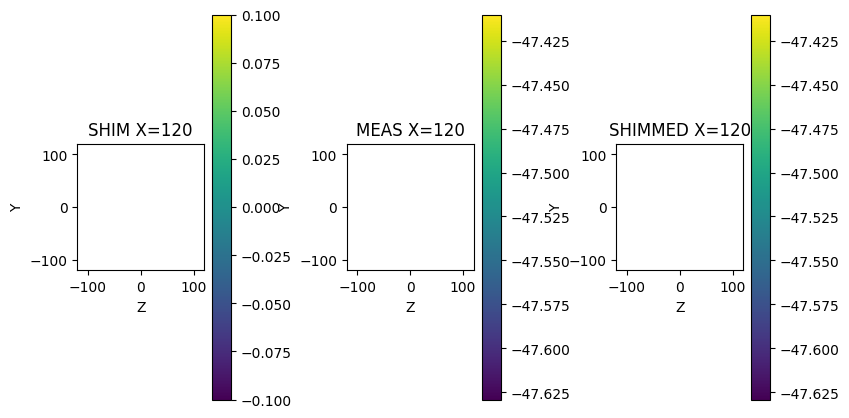

In [938]:
#render the field of rotated magnets
optimized_vector_of_magnet_rotations = np.zeros(len(shimming_magnets_iter_3))#+np.pi/4*8.05#np.random.randint(40)*2*np.pi/40
#optimized_vector_of_magnet_rotations = np.load('optIter3_3rings.npy')
#optimized_vector_of_magnet_rotations = np.load('optIter3_2rings.npy')
#optimized_vector_of_magnet_rotations = np.load('optIter3_1ring.npy')



shimField_Rotated = np.matmul(magnetFields_iter_3[...,1,:], -np.sin(optimized_vector_of_magnet_rotations)) + np.matmul(magnetFields_iter_3[...,2,:], np.cos(optimized_vector_of_magnet_rotations))
shimField_Rotated*=b0map_iter2_SHELL.sphere_mask

FieldShimmed = initialField_iteration_3+shimField_Rotated


shimoffset = np.nanmean(FieldShimmed)-np.nanmean(initialField)



for slicenr in range(0,len(xvals_fine),int(len(xvals_fine)/10)):
#slicenr = 17
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(9,5))
    xxx = axes[0].imshow(shimField_Rotated[slicenr,:,:],vmin=-1e-1,vmax=1e-1,origin='lower',extent=[-120,120,-120,120])
    plt.colorbar(mappable=xxx)
    axes[0].set_title('SHIM X=%.0f'%xvals_fine[slicenr])
    axes[0].set_xlabel('Z')
    axes[0].set_ylabel('Y')
    
    
    xxx = axes[1].imshow(initialField_iteration_3[slicenr,:,:],origin='lower',vmin=np.nanmin(initialField_iteration_3[:,:,:]),vmax = np.nanmax(initialField_iteration_3[:,:,:]),extent=[-120,120,-120,120])
    plt.colorbar(mappable=xxx)
    axes[1].set_title('MEAS X=%.0f'%xvals_fine[slicenr])
    axes[1].set_xlabel('Z')
    axes[1].set_ylabel('Y')
    

    xxx = axes[2].imshow(FieldShimmed[slicenr,:,:],origin='lower',
            vmin=np.nanmin(initialField[:,:,:]+shimoffset),
            vmax = np.nanmax(initialField[:,:,:]+shimoffset),
            extent=[-120,120,-120,120])
    plt.colorbar(mappable = xxx)
    axes[2].set_xlabel('Z')
    axes[2].set_ylabel('Y')
    
    axes[2].set_title('SHIMMED X=%.0f'%xvals_fine[slicenr])
    axes[2].set_xlabel('Z')
    axes[2].set_ylabel('Y')
    
    plt.subplots_adjust(wspace=0.7)
    plt.show()



# run the lsq optimization of the rotation vector

In [939]:
# now do the least squares optimization
#vector_of_magnet_rotations =np.load('optIter3_2rings.npy')# 2 ring shim
#vector_of_magnet_rotations =np.load('optIter3_1ring.npy')# 2 ring shim
vector_of_magnet_rotations =np.load('optIter3_3rings.npy')# 2 ring shim

#vector_of_magnet_rotations = np.zeros(len(shimming_magnets_iter_3))#+0*np.pi/2#vector_of_magnet_rotations*0 ##

cost = _dataFitting(vector_of_magnet_rotations)

print(np.sum(cost))

# least squares optimization of the rotation vector
from scipy.optimize import least_squares

initialGuess = vector_of_magnet_rotations
#initialGuess[initialGuess<0.001] = 0.001
lsqData = least_squares(_dataFitting, initialGuess, max_nfev=10000, xtol = 1e-5,ftol=0, verbose=2,bounds=(initialGuess*0,initialGuess*0+2*np.pi))

optimized_vector_of_magnet_rotations = lsqData.x
#np.save('optIter3_2rings.npy',optimized_vector_of_magnet_rotations)
np.save('optIter3_3rings.npy',optimized_vector_of_magnet_rotations)

776098.7275259212
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         4.6468e+08                                    4.45e+07    


C:\Users\kuliko02\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\scipy\optimize\_lsq\least_squares.py:824: UserWarning: Setting `ftol` below the machine epsilon (2.22e-16) effectively disables the corresponding termination condition.
  ftol, xtol, gtol = check_tolerance(ftol, xtol, gtol, method)


       1              2         4.3745e+08      2.72e+07       1.75e+00       2.59e+07    
       2              3         4.3063e+08      6.82e+06       7.73e-01       3.43e+07    
       3              4         4.2639e+08      4.24e+06       4.11e-01       2.06e+07    
       4              5         4.2405e+08      2.34e+06       3.65e-01       2.19e+07    
       5              6         4.2224e+08      1.81e+06       2.95e-01       1.65e+07    
       6              7         4.2055e+08      1.69e+06       3.21e-01       1.91e+07    
       7              8         4.1857e+08      1.98e+06       1.34e+00       1.78e+07    
       8              9         4.1548e+08      3.09e+06       1.27e+00       1.80e+07    
       9             10         4.1312e+08      2.36e+06       1.44e+00       8.46e+06    
      10             12         4.0363e+08      9.49e+06       2.03e+00       7.66e+06    
      11             13         4.0128e+08      2.35e+06       9.27e-01       7.56e+06    

In [940]:

shimField_Rendered = shimming_magnets_iter_3[0].B0[:,:,:,2]*0 # container for the shimmed field

# render the shim field by given rotations of each shimming magnet
for idx, magnet in enumerate(shimming_magnets_iter_3):
    alpha = optimized_vector_of_magnet_rotations[idx]

    magnet.rotation_yz = -alpha # beware of the sign
    magnet.bRem = bRem*1
    magnet.render_field(grid=coordinate_grid)
    shimField_Rendered += magnet.B0[:,:,:,2]

shimField_Rendered *= 1.0e3

shimmed_Field_simulated_RENDERED = initialField_iteration_3 +shimField_Rendered # shimmed field computed with rendering fields of each magnet
shimField_Rotated = np.matmul(magnetFields_iter_3[...,1,:], -np.sin(lsqData.x)) + \
    np.matmul(magnetFields_iter_3[...,2,:], np.cos(lsqData.x)) # shimmed field computed with rotating the pre-rendered fields

shimmed_Field_simulated_ROTATED = initialField_iteration_3+shimField_Rotated

homoinit = (np.nanmax(initialField_iteration_3)-np.nanmin(initialField_iteration_3))/np.nanmean(initialField_iteration_3)*1e6
homo_cheap = (np.nanmax(shimmed_Field_simulated_ROTATED)-np.nanmin(shimmed_Field_simulated_ROTATED))/np.nanmean(shimmed_Field_simulated_ROTATED)*1e6
print('homo cheap ppm %.0f -> %.0f'%(abs(homoinit),abs(homo_cheap)))
print('mean mT %.2f -> %.2f'%(abs(np.nanmean(initialField_iteration_3)),abs(np.nanmean(shimmed_Field_simulated_ROTATED))))


homoinit = (np.nanmax(initialField_iteration_3)-np.nanmin(initialField_iteration_3))/np.nanmean(initialField_iteration_3)*1e6
homo_fair = (np.nanmax(shimmed_Field_simulated_RENDERED)-np.nanmin(shimmed_Field_simulated_RENDERED))/np.nanmean(shimmed_Field_simulated_RENDERED)*1e6
print('homo fair ppm %.0f -> %.0f'%(abs(homoinit),abs(homo_fair)))
print('mean mT %.2f -> %.2f'%(abs(np.nanmean(initialField_iteration_3)),abs(np.nanmean(shimmed_Field_simulated_RENDERED))))

shimoffset = np.nanmean(shimmed_Field_simulated_ROTATED) - np.nanmean(initialField_iteration_3)
#d = np.shape(coordinate_grid[0])
#print(d[0])

ROTATION OF EXPENSIVE MAGNET:-83
[ 0.00000000e+00  2.74499270e-09 -2.30418603e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-88
[ 0.00000000e+00  9.34305899e-10 -2.31859739e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-92
[ 0.00000000e+00 -8.44436877e-10 -2.31894208e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-96
[ 0.00000000e+00 -2.59229679e-09 -2.30595383e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-101
[ 0.00000000e+00 -4.35499236e-09 -2.27924626e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-105
[ 0.00000000e+00 -6.15290892e-09 -2.23741821e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-110
[ 0.00000000e+00 -8.00149161e-09 -2.17816079e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-129
[ 0.00000000e+00 -1.45361520e-08 -1.80876366e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-135
[ 0.00000000e+00 -1.64614869e-08 -1.63548697e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-142
[ 0.0000000e+00 -1.8278425e-08 -1.4295506e-08]
1.35
ROTATION OF EXPENSIVE MAGNET:-149
[ 0.00000000e+00 -1.99049413e-08 -1.19270962e-08]
1.35
ROTATION OF EXPENSIVE MAGNET

# plot the simulated shimmed field

<Figure size 640x480 with 0 Axes>

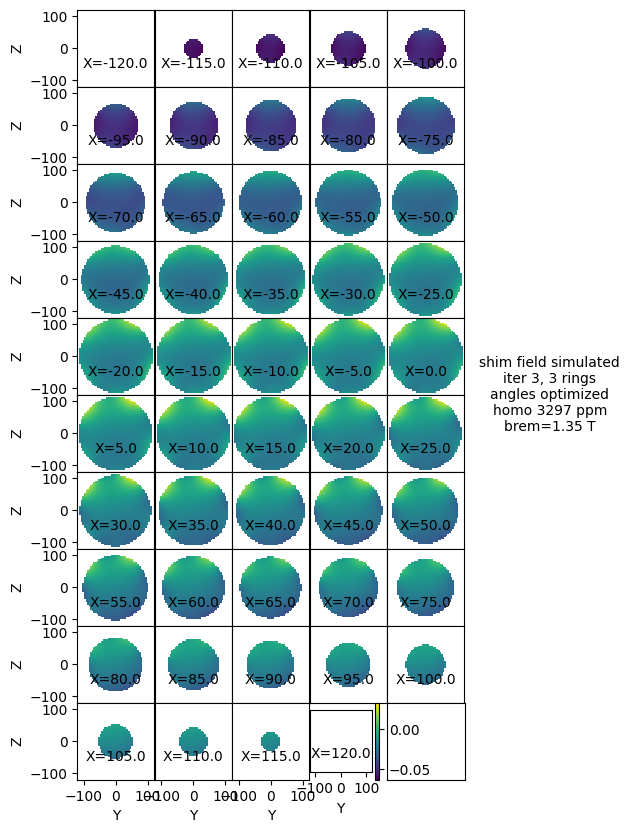

In [941]:
# SHIM FIELD
plt.figure(0)

fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(5, 10))

xvals_fine = b0map_iter2_SHELL.xDim_SPH_fine

simulated_shim_Field_masked = shimField_Rendered*b0map_iter2_SHELL.sphere_mask


for i in range(10):
    for j in range(5):
        if i*5+j >=len(xvals_fine):
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(2.1, 5, 'shim field simulated\niter 3, 3 rings\nangles optimized\nhomo %.0f ppm\nbrem=%.2f T'%(abs(homo_fair),shimming_magnets_iter_3[0].bRem), horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break
        xxx = axes[i,j].imshow(np.transpose(simulated_shim_Field_masked[i*5+j,:,:]),clim=[np.nanmin(simulated_shim_Field_masked),np.nanmax(simulated_shim_Field_masked)],origin = 'lower',extent=[-120,120,-120,120])
        #xxx = axes[i,j].contourf(y,z,np.transpose(optimized_shim_Field_masked[i*5+j,:,:]),vmin=np.nanmin(optimized_shim_Field_masked),vmax=np.nanmax(optimized_shim_Field_masked),levels=16)
        
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%xvals_fine[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==9:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        axes[i,j].set_aspect(1)
        
        #plt.xlabel('Z')
        #plt.ylabel('Y')
        
plt.subplots_adjust(wspace=-0.0, hspace=0)
plt.savefig('./pics/shim_field_ITER3_1RING.png',format="png")
plt.savefig('./pics/shim_field_ITER3_1RING.pdf',format="pdf")
plt.show()


# plot simulated shimmed field

shimmed simulated HOMO,ppm: 3297.3998248012786


<Figure size 640x480 with 0 Axes>

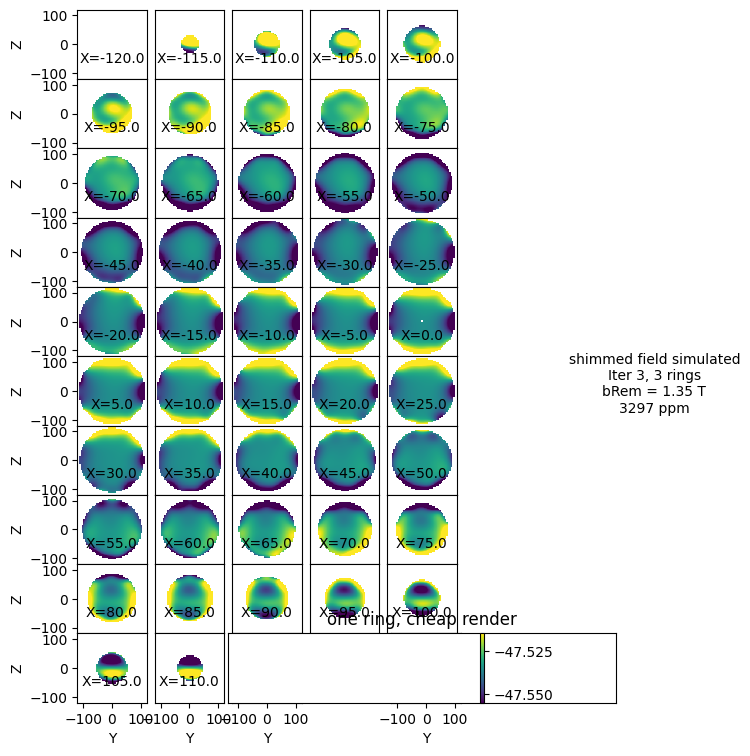

In [942]:

# SHIMMED field
plt.figure(0)

fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(9, 9))

SIMULATED_SHIMMED_FIELD_TO_PLOT = shimmed_Field_simulated_RENDERED

shimoffset = np.nanmean(SIMULATED_SHIMMED_FIELD_TO_PLOT) - np.nanmean(FieldMeasured_init)

homoshimmed = abs((np.nanmax(SIMULATED_SHIMMED_FIELD_TO_PLOT)-np.nanmin(SIMULATED_SHIMMED_FIELD_TO_PLOT))/np.nanmean(SIMULATED_SHIMMED_FIELD_TO_PLOT)*1e6)
#homoshimmed = abs((np.nanmax(shimmed_Field_simulated_flipped_Y)-np.nanmin(shimmed_Field_simulated_flipped_Y))/np.nanmean(shimmed_Field_simulated_flipped_Y)*1e6)

print('shimmed simulated HOMO,ppm:',homoshimmed)

xvals_raw = b0map_iter2_SHELL.xDim_SPH_fine

for i in range(10):
    for j in range(5):
        if i*5+j >=len(xvals_raw):
            plt.colorbar(mappable=xxx)
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
            axes[i,j].text(1.1, 4.6, 'shimmed field simulated\nIter 3, 3 rings\nbRem = %.2f T\n%.0f ppm'%(shimming_magnets[0].bRem,homoshimmed) , horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
            break

        #xxx = axes[i,j].contourf(shimmed_Field_final[i*5+j,:,:],vmin=np.nanmin(shimmed_Field_final),vmax=np.nanmax(shimmed_Field_final),origin = 'lower',extent=[-120,120,-120,120])
    
        xxx = axes[i,j].imshow(np.transpose(SIMULATED_SHIMMED_FIELD_TO_PLOT[i*5+j,:,:]),vmin=np.nanmean(SIMULATED_SHIMMED_FIELD_TO_PLOT)-0.02,vmax=np.nanmean(SIMULATED_SHIMMED_FIELD_TO_PLOT)+0.02,origin = 'lower',extent=[-120,120,-120,120])
        #xxx = axes[i,j].imshow(np.transpose(shimmed_Field_simulated_flipped_Y[i*5+j,:,:]),vmin=np.nanmin(shimmed_Field_simulated),vmax=np.nanmax(shimmed_Field_simulated),origin = 'lower',extent=[-120,120,-120,120])
        
        
        axes[i,j].text(0.5, 0.3, 'X=%.1f'%xvals_raw[i*5+j], horizontalalignment='center', verticalalignment='center', transform=axes[i,j].transAxes)
        axes[i,j].xaxis.set_visible(False)
        axes[i,j].yaxis.set_visible(False)
        if i==9:
            axes[i,j].xaxis.set_visible(True)
        if j==0:
            axes[i,j].yaxis.set_visible(True)
            
        axes[i,j].set_xlabel('Y')
        axes[i,j].set_ylabel('Z')
        axes[i,j].set_aspect(1)
        plt.xlabel('Y')
        plt.ylabel('Z')

        
plt.title('one ring, cheap render')        
plt.subplots_adjust(wspace=-0.8, hspace=0.0)
plt.savefig('./pics/shimmed_field_ITER2_1ring.png',format="png")
plt.savefig('./pics/shimmed_field_ITER2_1ring.pdf',format="pdf")
plt.show()




# magnet rotations in rings